In [1]:
import pandas as pd
from sklearn import preprocessing
import matplotlib.pyplot as plt
import numpy as np

In [2]:
file = open("C:/Users\Ayush Chachan/Desktop/Game/NumberAI/Assets/X_Y.txt")
file2 = open("C:/Users\Ayush Chachan/Desktop/Game/NumberAI/Assets/X_YTest2.txt")

In [3]:
l = file.readlines()
l2 = file2.readlines()

In [4]:
X = []
Y = []
cl_var = ["A","B","C","D","E","F","G","H","I","J","K","l","M","N","O","P","Q","R","S","T","U","V","W","X","Y","Z"]
cl_num = -1
Class = []
tup = []
for i in l:
    if (i[0] == "#"):
        cl_num += 1
    else:
        if (i.split(",") != tup): 
            tup = (i.split(","))
            X.append(float(tup[0]))
            Y.append(float(tup[1]))
            Class.append(cl_var[cl_num])
            
        
X2 = []
Y2 = []
cl_var2 = ["A","B","C","D","E","F","G","H","I","J","K","l","M","N","O","P","Q","R","S","T","U","V","W","X","Y","Z"]
cl_num2 = -1
Class2 = []
tup = []
for i in l2:
    if (i[0] == "#"):
        cl_num2 += 1
        
    else:
        if (i.split(",") != tup):
            tup = (i.split(","))
            X2.append(float(tup[0]))
            Y2.append(float(tup[1]))
            Class2.append(cl_var2[cl_num2])
    


In [5]:
data = {"X":X,"Y":Y,"Class":Class}
data_test = {"X":X2,"Y":Y2,"Class":Class2}

In [6]:
dataf = pd.DataFrame(data)
dataf_test = pd.DataFrame(data_test)
print(dataf[dataf["Class"] == "A"])

            X         Y Class
0   -3.411169 -1.318458     A
1   -3.411169 -1.293103     A
2   -3.411169 -1.267748     A
3   -3.411169 -1.242393     A
4   -3.385788 -1.242393     A
..        ...       ...   ...
328  0.142130  1.217039     A
329  0.167511  1.217039     A
330  0.192893  1.217039     A
331  0.218273  1.217039     A
332  0.243654  1.217039     A

[333 rows x 3 columns]


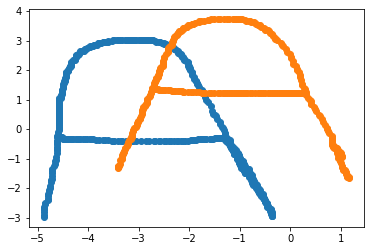

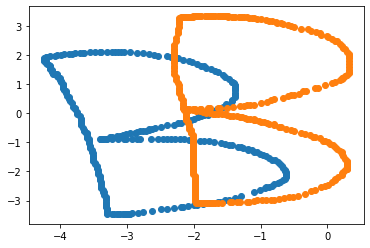

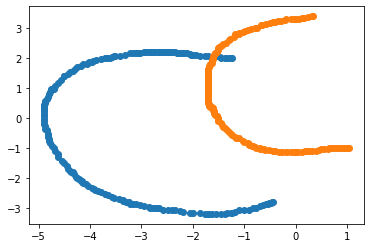

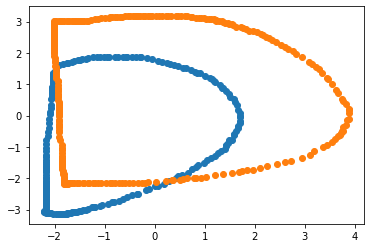

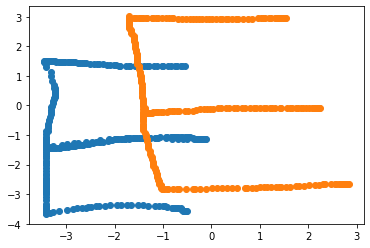

...

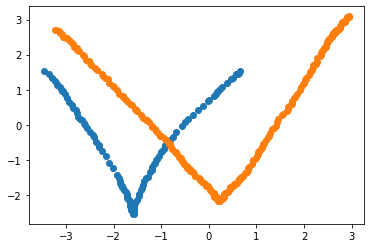

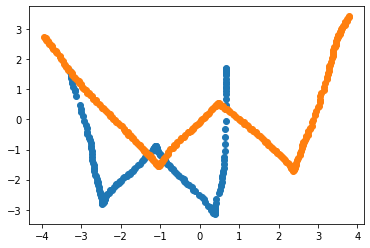

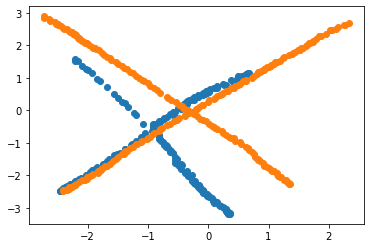

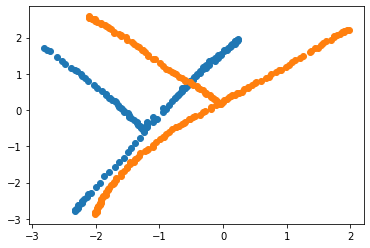

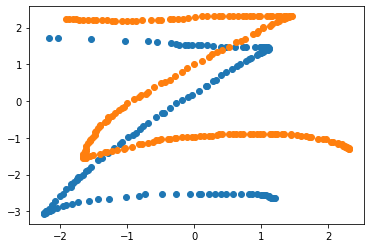

In [7]:
for cls in cl_var:
    plt.scatter(dataf_test[dataf_test["Class"] == cls]["X"],dataf_test[dataf_test["Class"] == cls]["Y"])
    plt.scatter(dataf[dataf["Class"] == cls]["X"],dataf[dataf["Class"] == cls]["Y"])
    plt.show()
    

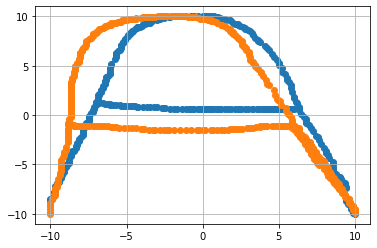

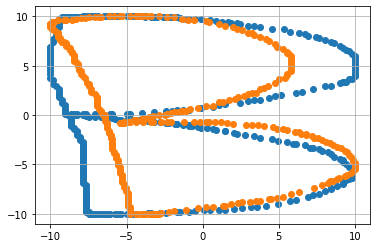

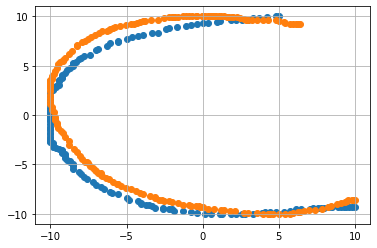

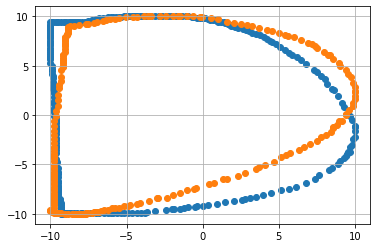

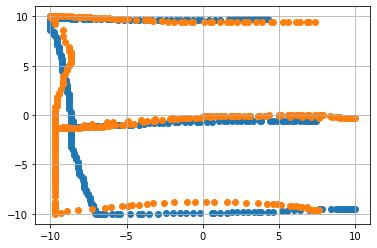

...

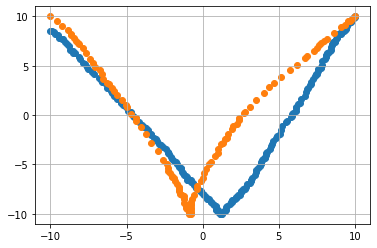

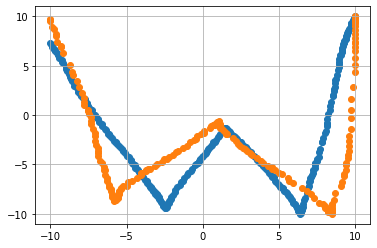

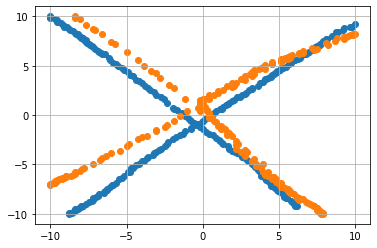

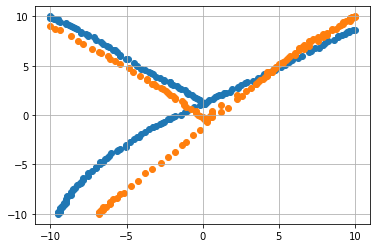

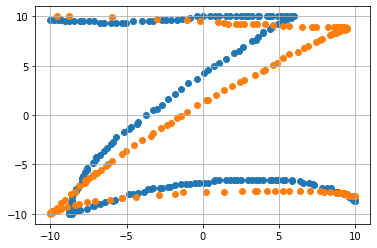

In [8]:
def GetData(data,Class):
    x = data.loc[data["Class"] == Class,"X"]
    y = data.loc[data["Class"] == Class,"Y"]
    x = (20*(x - x.min())/(x.max() - x.min())) - 10
    y = (20*(y - y.min())/(y.max() - y.min())) - 10
    return (x,y)

data_list = {}
for i in cl_var:
    data_list[i] = (GetData(dataf,i),GetData(dataf_test,i))
    plt.scatter(GetData(dataf,i)[0],GetData(dataf,i)[1])
    plt.scatter(GetData(dataf_test,i)[0],GetData(dataf_test,i)[1])
    plt.xticks(range(-10,11,5))
    plt.yticks(range(-10,11,5))
    plt.grid()
    plt.show()


In [9]:
def Correlation(cls,test = 0):
    Array = np.zeros([20,20])
    x = list(data_list[cls][test][0])
    y = list(data_list[cls][test][1])
    for i in range(len(x)):
        n = 10 - int(y[i])
        m = 10 + int(x[i])
        if (10 - int(y[i])) == 20:
            n = 19
        if (10 + int(x[i])) == 20:
            m = 19
        Array[n][m] = int(1)
    Array2 = np.zeros([4,4])
    for row in range(20):
        for column in range(20):
            Array2[row//5][column//5] += Array[row][column]
    return(Array2)
for cls1 in cl_var:
    print("Codis of "+cls1+" : ",Correlation(cls1))
    print("Codis of "+cls1+"1 : ",Correlation(cls1)[0])
    print("Codis of "+cls1+"2 : ",Correlation(cls1)[1])
    print("Codis of "+cls1+"3 : ",Correlation(cls1)[2])
    print("Codis of "+cls1+"4 : ",Correlation(cls1)[3])

def Similarness(cls1,cls2,test = 0):
    sum = 0
    for row in range(4):
        for column in range(4):
            sum += (Correlation(cls1)[row][column] - Correlation(cls2,test)[row][column])**2
    return sum

for cls1 in cl_var:
    for cls2 in cl_var:
        test = 0
        if (cls1 == cls2):
            test = 1
        print(cls1," - ",cls2," : ",Similarness(cls1,cls2,test))

Codis of A :  [[0. 6. 7. 0.]
 [5. 2. 1. 5.]
 [6. 5. 5. 7.]
 [6. 0. 0. 6.]]
Codis of A1 :  [0. 6. 7. 0.]
Codis of A2 :  [5. 2. 1. 5.]
Codis of A3 :  [6. 5. 5. 7.]
Codis of A4 :  [6. 0. 0. 6.]
Codis of B :  [[8. 6. 6. 6.]
 [6. 0. 4. 7.]
 [9. 6. 7. 6.]
 [6. 5. 6. 6.]]
Codis of B1 :  [8. 6. 6. 6.]
Codis of B2 :  [6. 0. 4. 7.]
Codis of B3 :  [9. 6. 7. 6.]
Codis of B4 :  [6. 5. 6. 6.]
Codis of C :  [[3. 5. 6. 0.]
 [8. 0. 0. 0.]
 [7. 0. 0. 0.]
 [5. 6. 5. 5.]]
Codis of C1 :  [3. 5. 6. 0.]
Codis of C2 :  [8. 0. 0. 0.]
Codis of C3 :  [7. 0. 0. 0.]
Codis of C4 :  [5. 6. 5. 5.]
Codis of D :  [[8. 6. 7. 1.]
 [5. 0. 0. 7.]
 [5. 0. 0. 6.]
 [8. 5. 6. 5.]]
Codis of D1 :  [8. 6. 7. 1.]
Codis of D2 :  [5. 0. 0. 7.]
Codis of D3 :  [5. 0. 0. 6.]
Codis of D4 :  [8. 5. 6. 5.]
Codis of E :  [[10.  5.  5.  0.]
 [ 6.  0.  0.  0.]
 [ 7.  6.  5.  3.]
 [ 6.  5.  5.  5.]]
Codis of E1 :  [10.  5.  5.  0.]
Codis of E2 :  [6. 0. 0. 0.]
Codis of E3 :  [7. 6. 5. 3.]
Codis of E4 :  [6. 5. 5. 5.]
Codis of F :  [[11.  5.  

G  -  O  :  119.0
G  -  P  :  414.0
G  -  Q  :  186.0
G  -  R  :  322.0
G  -  S  :  108.0
G  -  T  :  310.0
G  -  U  :  251.0
G  -  V  :  422.0
G  -  W  :  237.0
G  -  X  :  419.0
G  -  Y  :  520.0
G  -  Z  :  216.0
H  -  A  :  149.0
H  -  B  :  180.0
H  -  C  :  322.0
H  -  D  :  245.0
H  -  E  :  224.0
H  -  F  :  313.0
H  -  G  :  271.0
H  -  H  :  8.0
H  -  I  :  475.0
H  -  J  :  496.0
H  -  K  :  220.0
H  -  l  :  256.0
H  -  M  :  262.0
H  -  N  :  165.0
H  -  O  :  222.0
H  -  P  :  315.0
H  -  Q  :  333.0
H  -  R  :  423.0
H  -  S  :  215.0
H  -  T  :  417.0
H  -  U  :  208.0
H  -  V  :  255.0
H  -  W  :  198.0
H  -  X  :  324.0
H  -  Y  :  343.0
H  -  Z  :  439.0
I  -  A  :  364.0
I  -  B  :  327.0
I  -  C  :  213.0
I  -  D  :  240.0
I  -  E  :  211.0
I  -  F  :  376.0
I  -  G  :  276.0
I  -  H  :  475.0
I  -  I  :  178.0
I  -  J  :  165.0
I  -  K  :  377.0
I  -  l  :  243.0
I  -  M  :  471.0
I  -  N  :  564.0
I  -  O  :  237.0
I  -  P  :  416.0
I  -  Q  :  300.0
I  -  R  :  

Y  -  E  :  357.0
Y  -  F  :  176.0
Y  -  G  :  520.0
Y  -  H  :  343.0
Y  -  I  :  346.0
Y  -  J  :  397.0
Y  -  K  :  205.0
Y  -  l  :  317.0
Y  -  M  :  175.0
Y  -  N  :  494.0
Y  -  O  :  469.0
Y  -  P  :  220.0
Y  -  Q  :  594.0
Y  -  R  :  414.0
Y  -  S  :  464.0
Y  -  T  :  312.0
Y  -  U  :  505.0
Y  -  V  :  334.0
Y  -  W  :  521.0
Y  -  X  :  121.0
Y  -  Y  :  104.0
Y  -  Z  :  344.0
Z  -  A  :  264.0
Z  -  B  :  251.0
Z  -  C  :  165.0
Z  -  D  :  196.0
Z  -  E  :  179.0
Z  -  F  :  328.0
Z  -  G  :  216.0
Z  -  H  :  439.0
Z  -  I  :  106.0
Z  -  J  :  185.0
Z  -  K  :  299.0
Z  -  l  :  235.0
Z  -  M  :  443.0
Z  -  N  :  558.0
Z  -  O  :  167.0
Z  -  P  :  360.0
Z  -  Q  :  226.0
Z  -  R  :  276.0
Z  -  S  :  204.0
Z  -  T  :  236.0
Z  -  U  :  331.0
Z  -  V  :  430.0
Z  -  W  :  391.0
Z  -  X  :  353.0
Z  -  Y  :  344.0
Z  -  Z  :  136.0


In [10]:
def Coeff(cls):
    Arry = Correlation(cls1)
    for row in range(len(Arry)):
        print(cls1 ,row," : ",Arry[row][0],",",Arry[row][1],",",Arry[row][2],",",Arry[row][3])
for cls1 in cl_var:
    Coeff(cls1)
        

A 0  :  0.0 , 6.0 , 7.0 , 0.0
A 1  :  5.0 , 2.0 , 1.0 , 5.0
A 2  :  6.0 , 5.0 , 5.0 , 7.0
A 3  :  6.0 , 0.0 , 0.0 , 6.0
B 0  :  8.0 , 6.0 , 6.0 , 6.0
B 1  :  6.0 , 0.0 , 4.0 , 7.0
B 2  :  9.0 , 6.0 , 7.0 , 6.0
B 3  :  6.0 , 5.0 , 6.0 , 6.0
C 0  :  3.0 , 5.0 , 6.0 , 0.0
C 1  :  8.0 , 0.0 , 0.0 , 0.0
C 2  :  7.0 , 0.0 , 0.0 , 0.0
C 3  :  5.0 , 6.0 , 5.0 , 5.0
D 0  :  8.0 , 6.0 , 7.0 , 1.0
D 1  :  5.0 , 0.0 , 0.0 , 7.0
D 2  :  5.0 , 0.0 , 0.0 , 6.0
D 3  :  8.0 , 5.0 , 6.0 , 5.0
E 0  :  10.0 , 5.0 , 5.0 , 0.0
E 1  :  6.0 , 0.0 , 0.0 , 0.0
E 2  :  7.0 , 6.0 , 5.0 , 3.0
E 3  :  6.0 , 5.0 , 5.0 , 5.0
F 0  :  11.0 , 5.0 , 5.0 , 4.0
F 1  :  8.0 , 5.0 , 6.0 , 5.0
F 2  :  5.0 , 0.0 , 0.0 , 0.0
F 3  :  5.0 , 0.0 , 0.0 , 0.0
G 0  :  7.0 , 6.0 , 7.0 , 0.0
G 1  :  6.0 , 0.0 , 1.0 , 0.0
G 2  :  7.0 , 0.0 , 8.0 , 6.0
G 3  :  6.0 , 6.0 , 6.0 , 7.0
H 0  :  5.0 , 0.0 , 0.0 , 5.0
H 1  :  6.0 , 0.0 , 0.0 , 6.0
H 2  :  7.0 , 5.0 , 5.0 , 9.0
H 3  :  5.0 , 0.0 , 0.0 , 5.0
I 0  :  6.0 , 8.0 , 5.0 , 4.0
I 1  :  

[[7. 5. 6. 5.]
 [5. 1. 7. 5.]
 [7. 5. 5. 7.]
 [7. 7. 5. 6.]]
A- [Shape] :  189.0
B- [Shape] :  34.0
C- [Shape] :  230.0
D- [Shape] :  135.0
E- [Shape] :  134.0
F- [Shape] :  261.0
G- [Shape] :  129.0
H- [Shape] :  200.0
I- [Shape] :  267.0
J- [Shape] :  252.0
K- [Shape] :  218.0
l- [Shape] :  274.0
M- [Shape] :  240.0
N- [Shape] :  341.0
O- [Shape] :  118.0
P- [Shape] :  265.0
Q- [Shape] :  147.0
R- [Shape] :  237.0
S- [Shape] :  147.0
T- [Shape] :  321.0
U- [Shape] :  224.0
V- [Shape] :  327.0
W- [Shape] :  220.0
X- [Shape] :  270.0
Y- [Shape] :  337.0
Z- [Shape] :  177.0
[189.0, 34.0, 230.0, 135.0, 134.0, 261.0, 129.0, 200.0, 267.0, 252.0, 218.0, 274.0, 240.0, 341.0, 118.0, 265.0, 147.0, 237.0, 147.0, 321.0, 224.0, 327.0, 220.0, 270.0, 337.0, 177.0]


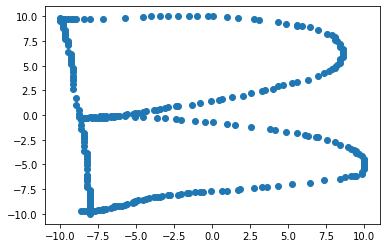

In [11]:
file3 = open("C:/Users\Ayush Chachan/Desktop/Game/NumberAI/Assets/X_Y_test2.txt")
l3 = file3.readlines()
X = []
Y = []
cl_var = ["A","B","C","D","E","F","G","H","I","J","K","l","M","N","O","P","Q","R","S","T","U","V","W","X","Y","Z"]
cl_num = -1
Class = []
tup = []
for i in l3:
  
    if (i[0] == "#"):
        cl_num += 1
    elif(i[0] == " "):
        pass
    else:
        if (i.split(",") != tup): 
            tup = (i.split(","))
            X.append(float(tup[0]))
            Y.append(float(tup[1]))
            Class.append(cl_var[cl_num])
plt.scatter(X,Y)
def Correlation2(X,Y):
    Array = np.zeros([20,20])
    x = X
    y = Y
    for i in range(len(x)):
        n = 10 - int(y[i])
        m = 10 + int(x[i])
        if (10 - int(y[i])) == 20:
            n = 19
        if (10 + int(x[i])) == 20:
            m = 19
        Array[n][m] = int(1)
    Array2 = np.zeros([4,4])
    for row in range(20):
        for column in range(20):
            Array2[row//5][column//5] += Array[row][column]
    return(Array2)
print(Correlation2(X,Y))
def Similarness(Array,cls2,test = 0):
    sum = 0
    for row in range(4):
        for column in range(4):
            sum += (Array[row][column] - Correlation(cls2,test)[row][column])**2
    return sum

ar = Correlation2(X,Y)
values = []
for cls in cl_var:
    values.append(Similarness(ar,cls))
    print(cls+"- [Shape] : ",Similarness(ar,cls))


print(values)

In [12]:
sort_val = sorted(values)
sort_val[1]
median = sort_val[len(sort_val)//2]
print(median)

230.0


In [13]:
def Min_Max(l,method = 0):
    mn = l[0]
    mx = l[0]
    for i in l:
        if (i > mx):
            mx = i
        if (i < mn):
            mn = i
    if (method == 0):
        return mn
    else:
        return mx
            



In [14]:
###Main function To compute Values of shapes and patterns

import math
import statistics
def CoDistance(x,y,method = 1):
    x = list(x)
    y = list(y)
    sum = 0
    for i in range(len(x)):
        if method == 1:
            sum += (((x[i]**2) + (y[i]**2))**0.5)
        if method == 2:  
            sum += ((x[i] + y[i]) - (((x[i]**2) + (y[i]**2))**0.5))
        else:  
            sum += (abs(x[i] - y[i])**0.5)
        
    return (sum*100)/len(x)

for x in data_list:
    tup = data_list[x]
    value1  = tup[0][0],tup[0][1]
    for i in range(1,4):
        print("Codis of "+ x +str(i)+" : ",CoDistance(value1[0],value1[1],i))

Codis of A1 :  1059.7404374908676
Codis of A2 :  -737.8648016369659
Codis of A3 :  264.16425884702323
Codis of B1 :  1177.650441971355
Codis of B2 :  -1146.3875833782279
Codis of B3 :  260.21449285135554
Codis of C1 :  1325.0315758829545
Codis of C2 :  -1577.9864882408551
Codis of C3 :  302.85638132344866
Codis of D1 :  1376.8032885941916
Codis of D2 :  -1325.7900449879326
Codis of D3 :  292.51948911624254
Codis of E1 :  1243.0465506111282
Codis of E2 :  -1319.2656638663277
Codis of E3 :  289.4266253421857
Codis of F1 :  1244.8964398323333
Codis of F2 :  -1131.92812329564
Codis of F3 :  272.6464167891286
Codis of G1 :  1174.136765408722
Codis of G2 :  -1157.7973193873183
Codis of G3 :  287.79189450586796
Codis of H1 :  1193.3700858161162
Codis of H2 :  -859.0127092125854
Codis of H3 :  261.86160507373023
Codis of I1 :  1169.7245774208448
Codis of I2 :  -1089.4978885931232
Codis of I3 :  277.35047945254865
Codis of J1 :  1061.9473513747164
Codis of J2 :  -799.4288818046165
Codis of J3 :

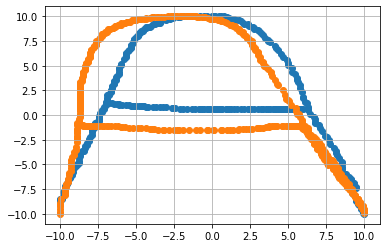

Coeff of A0 :  264.16425884702323
Coeff of A0_test :  295.75212444547986
Coeff of A1 :  1059.7404374908676
Coeff of A1_test :  1167.8748903146416
Coeff of A2 :  -737.8648016369659
Coeff of A2_test :  -833.8149325892592


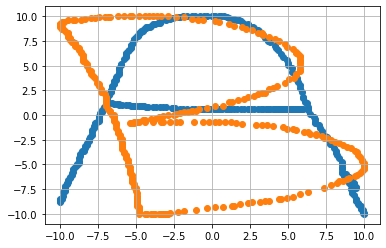

Coeff of A0 :  264.16425884702323
Coeff of B0_test :  259.0953261510756
Coeff of A1 :  1059.7404374908676
Coeff of B1_test :  1079.4803944623545
Coeff of A2 :  -737.8648016369659
Coeff of B2_test :  -967.0156291299161


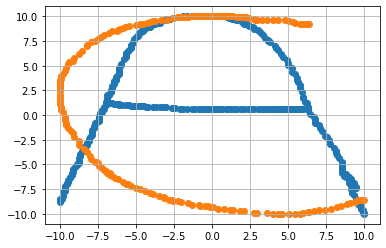

Coeff of A0 :  264.16425884702323
Coeff of C0_test :  303.33333558039624
Coeff of A1 :  1059.7404374908676
Coeff of C1_test :  1324.1760920437448
Coeff of A2 :  -737.8648016369659
Coeff of C2_test :  -1185.8005411694767


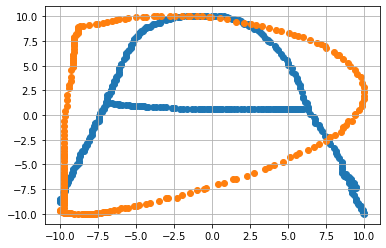

Coeff of A0 :  264.16425884702323
Coeff of D0_test :  258.43618154195667
Coeff of A1 :  1059.7404374908676
Coeff of D1_test :  1320.6773231749596
Coeff of A2 :  -737.8648016369659
Coeff of D2_test :  -1422.3196127785307


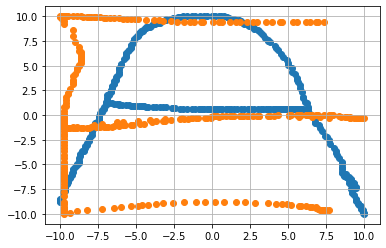

Coeff of A0 :  264.16425884702323
Coeff of E0_test :  265.84587396695025
Coeff of A1 :  1059.7404374908676
Coeff of E1_test :  1153.4052496110676
Coeff of A2 :  -737.8648016369659
Coeff of E2_test :  -1169.2190472063774


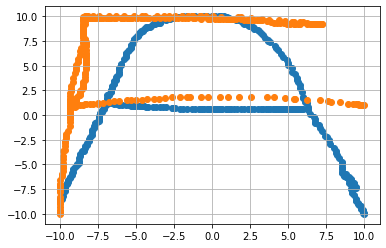

Coeff of A0 :  264.16425884702323
Coeff of F0_test :  303.2106574863934
Coeff of A1 :  1059.7404374908676
Coeff of F1_test :  1311.714510611808
Coeff of A2 :  -737.8648016369659
Coeff of F2_test :  -905.8068476262688


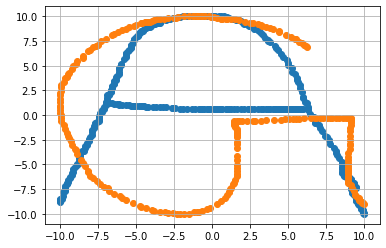

Coeff of A0 :  264.16425884702323
Coeff of G0_test :  287.81806338658964
Coeff of A1 :  1059.7404374908676
Coeff of G1_test :  1184.13016369023
Coeff of A2 :  -737.8648016369659
Coeff of G2_test :  -889.6157584280653


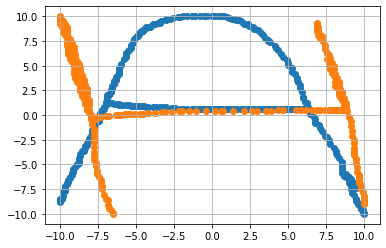

Coeff of A0 :  264.16425884702323
Coeff of H0_test :  274.7281613651508
Coeff of A1 :  1059.7404374908676
Coeff of H1_test :  1207.5890377110502
Coeff of A2 :  -737.8648016369659
Coeff of H2_test :  -835.9788200672382


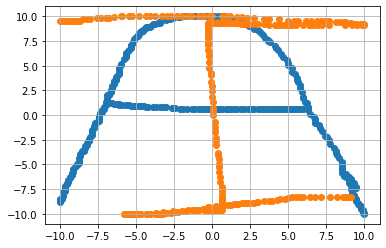

Coeff of A0 :  264.16425884702323
Coeff of I0_test :  270.69151720540685
Coeff of A1 :  1059.7404374908676
Coeff of I1_test :  1241.1484099097927
Coeff of A2 :  -737.8648016369659
Coeff of I2_test :  -812.2991068471923


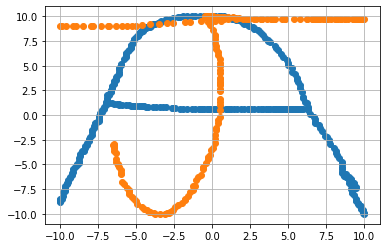

Coeff of A0 :  264.16425884702323
Coeff of J0_test :  221.45118729813638
Coeff of A1 :  1059.7404374908676
Coeff of J1_test :  1126.8306481468614
Coeff of A2 :  -737.8648016369659
Coeff of J2_test :  -566.7243542000019


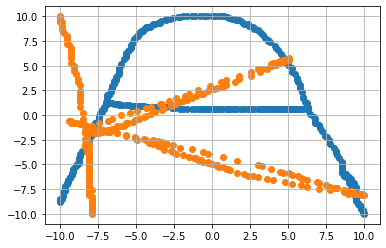

Coeff of A0 :  264.16425884702323
Coeff of K0_test :  225.27417960061194
Coeff of A1 :  1059.7404374908676
Coeff of K1_test :  1019.6317748186923
Coeff of A2 :  -737.8648016369659
Coeff of K2_test :  -1304.4310580413776


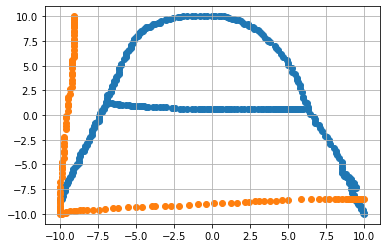

Coeff of A0 :  264.16425884702323
Coeff of l0_test :  285.9043978519215
Coeff of A1 :  1059.7404374908676
Coeff of l1_test :  1422.5570081418418
Coeff of A2 :  -737.8648016369659
Coeff of l2_test :  -2018.5060264647684


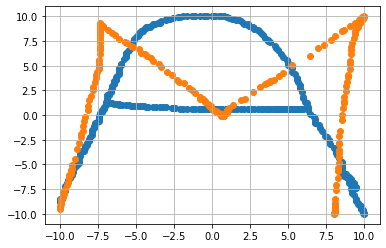

Coeff of A0 :  264.16425884702323
Coeff of M0_test :  214.10803634567756
Coeff of A1 :  1059.7404374908676
Coeff of M1_test :  1089.6741001583043
Coeff of A2 :  -737.8648016369659
Coeff of M2_test :  -629.8972346564841


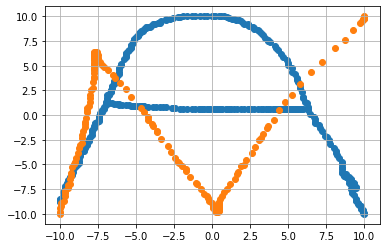

Coeff of A0 :  264.16425884702323
Coeff of N0_test :  243.10505698081576
Coeff of A1 :  1059.7404374908676
Coeff of N1_test :  1105.8386136599713
Coeff of A2 :  -737.8648016369659
Coeff of N2_test :  -1310.925127662746


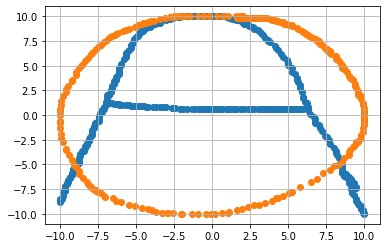

Coeff of A0 :  264.16425884702323
Coeff of O0_test :  269.7623165120487
Coeff of A1 :  1059.7404374908676
Coeff of O1_test :  1282.249724789818
Coeff of A2 :  -737.8648016369659
Coeff of O2_test :  -717.4726016993875


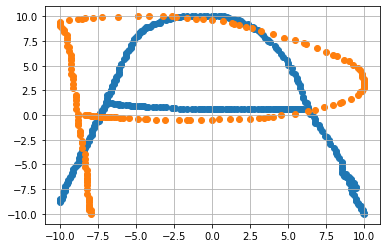

Coeff of A0 :  264.16425884702323
Coeff of P0_test :  253.9459355754082
Coeff of A1 :  1059.7404374908676
Coeff of P1_test :  1164.824965942085
Coeff of A2 :  -737.8648016369659
Coeff of P2_test :  -989.6196113536425


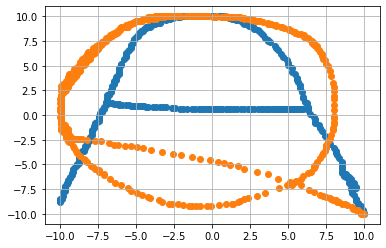

Coeff of A0 :  264.16425884702323
Coeff of Q0_test :  305.04450712852395
Coeff of A1 :  1059.7404374908676
Coeff of Q1_test :  1276.4719466447903
Coeff of A2 :  -737.8648016369659
Coeff of Q2_test :  -995.8869849547273


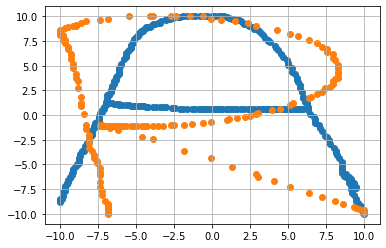

Coeff of A0 :  264.16425884702323
Coeff of R0_test :  254.8594941303752
Coeff of A1 :  1059.7404374908676
Coeff of R1_test :  1124.5862399648388
Coeff of A2 :  -737.8648016369659
Coeff of R2_test :  -992.1013853714055


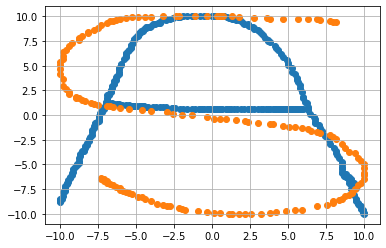

Coeff of A0 :  264.16425884702323
Coeff of S0_test :  290.8544314933228
Coeff of A1 :  1059.7404374908676
Coeff of S1_test :  1226.8256899731539
Coeff of A2 :  -737.8648016369659
Coeff of S2_test :  -1063.3894728687897


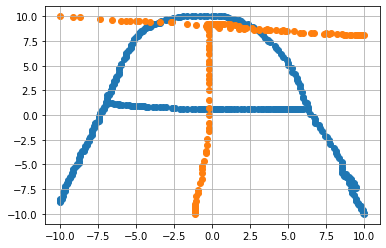

Coeff of A0 :  264.16425884702323
Coeff of T0_test :  236.43423922900277
Coeff of A1 :  1059.7404374908676
Coeff of T1_test :  1121.3978887350374
Coeff of A2 :  -737.8648016369659
Coeff of T2_test :  -220.72383321871104


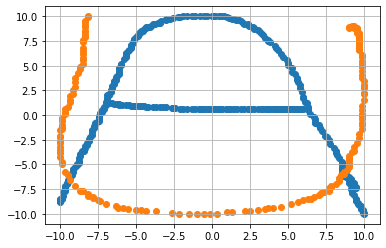

Coeff of A0 :  264.16425884702323
Coeff of U0_test :  275.3156630172093
Coeff of A1 :  1059.7404374908676
Coeff of U1_test :  1361.5579794263167
Coeff of A2 :  -737.8648016369659
Coeff of U2_test :  -1039.933347800673


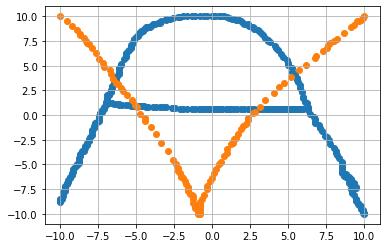

Coeff of A0 :  264.16425884702323
Coeff of V0_test :  225.07537052980817
Coeff of A1 :  1059.7404374908676
Coeff of V1_test :  993.1652737688586
Coeff of A2 :  -737.8648016369659
Coeff of V2_test :  -888.3002255901538


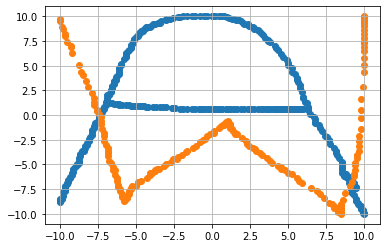

Coeff of A0 :  264.16425884702323
Coeff of W0_test :  236.11100211897917
Coeff of A1 :  1059.7404374908676
Coeff of W1_test :  1076.9716438337794
Coeff of A2 :  -737.8648016369659
Coeff of W2_test :  -1028.1655377026354


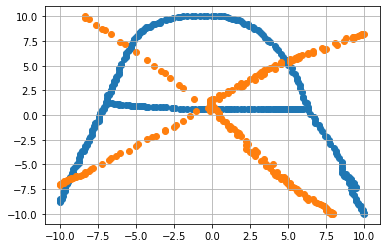

Coeff of A0 :  264.16425884702323
Coeff of X0_test :  202.9950320276672
Coeff of A1 :  1059.7404374908676
Coeff of X1_test :  921.5927592848752
Coeff of A2 :  -737.8648016369659
Coeff of X2_test :  -664.5155167433047


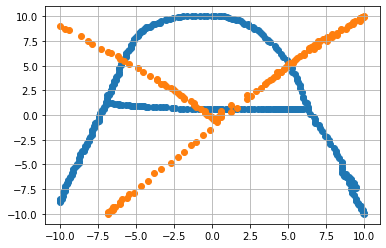

Coeff of A0 :  264.16425884702323
Coeff of Y0_test :  120.89855183715876
Coeff of A1 :  1059.7404374908676
Coeff of Y1_test :  827.7485841209242
Coeff of A2 :  -737.8648016369659
Coeff of Y2_test :  -358.7235004998596


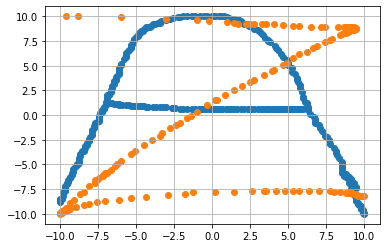

Coeff of A0 :  264.16425884702323
Coeff of Z0_test :  165.25315292561243
Coeff of A1 :  1059.7404374908676
Coeff of Z1_test :  1145.1837448016436
Coeff of A2 :  -737.8648016369659
Coeff of Z2_test :  -1023.0387527418625


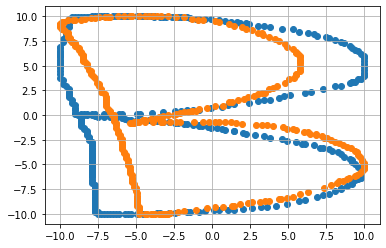

Coeff of B0 :  260.21449285135554
Coeff of B0_test :  259.0953261510756
Coeff of B1 :  1177.650441971355
Coeff of B1_test :  1079.4803944623545
Coeff of B2 :  -1146.3875833782279
Coeff of B2_test :  -967.0156291299161


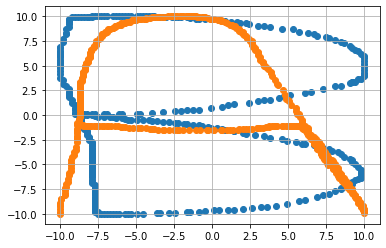

Coeff of B0 :  260.21449285135554
Coeff of A0_test :  295.75212444547986
Coeff of B1 :  1177.650441971355
Coeff of A1_test :  1167.8748903146416
Coeff of B2 :  -1146.3875833782279
Coeff of A2_test :  -833.8149325892592


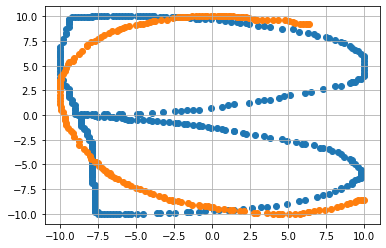

Coeff of B0 :  260.21449285135554
Coeff of C0_test :  303.33333558039624
Coeff of B1 :  1177.650441971355
Coeff of C1_test :  1324.1760920437448
Coeff of B2 :  -1146.3875833782279
Coeff of C2_test :  -1185.8005411694767


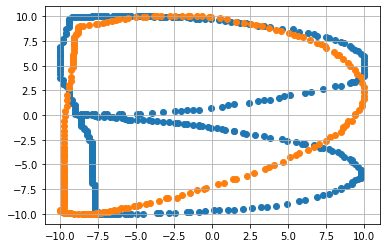

Coeff of B0 :  260.21449285135554
Coeff of D0_test :  258.43618154195667
Coeff of B1 :  1177.650441971355
Coeff of D1_test :  1320.6773231749596
Coeff of B2 :  -1146.3875833782279
Coeff of D2_test :  -1422.3196127785307


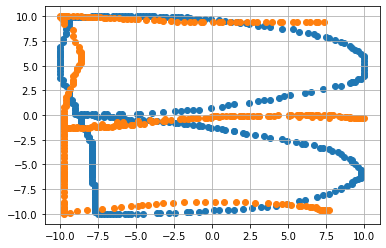

Coeff of B0 :  260.21449285135554
Coeff of E0_test :  265.84587396695025
Coeff of B1 :  1177.650441971355
Coeff of E1_test :  1153.4052496110676
Coeff of B2 :  -1146.3875833782279
Coeff of E2_test :  -1169.2190472063774


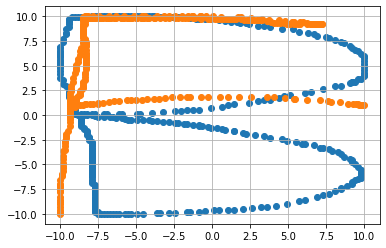

Coeff of B0 :  260.21449285135554
Coeff of F0_test :  303.2106574863934
Coeff of B1 :  1177.650441971355
Coeff of F1_test :  1311.714510611808
Coeff of B2 :  -1146.3875833782279
Coeff of F2_test :  -905.8068476262688


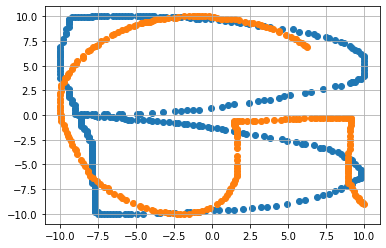

Coeff of B0 :  260.21449285135554
Coeff of G0_test :  287.81806338658964
Coeff of B1 :  1177.650441971355
Coeff of G1_test :  1184.13016369023
Coeff of B2 :  -1146.3875833782279
Coeff of G2_test :  -889.6157584280653


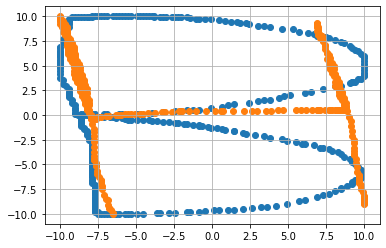

Coeff of B0 :  260.21449285135554
Coeff of H0_test :  274.7281613651508
Coeff of B1 :  1177.650441971355
Coeff of H1_test :  1207.5890377110502
Coeff of B2 :  -1146.3875833782279
Coeff of H2_test :  -835.9788200672382


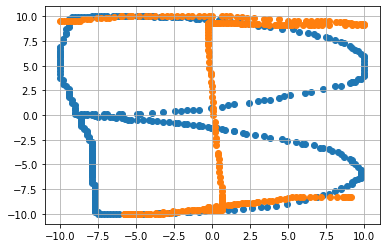

Coeff of B0 :  260.21449285135554
Coeff of I0_test :  270.69151720540685
Coeff of B1 :  1177.650441971355
Coeff of I1_test :  1241.1484099097927
Coeff of B2 :  -1146.3875833782279
Coeff of I2_test :  -812.2991068471923


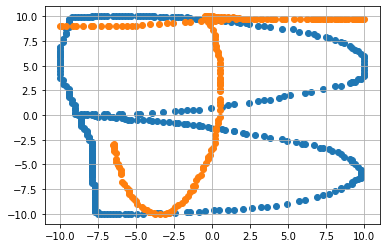

Coeff of B0 :  260.21449285135554
Coeff of J0_test :  221.45118729813638
Coeff of B1 :  1177.650441971355
Coeff of J1_test :  1126.8306481468614
Coeff of B2 :  -1146.3875833782279
Coeff of J2_test :  -566.7243542000019


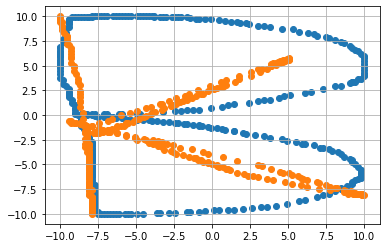

Coeff of B0 :  260.21449285135554
Coeff of K0_test :  225.27417960061194
Coeff of B1 :  1177.650441971355
Coeff of K1_test :  1019.6317748186923
Coeff of B2 :  -1146.3875833782279
Coeff of K2_test :  -1304.4310580413776


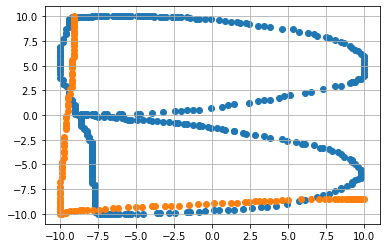

Coeff of B0 :  260.21449285135554
Coeff of l0_test :  285.9043978519215
Coeff of B1 :  1177.650441971355
Coeff of l1_test :  1422.5570081418418
Coeff of B2 :  -1146.3875833782279
Coeff of l2_test :  -2018.5060264647684


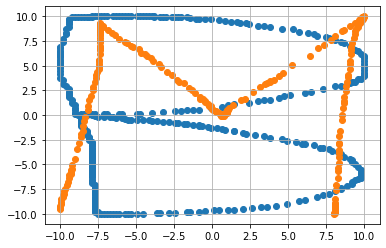

Coeff of B0 :  260.21449285135554
Coeff of M0_test :  214.10803634567756
Coeff of B1 :  1177.650441971355
Coeff of M1_test :  1089.6741001583043
Coeff of B2 :  -1146.3875833782279
Coeff of M2_test :  -629.8972346564841


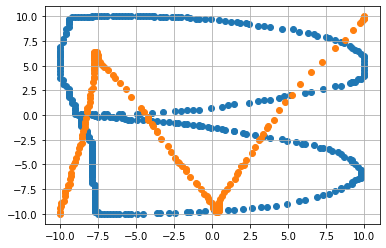

Coeff of B0 :  260.21449285135554
Coeff of N0_test :  243.10505698081576
Coeff of B1 :  1177.650441971355
Coeff of N1_test :  1105.8386136599713
Coeff of B2 :  -1146.3875833782279
Coeff of N2_test :  -1310.925127662746


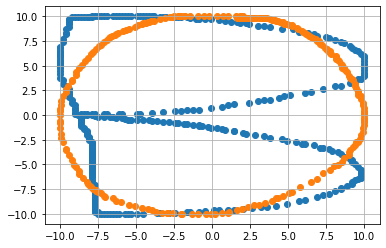

Coeff of B0 :  260.21449285135554
Coeff of O0_test :  269.7623165120487
Coeff of B1 :  1177.650441971355
Coeff of O1_test :  1282.249724789818
Coeff of B2 :  -1146.3875833782279
Coeff of O2_test :  -717.4726016993875


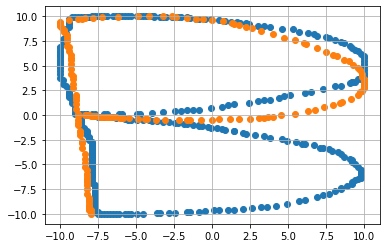

Coeff of B0 :  260.21449285135554
Coeff of P0_test :  253.9459355754082
Coeff of B1 :  1177.650441971355
Coeff of P1_test :  1164.824965942085
Coeff of B2 :  -1146.3875833782279
Coeff of P2_test :  -989.6196113536425


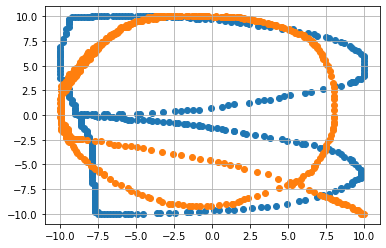

Coeff of B0 :  260.21449285135554
Coeff of Q0_test :  305.04450712852395
Coeff of B1 :  1177.650441971355
Coeff of Q1_test :  1276.4719466447903
Coeff of B2 :  -1146.3875833782279
Coeff of Q2_test :  -995.8869849547273


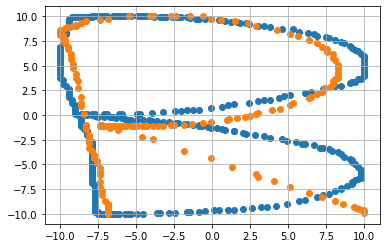

Coeff of B0 :  260.21449285135554
Coeff of R0_test :  254.8594941303752
Coeff of B1 :  1177.650441971355
Coeff of R1_test :  1124.5862399648388
Coeff of B2 :  -1146.3875833782279
Coeff of R2_test :  -992.1013853714055


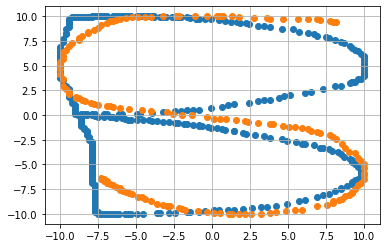

Coeff of B0 :  260.21449285135554
Coeff of S0_test :  290.8544314933228
Coeff of B1 :  1177.650441971355
Coeff of S1_test :  1226.8256899731539
Coeff of B2 :  -1146.3875833782279
Coeff of S2_test :  -1063.3894728687897


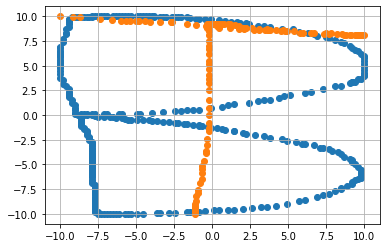

Coeff of B0 :  260.21449285135554
Coeff of T0_test :  236.43423922900277
Coeff of B1 :  1177.650441971355
Coeff of T1_test :  1121.3978887350374
Coeff of B2 :  -1146.3875833782279
Coeff of T2_test :  -220.72383321871104


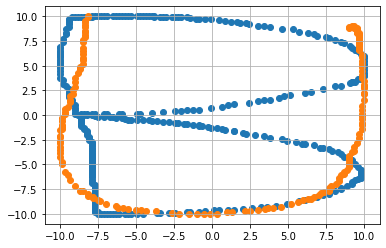

Coeff of B0 :  260.21449285135554
Coeff of U0_test :  275.3156630172093
Coeff of B1 :  1177.650441971355
Coeff of U1_test :  1361.5579794263167
Coeff of B2 :  -1146.3875833782279
Coeff of U2_test :  -1039.933347800673


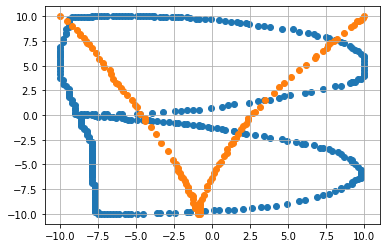

Coeff of B0 :  260.21449285135554
Coeff of V0_test :  225.07537052980817
Coeff of B1 :  1177.650441971355
Coeff of V1_test :  993.1652737688586
Coeff of B2 :  -1146.3875833782279
Coeff of V2_test :  -888.3002255901538


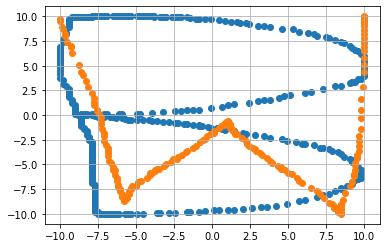

Coeff of B0 :  260.21449285135554
Coeff of W0_test :  236.11100211897917
Coeff of B1 :  1177.650441971355
Coeff of W1_test :  1076.9716438337794
Coeff of B2 :  -1146.3875833782279
Coeff of W2_test :  -1028.1655377026354


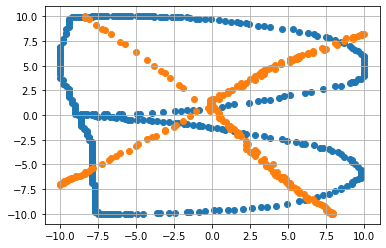

Coeff of B0 :  260.21449285135554
Coeff of X0_test :  202.9950320276672
Coeff of B1 :  1177.650441971355
Coeff of X1_test :  921.5927592848752
Coeff of B2 :  -1146.3875833782279
Coeff of X2_test :  -664.5155167433047


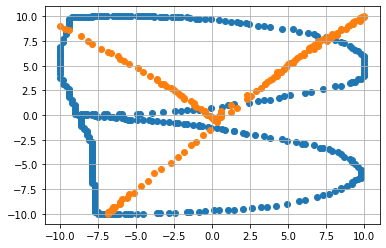

Coeff of B0 :  260.21449285135554
Coeff of Y0_test :  120.89855183715876
Coeff of B1 :  1177.650441971355
Coeff of Y1_test :  827.7485841209242
Coeff of B2 :  -1146.3875833782279
Coeff of Y2_test :  -358.7235004998596


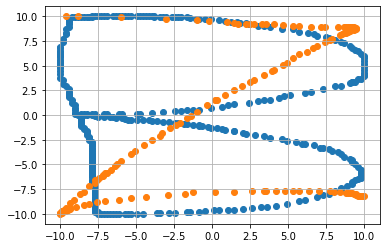

Coeff of B0 :  260.21449285135554
Coeff of Z0_test :  165.25315292561243
Coeff of B1 :  1177.650441971355
Coeff of Z1_test :  1145.1837448016436
Coeff of B2 :  -1146.3875833782279
Coeff of Z2_test :  -1023.0387527418625


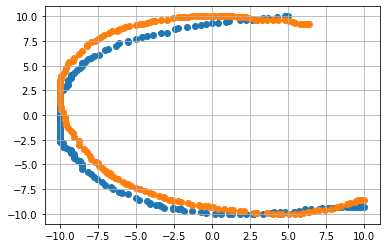

Coeff of C0 :  302.85638132344866
Coeff of C0_test :  303.33333558039624
Coeff of C1 :  1325.0315758829545
Coeff of C1_test :  1324.1760920437448
Coeff of C2 :  -1577.9864882408551
Coeff of C2_test :  -1185.8005411694767


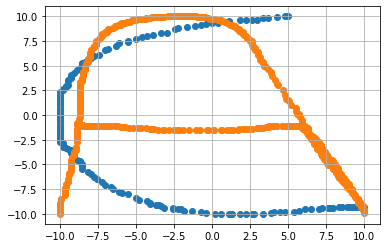

Coeff of C0 :  302.85638132344866
Coeff of A0_test :  295.75212444547986
Coeff of C1 :  1325.0315758829545
Coeff of A1_test :  1167.8748903146416
Coeff of C2 :  -1577.9864882408551
Coeff of A2_test :  -833.8149325892592


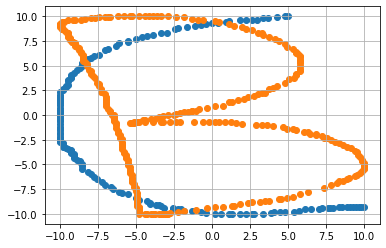

Coeff of C0 :  302.85638132344866
Coeff of B0_test :  259.0953261510756
Coeff of C1 :  1325.0315758829545
Coeff of B1_test :  1079.4803944623545
Coeff of C2 :  -1577.9864882408551
Coeff of B2_test :  -967.0156291299161


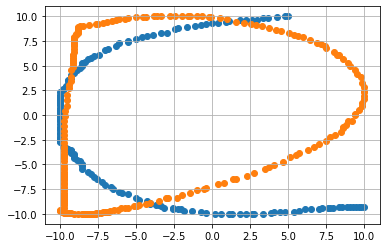

Coeff of C0 :  302.85638132344866
Coeff of D0_test :  258.43618154195667
Coeff of C1 :  1325.0315758829545
Coeff of D1_test :  1320.6773231749596
Coeff of C2 :  -1577.9864882408551
Coeff of D2_test :  -1422.3196127785307


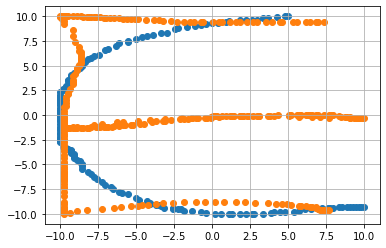

Coeff of C0 :  302.85638132344866
Coeff of E0_test :  265.84587396695025
Coeff of C1 :  1325.0315758829545
Coeff of E1_test :  1153.4052496110676
Coeff of C2 :  -1577.9864882408551
Coeff of E2_test :  -1169.2190472063774


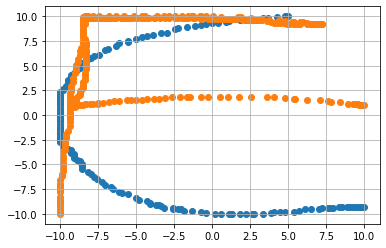

Coeff of C0 :  302.85638132344866
Coeff of F0_test :  303.2106574863934
Coeff of C1 :  1325.0315758829545
Coeff of F1_test :  1311.714510611808
Coeff of C2 :  -1577.9864882408551
Coeff of F2_test :  -905.8068476262688


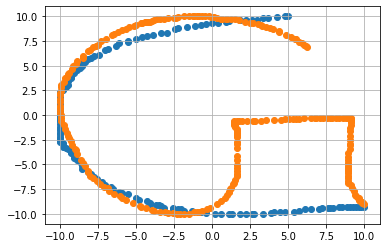

Coeff of C0 :  302.85638132344866
Coeff of G0_test :  287.81806338658964
Coeff of C1 :  1325.0315758829545
Coeff of G1_test :  1184.13016369023
Coeff of C2 :  -1577.9864882408551
Coeff of G2_test :  -889.6157584280653


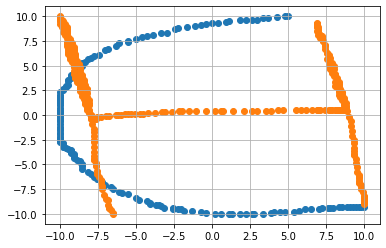

Coeff of C0 :  302.85638132344866
Coeff of H0_test :  274.7281613651508
Coeff of C1 :  1325.0315758829545
Coeff of H1_test :  1207.5890377110502
Coeff of C2 :  -1577.9864882408551
Coeff of H2_test :  -835.9788200672382


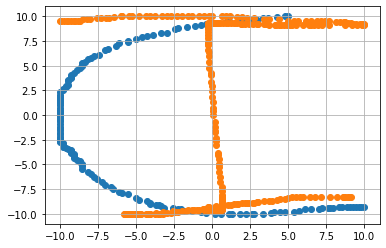

Coeff of C0 :  302.85638132344866
Coeff of I0_test :  270.69151720540685
Coeff of C1 :  1325.0315758829545
Coeff of I1_test :  1241.1484099097927
Coeff of C2 :  -1577.9864882408551
Coeff of I2_test :  -812.2991068471923


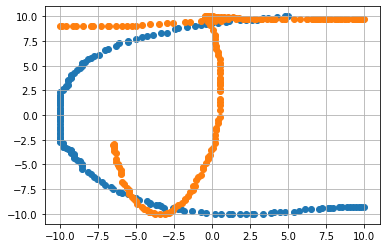

Coeff of C0 :  302.85638132344866
Coeff of J0_test :  221.45118729813638
Coeff of C1 :  1325.0315758829545
Coeff of J1_test :  1126.8306481468614
Coeff of C2 :  -1577.9864882408551
Coeff of J2_test :  -566.7243542000019


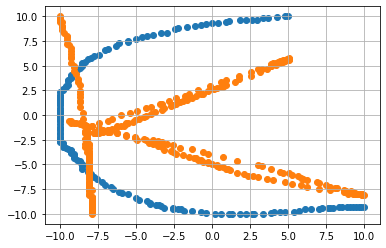

Coeff of C0 :  302.85638132344866
Coeff of K0_test :  225.27417960061194
Coeff of C1 :  1325.0315758829545
Coeff of K1_test :  1019.6317748186923
Coeff of C2 :  -1577.9864882408551
Coeff of K2_test :  -1304.4310580413776


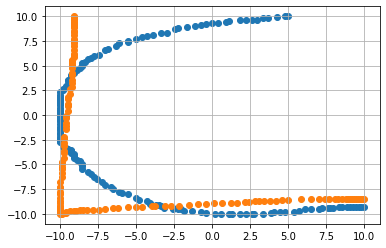

Coeff of C0 :  302.85638132344866
Coeff of l0_test :  285.9043978519215
Coeff of C1 :  1325.0315758829545
Coeff of l1_test :  1422.5570081418418
Coeff of C2 :  -1577.9864882408551
Coeff of l2_test :  -2018.5060264647684


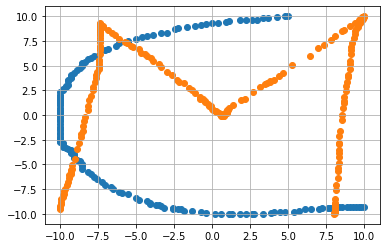

Coeff of C0 :  302.85638132344866
Coeff of M0_test :  214.10803634567756
Coeff of C1 :  1325.0315758829545
Coeff of M1_test :  1089.6741001583043
Coeff of C2 :  -1577.9864882408551
Coeff of M2_test :  -629.8972346564841


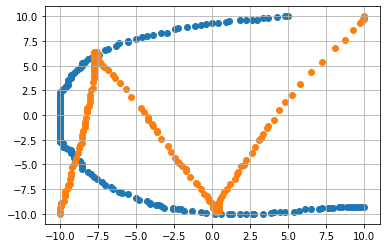

Coeff of C0 :  302.85638132344866
Coeff of N0_test :  243.10505698081576
Coeff of C1 :  1325.0315758829545
Coeff of N1_test :  1105.8386136599713
Coeff of C2 :  -1577.9864882408551
Coeff of N2_test :  -1310.925127662746


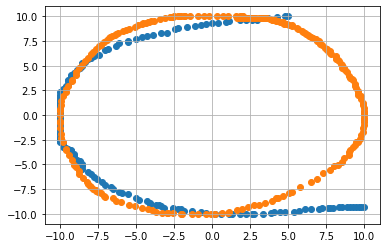

Coeff of C0 :  302.85638132344866
Coeff of O0_test :  269.7623165120487
Coeff of C1 :  1325.0315758829545
Coeff of O1_test :  1282.249724789818
Coeff of C2 :  -1577.9864882408551
Coeff of O2_test :  -717.4726016993875


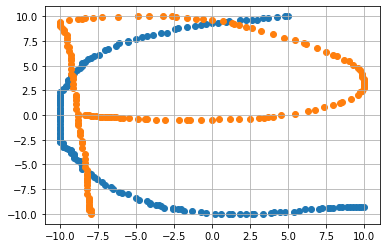

Coeff of C0 :  302.85638132344866
Coeff of P0_test :  253.9459355754082
Coeff of C1 :  1325.0315758829545
Coeff of P1_test :  1164.824965942085
Coeff of C2 :  -1577.9864882408551
Coeff of P2_test :  -989.6196113536425


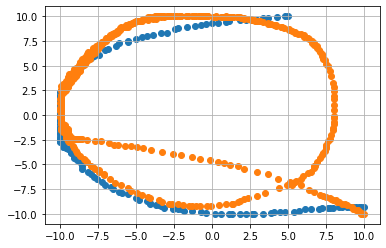

Coeff of C0 :  302.85638132344866
Coeff of Q0_test :  305.04450712852395
Coeff of C1 :  1325.0315758829545
Coeff of Q1_test :  1276.4719466447903
Coeff of C2 :  -1577.9864882408551
Coeff of Q2_test :  -995.8869849547273


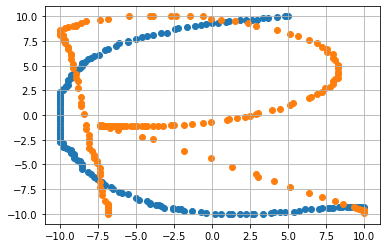

Coeff of C0 :  302.85638132344866
Coeff of R0_test :  254.8594941303752
Coeff of C1 :  1325.0315758829545
Coeff of R1_test :  1124.5862399648388
Coeff of C2 :  -1577.9864882408551
Coeff of R2_test :  -992.1013853714055


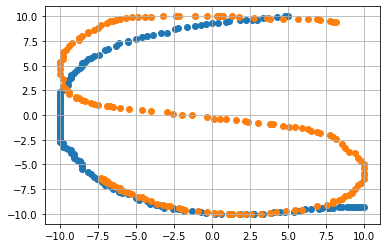

Coeff of C0 :  302.85638132344866
Coeff of S0_test :  290.8544314933228
Coeff of C1 :  1325.0315758829545
Coeff of S1_test :  1226.8256899731539
Coeff of C2 :  -1577.9864882408551
Coeff of S2_test :  -1063.3894728687897


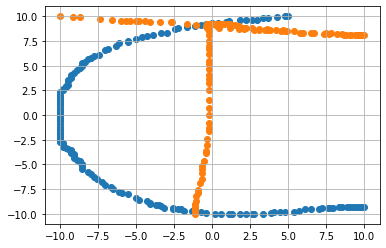

Coeff of C0 :  302.85638132344866
Coeff of T0_test :  236.43423922900277
Coeff of C1 :  1325.0315758829545
Coeff of T1_test :  1121.3978887350374
Coeff of C2 :  -1577.9864882408551
Coeff of T2_test :  -220.72383321871104


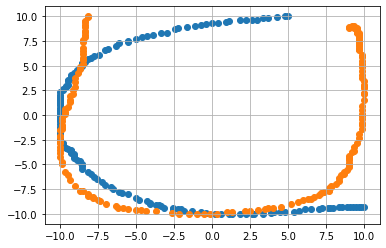

Coeff of C0 :  302.85638132344866
Coeff of U0_test :  275.3156630172093
Coeff of C1 :  1325.0315758829545
Coeff of U1_test :  1361.5579794263167
Coeff of C2 :  -1577.9864882408551
Coeff of U2_test :  -1039.933347800673


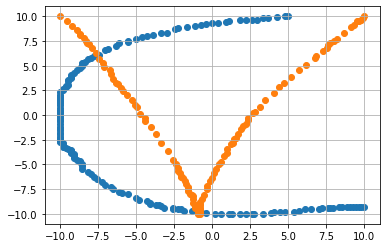

Coeff of C0 :  302.85638132344866
Coeff of V0_test :  225.07537052980817
Coeff of C1 :  1325.0315758829545
Coeff of V1_test :  993.1652737688586
Coeff of C2 :  -1577.9864882408551
Coeff of V2_test :  -888.3002255901538


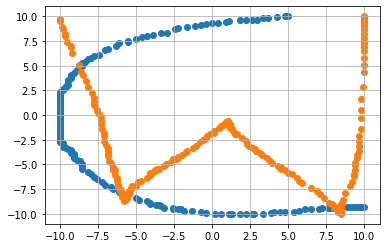

Coeff of C0 :  302.85638132344866
Coeff of W0_test :  236.11100211897917
Coeff of C1 :  1325.0315758829545
Coeff of W1_test :  1076.9716438337794
Coeff of C2 :  -1577.9864882408551
Coeff of W2_test :  -1028.1655377026354


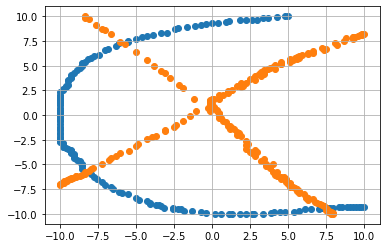

Coeff of C0 :  302.85638132344866
Coeff of X0_test :  202.9950320276672
Coeff of C1 :  1325.0315758829545
Coeff of X1_test :  921.5927592848752
Coeff of C2 :  -1577.9864882408551
Coeff of X2_test :  -664.5155167433047


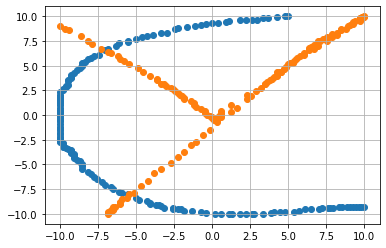

Coeff of C0 :  302.85638132344866
Coeff of Y0_test :  120.89855183715876
Coeff of C1 :  1325.0315758829545
Coeff of Y1_test :  827.7485841209242
Coeff of C2 :  -1577.9864882408551
Coeff of Y2_test :  -358.7235004998596


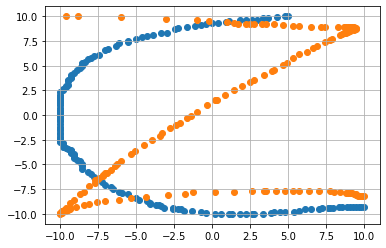

Coeff of C0 :  302.85638132344866
Coeff of Z0_test :  165.25315292561243
Coeff of C1 :  1325.0315758829545
Coeff of Z1_test :  1145.1837448016436
Coeff of C2 :  -1577.9864882408551
Coeff of Z2_test :  -1023.0387527418625


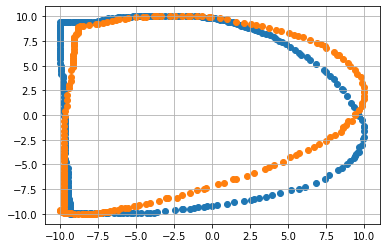

Coeff of D0 :  292.51948911624254
Coeff of D0_test :  258.43618154195667
Coeff of D1 :  1376.8032885941916
Coeff of D1_test :  1320.6773231749596
Coeff of D2 :  -1325.7900449879326
Coeff of D2_test :  -1422.3196127785307


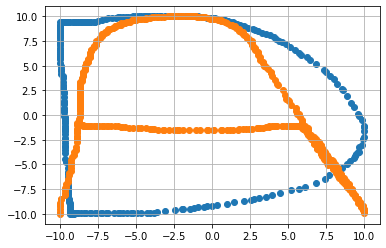

Coeff of D0 :  292.51948911624254
Coeff of A0_test :  295.75212444547986
Coeff of D1 :  1376.8032885941916
Coeff of A1_test :  1167.8748903146416
Coeff of D2 :  -1325.7900449879326
Coeff of A2_test :  -833.8149325892592


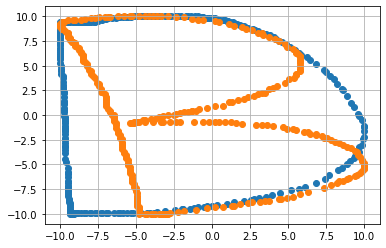

Coeff of D0 :  292.51948911624254
Coeff of B0_test :  259.0953261510756
Coeff of D1 :  1376.8032885941916
Coeff of B1_test :  1079.4803944623545
Coeff of D2 :  -1325.7900449879326
Coeff of B2_test :  -967.0156291299161


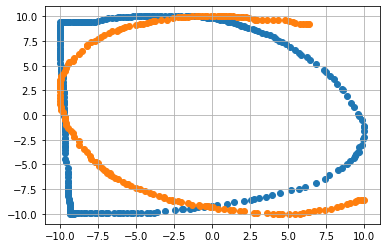

Coeff of D0 :  292.51948911624254
Coeff of C0_test :  303.33333558039624
Coeff of D1 :  1376.8032885941916
Coeff of C1_test :  1324.1760920437448
Coeff of D2 :  -1325.7900449879326
Coeff of C2_test :  -1185.8005411694767


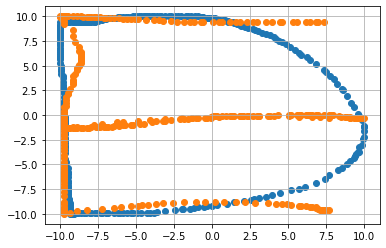

Coeff of D0 :  292.51948911624254
Coeff of E0_test :  265.84587396695025
Coeff of D1 :  1376.8032885941916
Coeff of E1_test :  1153.4052496110676
Coeff of D2 :  -1325.7900449879326
Coeff of E2_test :  -1169.2190472063774


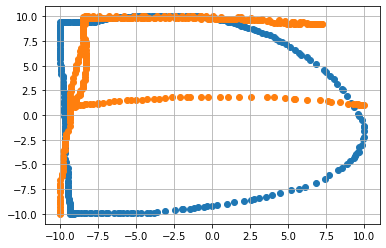

Coeff of D0 :  292.51948911624254
Coeff of F0_test :  303.2106574863934
Coeff of D1 :  1376.8032885941916
Coeff of F1_test :  1311.714510611808
Coeff of D2 :  -1325.7900449879326
Coeff of F2_test :  -905.8068476262688


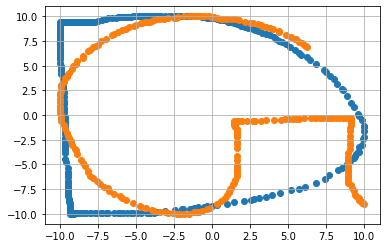

Coeff of D0 :  292.51948911624254
Coeff of G0_test :  287.81806338658964
Coeff of D1 :  1376.8032885941916
Coeff of G1_test :  1184.13016369023
Coeff of D2 :  -1325.7900449879326
Coeff of G2_test :  -889.6157584280653


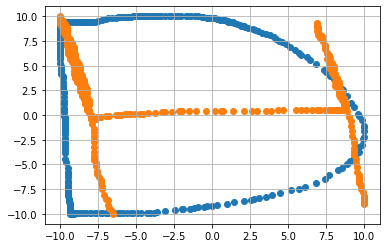

Coeff of D0 :  292.51948911624254
Coeff of H0_test :  274.7281613651508
Coeff of D1 :  1376.8032885941916
Coeff of H1_test :  1207.5890377110502
Coeff of D2 :  -1325.7900449879326
Coeff of H2_test :  -835.9788200672382


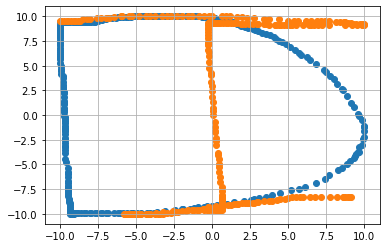

Coeff of D0 :  292.51948911624254
Coeff of I0_test :  270.69151720540685
Coeff of D1 :  1376.8032885941916
Coeff of I1_test :  1241.1484099097927
Coeff of D2 :  -1325.7900449879326
Coeff of I2_test :  -812.2991068471923


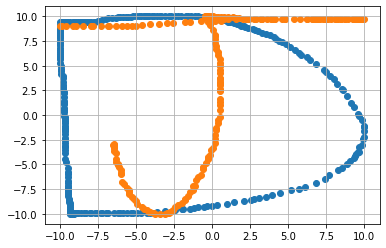

Coeff of D0 :  292.51948911624254
Coeff of J0_test :  221.45118729813638
Coeff of D1 :  1376.8032885941916
Coeff of J1_test :  1126.8306481468614
Coeff of D2 :  -1325.7900449879326
Coeff of J2_test :  -566.7243542000019


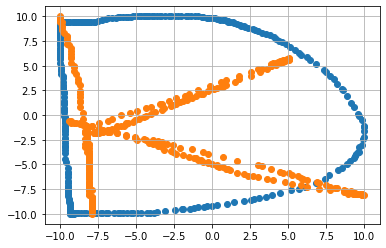

Coeff of D0 :  292.51948911624254
Coeff of K0_test :  225.27417960061194
Coeff of D1 :  1376.8032885941916
Coeff of K1_test :  1019.6317748186923
Coeff of D2 :  -1325.7900449879326
Coeff of K2_test :  -1304.4310580413776


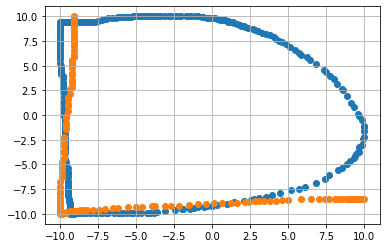

Coeff of D0 :  292.51948911624254
Coeff of l0_test :  285.9043978519215
Coeff of D1 :  1376.8032885941916
Coeff of l1_test :  1422.5570081418418
Coeff of D2 :  -1325.7900449879326
Coeff of l2_test :  -2018.5060264647684


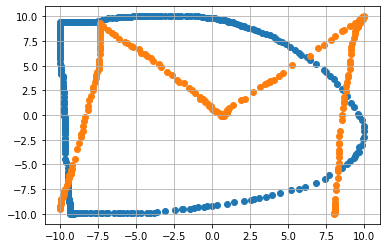

Coeff of D0 :  292.51948911624254
Coeff of M0_test :  214.10803634567756
Coeff of D1 :  1376.8032885941916
Coeff of M1_test :  1089.6741001583043
Coeff of D2 :  -1325.7900449879326
Coeff of M2_test :  -629.8972346564841


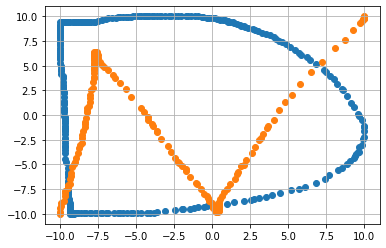

Coeff of D0 :  292.51948911624254
Coeff of N0_test :  243.10505698081576
Coeff of D1 :  1376.8032885941916
Coeff of N1_test :  1105.8386136599713
Coeff of D2 :  -1325.7900449879326
Coeff of N2_test :  -1310.925127662746


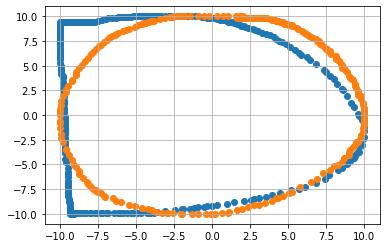

Coeff of D0 :  292.51948911624254
Coeff of O0_test :  269.7623165120487
Coeff of D1 :  1376.8032885941916
Coeff of O1_test :  1282.249724789818
Coeff of D2 :  -1325.7900449879326
Coeff of O2_test :  -717.4726016993875


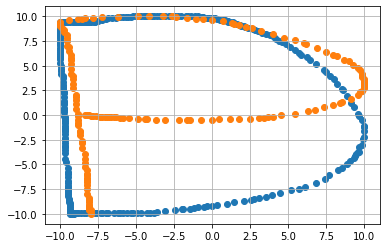

Coeff of D0 :  292.51948911624254
Coeff of P0_test :  253.9459355754082
Coeff of D1 :  1376.8032885941916
Coeff of P1_test :  1164.824965942085
Coeff of D2 :  -1325.7900449879326
Coeff of P2_test :  -989.6196113536425


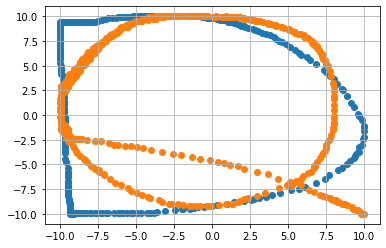

Coeff of D0 :  292.51948911624254
Coeff of Q0_test :  305.04450712852395
Coeff of D1 :  1376.8032885941916
Coeff of Q1_test :  1276.4719466447903
Coeff of D2 :  -1325.7900449879326
Coeff of Q2_test :  -995.8869849547273


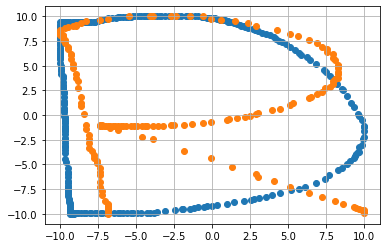

Coeff of D0 :  292.51948911624254
Coeff of R0_test :  254.8594941303752
Coeff of D1 :  1376.8032885941916
Coeff of R1_test :  1124.5862399648388
Coeff of D2 :  -1325.7900449879326
Coeff of R2_test :  -992.1013853714055


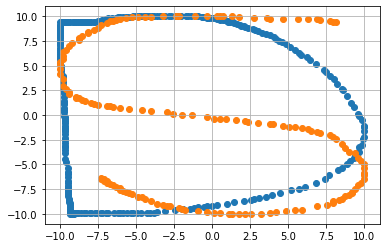

Coeff of D0 :  292.51948911624254
Coeff of S0_test :  290.8544314933228
Coeff of D1 :  1376.8032885941916
Coeff of S1_test :  1226.8256899731539
Coeff of D2 :  -1325.7900449879326
Coeff of S2_test :  -1063.3894728687897


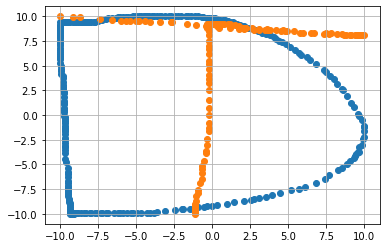

Coeff of D0 :  292.51948911624254
Coeff of T0_test :  236.43423922900277
Coeff of D1 :  1376.8032885941916
Coeff of T1_test :  1121.3978887350374
Coeff of D2 :  -1325.7900449879326
Coeff of T2_test :  -220.72383321871104


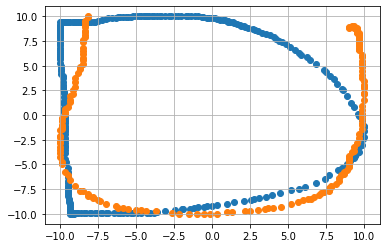

Coeff of D0 :  292.51948911624254
Coeff of U0_test :  275.3156630172093
Coeff of D1 :  1376.8032885941916
Coeff of U1_test :  1361.5579794263167
Coeff of D2 :  -1325.7900449879326
Coeff of U2_test :  -1039.933347800673


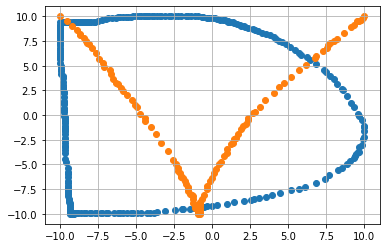

Coeff of D0 :  292.51948911624254
Coeff of V0_test :  225.07537052980817
Coeff of D1 :  1376.8032885941916
Coeff of V1_test :  993.1652737688586
Coeff of D2 :  -1325.7900449879326
Coeff of V2_test :  -888.3002255901538


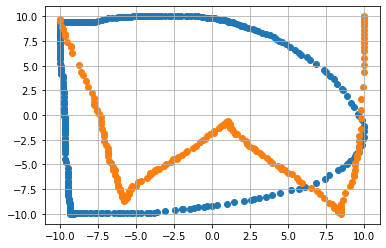

Coeff of D0 :  292.51948911624254
Coeff of W0_test :  236.11100211897917
Coeff of D1 :  1376.8032885941916
Coeff of W1_test :  1076.9716438337794
Coeff of D2 :  -1325.7900449879326
Coeff of W2_test :  -1028.1655377026354


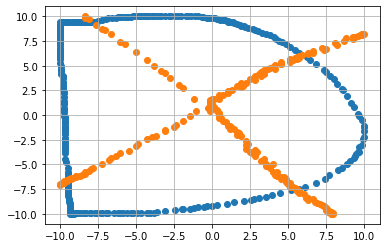

Coeff of D0 :  292.51948911624254
Coeff of X0_test :  202.9950320276672
Coeff of D1 :  1376.8032885941916
Coeff of X1_test :  921.5927592848752
Coeff of D2 :  -1325.7900449879326
Coeff of X2_test :  -664.5155167433047


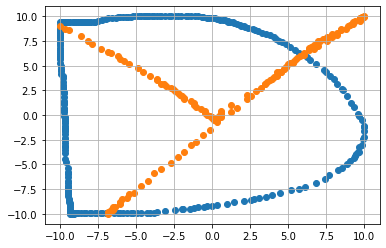

Coeff of D0 :  292.51948911624254
Coeff of Y0_test :  120.89855183715876
Coeff of D1 :  1376.8032885941916
Coeff of Y1_test :  827.7485841209242
Coeff of D2 :  -1325.7900449879326
Coeff of Y2_test :  -358.7235004998596


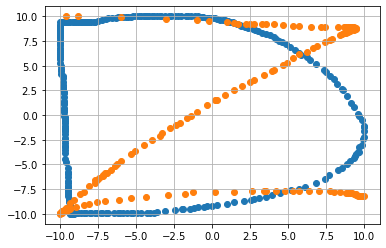

Coeff of D0 :  292.51948911624254
Coeff of Z0_test :  165.25315292561243
Coeff of D1 :  1376.8032885941916
Coeff of Z1_test :  1145.1837448016436
Coeff of D2 :  -1325.7900449879326
Coeff of Z2_test :  -1023.0387527418625


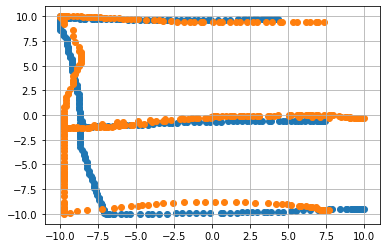

Coeff of E0 :  289.4266253421857
Coeff of E0_test :  265.84587396695025
Coeff of E1 :  1243.0465506111282
Coeff of E1_test :  1153.4052496110676
Coeff of E2 :  -1319.2656638663277
Coeff of E2_test :  -1169.2190472063774


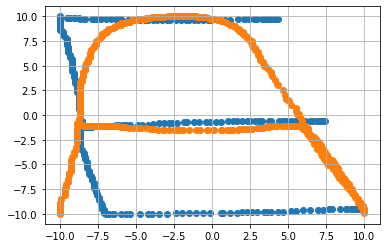

Coeff of E0 :  289.4266253421857
Coeff of A0_test :  295.75212444547986
Coeff of E1 :  1243.0465506111282
Coeff of A1_test :  1167.8748903146416
Coeff of E2 :  -1319.2656638663277
Coeff of A2_test :  -833.8149325892592


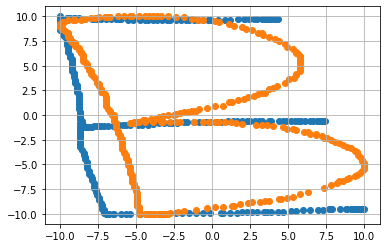

Coeff of E0 :  289.4266253421857
Coeff of B0_test :  259.0953261510756
Coeff of E1 :  1243.0465506111282
Coeff of B1_test :  1079.4803944623545
Coeff of E2 :  -1319.2656638663277
Coeff of B2_test :  -967.0156291299161


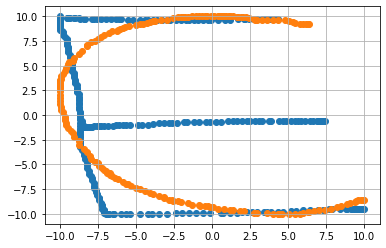

Coeff of E0 :  289.4266253421857
Coeff of C0_test :  303.33333558039624
Coeff of E1 :  1243.0465506111282
Coeff of C1_test :  1324.1760920437448
Coeff of E2 :  -1319.2656638663277
Coeff of C2_test :  -1185.8005411694767


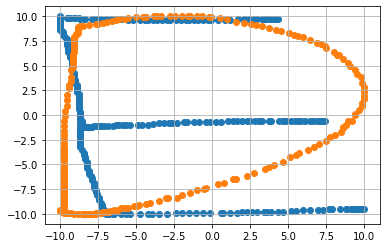

Coeff of E0 :  289.4266253421857
Coeff of D0_test :  258.43618154195667
Coeff of E1 :  1243.0465506111282
Coeff of D1_test :  1320.6773231749596
Coeff of E2 :  -1319.2656638663277
Coeff of D2_test :  -1422.3196127785307


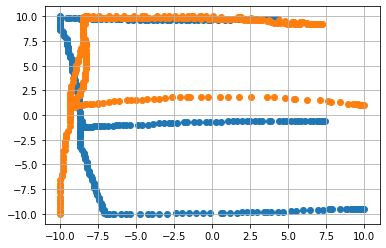

Coeff of E0 :  289.4266253421857
Coeff of F0_test :  303.2106574863934
Coeff of E1 :  1243.0465506111282
Coeff of F1_test :  1311.714510611808
Coeff of E2 :  -1319.2656638663277
Coeff of F2_test :  -905.8068476262688


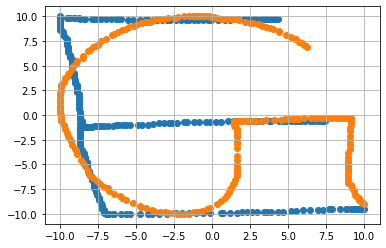

Coeff of E0 :  289.4266253421857
Coeff of G0_test :  287.81806338658964
Coeff of E1 :  1243.0465506111282
Coeff of G1_test :  1184.13016369023
Coeff of E2 :  -1319.2656638663277
Coeff of G2_test :  -889.6157584280653


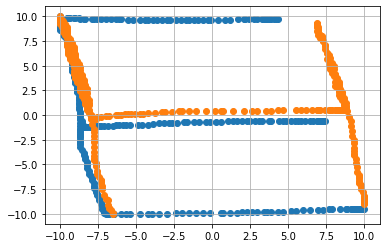

Coeff of E0 :  289.4266253421857
Coeff of H0_test :  274.7281613651508
Coeff of E1 :  1243.0465506111282
Coeff of H1_test :  1207.5890377110502
Coeff of E2 :  -1319.2656638663277
Coeff of H2_test :  -835.9788200672382


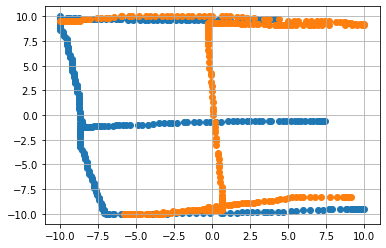

Coeff of E0 :  289.4266253421857
Coeff of I0_test :  270.69151720540685
Coeff of E1 :  1243.0465506111282
Coeff of I1_test :  1241.1484099097927
Coeff of E2 :  -1319.2656638663277
Coeff of I2_test :  -812.2991068471923


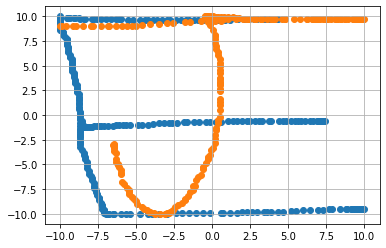

Coeff of E0 :  289.4266253421857
Coeff of J0_test :  221.45118729813638
Coeff of E1 :  1243.0465506111282
Coeff of J1_test :  1126.8306481468614
Coeff of E2 :  -1319.2656638663277
Coeff of J2_test :  -566.7243542000019


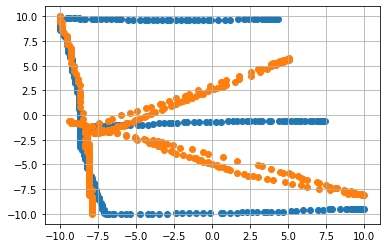

Coeff of E0 :  289.4266253421857
Coeff of K0_test :  225.27417960061194
Coeff of E1 :  1243.0465506111282
Coeff of K1_test :  1019.6317748186923
Coeff of E2 :  -1319.2656638663277
Coeff of K2_test :  -1304.4310580413776


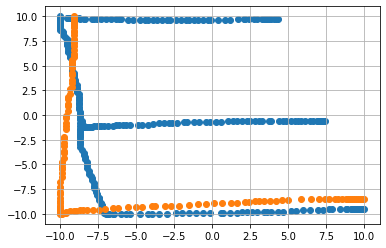

Coeff of E0 :  289.4266253421857
Coeff of l0_test :  285.9043978519215
Coeff of E1 :  1243.0465506111282
Coeff of l1_test :  1422.5570081418418
Coeff of E2 :  -1319.2656638663277
Coeff of l2_test :  -2018.5060264647684


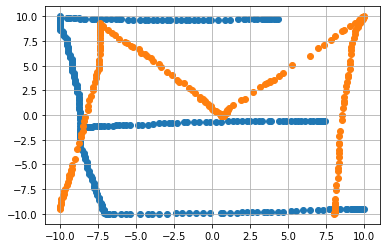

Coeff of E0 :  289.4266253421857
Coeff of M0_test :  214.10803634567756
Coeff of E1 :  1243.0465506111282
Coeff of M1_test :  1089.6741001583043
Coeff of E2 :  -1319.2656638663277
Coeff of M2_test :  -629.8972346564841


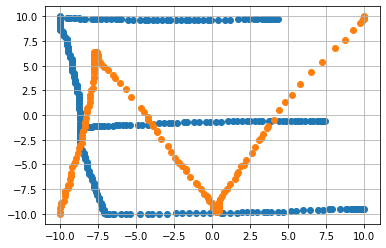

Coeff of E0 :  289.4266253421857
Coeff of N0_test :  243.10505698081576
Coeff of E1 :  1243.0465506111282
Coeff of N1_test :  1105.8386136599713
Coeff of E2 :  -1319.2656638663277
Coeff of N2_test :  -1310.925127662746


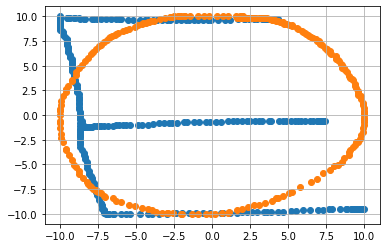

Coeff of E0 :  289.4266253421857
Coeff of O0_test :  269.7623165120487
Coeff of E1 :  1243.0465506111282
Coeff of O1_test :  1282.249724789818
Coeff of E2 :  -1319.2656638663277
Coeff of O2_test :  -717.4726016993875


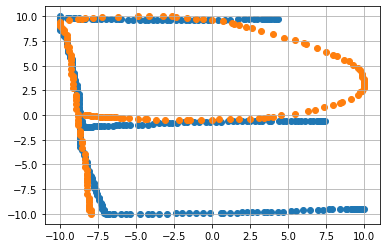

Coeff of E0 :  289.4266253421857
Coeff of P0_test :  253.9459355754082
Coeff of E1 :  1243.0465506111282
Coeff of P1_test :  1164.824965942085
Coeff of E2 :  -1319.2656638663277
Coeff of P2_test :  -989.6196113536425


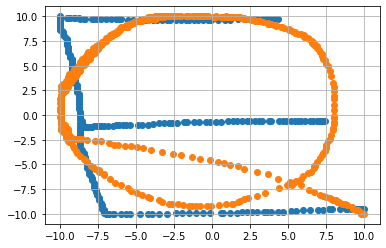

Coeff of E0 :  289.4266253421857
Coeff of Q0_test :  305.04450712852395
Coeff of E1 :  1243.0465506111282
Coeff of Q1_test :  1276.4719466447903
Coeff of E2 :  -1319.2656638663277
Coeff of Q2_test :  -995.8869849547273


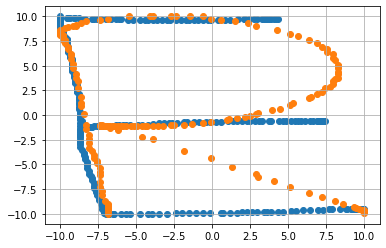

Coeff of E0 :  289.4266253421857
Coeff of R0_test :  254.8594941303752
Coeff of E1 :  1243.0465506111282
Coeff of R1_test :  1124.5862399648388
Coeff of E2 :  -1319.2656638663277
Coeff of R2_test :  -992.1013853714055


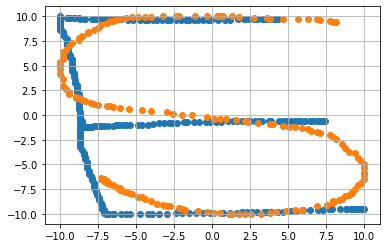

Coeff of E0 :  289.4266253421857
Coeff of S0_test :  290.8544314933228
Coeff of E1 :  1243.0465506111282
Coeff of S1_test :  1226.8256899731539
Coeff of E2 :  -1319.2656638663277
Coeff of S2_test :  -1063.3894728687897


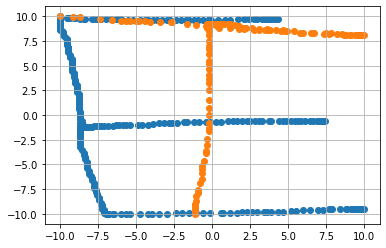

Coeff of E0 :  289.4266253421857
Coeff of T0_test :  236.43423922900277
Coeff of E1 :  1243.0465506111282
Coeff of T1_test :  1121.3978887350374
Coeff of E2 :  -1319.2656638663277
Coeff of T2_test :  -220.72383321871104


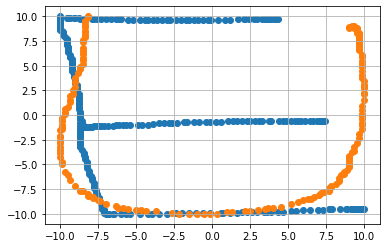

Coeff of E0 :  289.4266253421857
Coeff of U0_test :  275.3156630172093
Coeff of E1 :  1243.0465506111282
Coeff of U1_test :  1361.5579794263167
Coeff of E2 :  -1319.2656638663277
Coeff of U2_test :  -1039.933347800673


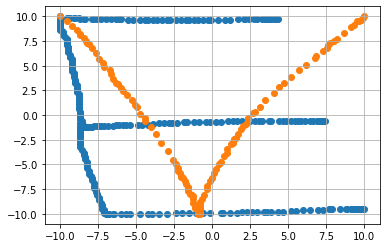

Coeff of E0 :  289.4266253421857
Coeff of V0_test :  225.07537052980817
Coeff of E1 :  1243.0465506111282
Coeff of V1_test :  993.1652737688586
Coeff of E2 :  -1319.2656638663277
Coeff of V2_test :  -888.3002255901538


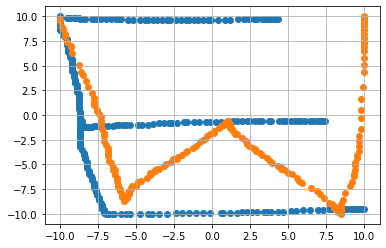

Coeff of E0 :  289.4266253421857
Coeff of W0_test :  236.11100211897917
Coeff of E1 :  1243.0465506111282
Coeff of W1_test :  1076.9716438337794
Coeff of E2 :  -1319.2656638663277
Coeff of W2_test :  -1028.1655377026354


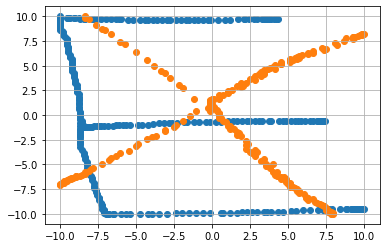

Coeff of E0 :  289.4266253421857
Coeff of X0_test :  202.9950320276672
Coeff of E1 :  1243.0465506111282
Coeff of X1_test :  921.5927592848752
Coeff of E2 :  -1319.2656638663277
Coeff of X2_test :  -664.5155167433047


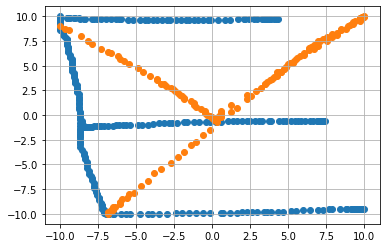

Coeff of E0 :  289.4266253421857
Coeff of Y0_test :  120.89855183715876
Coeff of E1 :  1243.0465506111282
Coeff of Y1_test :  827.7485841209242
Coeff of E2 :  -1319.2656638663277
Coeff of Y2_test :  -358.7235004998596


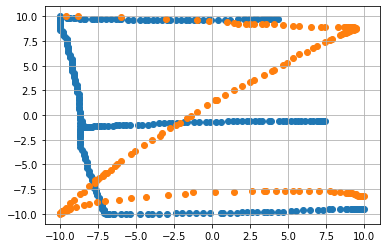

Coeff of E0 :  289.4266253421857
Coeff of Z0_test :  165.25315292561243
Coeff of E1 :  1243.0465506111282
Coeff of Z1_test :  1145.1837448016436
Coeff of E2 :  -1319.2656638663277
Coeff of Z2_test :  -1023.0387527418625


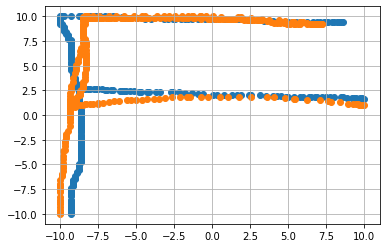

Coeff of F0 :  272.6464167891286
Coeff of F0_test :  303.2106574863934
Coeff of F1 :  1244.8964398323333
Coeff of F1_test :  1311.714510611808
Coeff of F2 :  -1131.92812329564
Coeff of F2_test :  -905.8068476262688


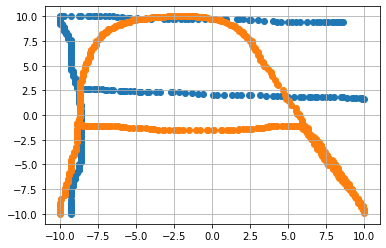

Coeff of F0 :  272.6464167891286
Coeff of A0_test :  295.75212444547986
Coeff of F1 :  1244.8964398323333
Coeff of A1_test :  1167.8748903146416
Coeff of F2 :  -1131.92812329564
Coeff of A2_test :  -833.8149325892592


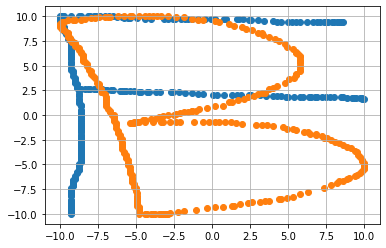

Coeff of F0 :  272.6464167891286
Coeff of B0_test :  259.0953261510756
Coeff of F1 :  1244.8964398323333
Coeff of B1_test :  1079.4803944623545
Coeff of F2 :  -1131.92812329564
Coeff of B2_test :  -967.0156291299161


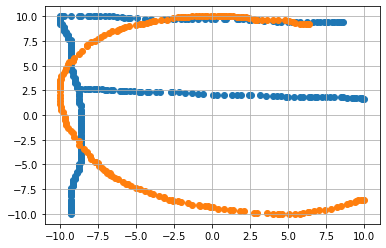

Coeff of F0 :  272.6464167891286
Coeff of C0_test :  303.33333558039624
Coeff of F1 :  1244.8964398323333
Coeff of C1_test :  1324.1760920437448
Coeff of F2 :  -1131.92812329564
Coeff of C2_test :  -1185.8005411694767


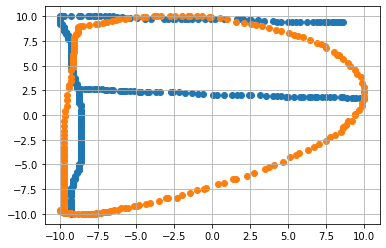

Coeff of F0 :  272.6464167891286
Coeff of D0_test :  258.43618154195667
Coeff of F1 :  1244.8964398323333
Coeff of D1_test :  1320.6773231749596
Coeff of F2 :  -1131.92812329564
Coeff of D2_test :  -1422.3196127785307


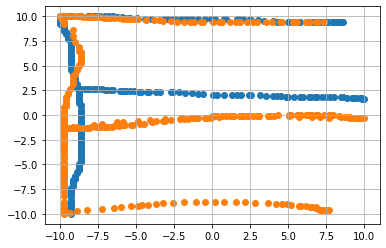

Coeff of F0 :  272.6464167891286
Coeff of E0_test :  265.84587396695025
Coeff of F1 :  1244.8964398323333
Coeff of E1_test :  1153.4052496110676
Coeff of F2 :  -1131.92812329564
Coeff of E2_test :  -1169.2190472063774


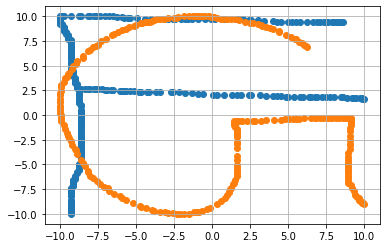

Coeff of F0 :  272.6464167891286
Coeff of G0_test :  287.81806338658964
Coeff of F1 :  1244.8964398323333
Coeff of G1_test :  1184.13016369023
Coeff of F2 :  -1131.92812329564
Coeff of G2_test :  -889.6157584280653


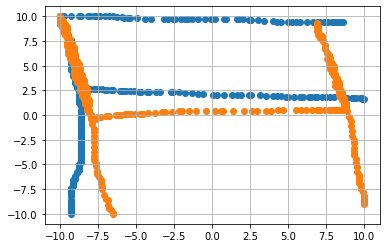

Coeff of F0 :  272.6464167891286
Coeff of H0_test :  274.7281613651508
Coeff of F1 :  1244.8964398323333
Coeff of H1_test :  1207.5890377110502
Coeff of F2 :  -1131.92812329564
Coeff of H2_test :  -835.9788200672382


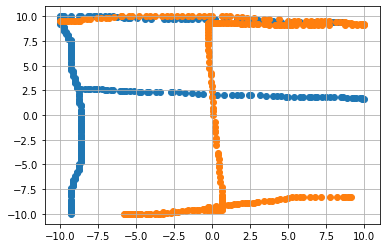

Coeff of F0 :  272.6464167891286
Coeff of I0_test :  270.69151720540685
Coeff of F1 :  1244.8964398323333
Coeff of I1_test :  1241.1484099097927
Coeff of F2 :  -1131.92812329564
Coeff of I2_test :  -812.2991068471923


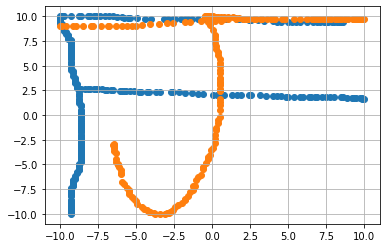

Coeff of F0 :  272.6464167891286
Coeff of J0_test :  221.45118729813638
Coeff of F1 :  1244.8964398323333
Coeff of J1_test :  1126.8306481468614
Coeff of F2 :  -1131.92812329564
Coeff of J2_test :  -566.7243542000019


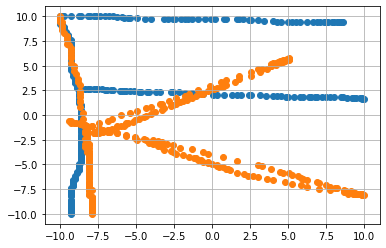

Coeff of F0 :  272.6464167891286
Coeff of K0_test :  225.27417960061194
Coeff of F1 :  1244.8964398323333
Coeff of K1_test :  1019.6317748186923
Coeff of F2 :  -1131.92812329564
Coeff of K2_test :  -1304.4310580413776


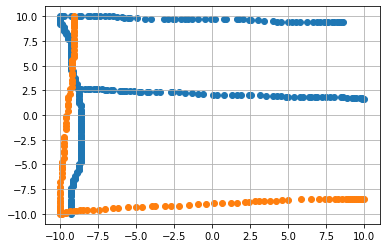

Coeff of F0 :  272.6464167891286
Coeff of l0_test :  285.9043978519215
Coeff of F1 :  1244.8964398323333
Coeff of l1_test :  1422.5570081418418
Coeff of F2 :  -1131.92812329564
Coeff of l2_test :  -2018.5060264647684


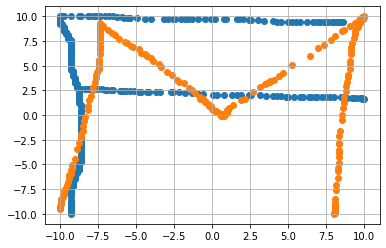

Coeff of F0 :  272.6464167891286
Coeff of M0_test :  214.10803634567756
Coeff of F1 :  1244.8964398323333
Coeff of M1_test :  1089.6741001583043
Coeff of F2 :  -1131.92812329564
Coeff of M2_test :  -629.8972346564841


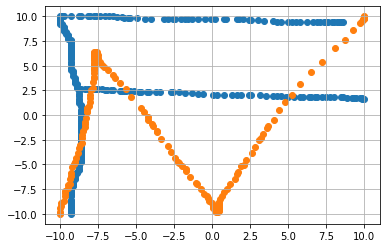

Coeff of F0 :  272.6464167891286
Coeff of N0_test :  243.10505698081576
Coeff of F1 :  1244.8964398323333
Coeff of N1_test :  1105.8386136599713
Coeff of F2 :  -1131.92812329564
Coeff of N2_test :  -1310.925127662746


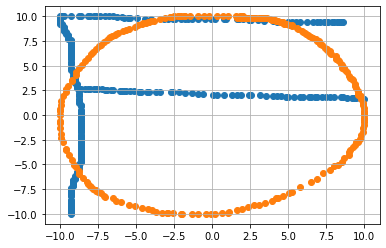

Coeff of F0 :  272.6464167891286
Coeff of O0_test :  269.7623165120487
Coeff of F1 :  1244.8964398323333
Coeff of O1_test :  1282.249724789818
Coeff of F2 :  -1131.92812329564
Coeff of O2_test :  -717.4726016993875


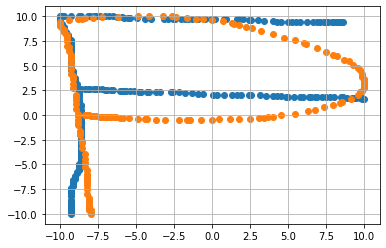

Coeff of F0 :  272.6464167891286
Coeff of P0_test :  253.9459355754082
Coeff of F1 :  1244.8964398323333
Coeff of P1_test :  1164.824965942085
Coeff of F2 :  -1131.92812329564
Coeff of P2_test :  -989.6196113536425


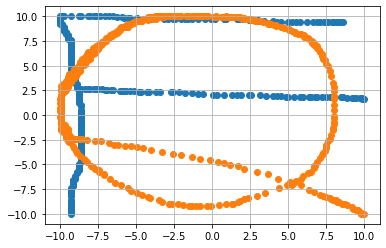

Coeff of F0 :  272.6464167891286
Coeff of Q0_test :  305.04450712852395
Coeff of F1 :  1244.8964398323333
Coeff of Q1_test :  1276.4719466447903
Coeff of F2 :  -1131.92812329564
Coeff of Q2_test :  -995.8869849547273


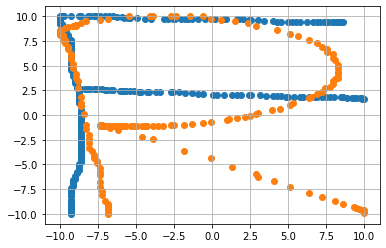

Coeff of F0 :  272.6464167891286
Coeff of R0_test :  254.8594941303752
Coeff of F1 :  1244.8964398323333
Coeff of R1_test :  1124.5862399648388
Coeff of F2 :  -1131.92812329564
Coeff of R2_test :  -992.1013853714055


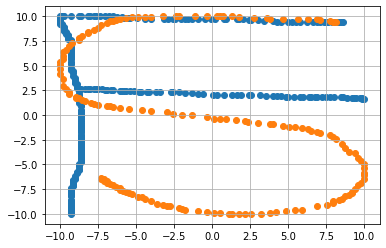

Coeff of F0 :  272.6464167891286
Coeff of S0_test :  290.8544314933228
Coeff of F1 :  1244.8964398323333
Coeff of S1_test :  1226.8256899731539
Coeff of F2 :  -1131.92812329564
Coeff of S2_test :  -1063.3894728687897


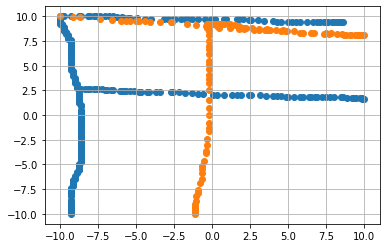

Coeff of F0 :  272.6464167891286
Coeff of T0_test :  236.43423922900277
Coeff of F1 :  1244.8964398323333
Coeff of T1_test :  1121.3978887350374
Coeff of F2 :  -1131.92812329564
Coeff of T2_test :  -220.72383321871104


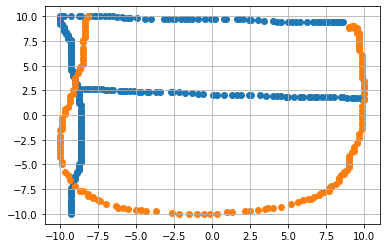

Coeff of F0 :  272.6464167891286
Coeff of U0_test :  275.3156630172093
Coeff of F1 :  1244.8964398323333
Coeff of U1_test :  1361.5579794263167
Coeff of F2 :  -1131.92812329564
Coeff of U2_test :  -1039.933347800673


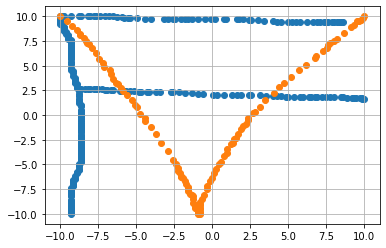

Coeff of F0 :  272.6464167891286
Coeff of V0_test :  225.07537052980817
Coeff of F1 :  1244.8964398323333
Coeff of V1_test :  993.1652737688586
Coeff of F2 :  -1131.92812329564
Coeff of V2_test :  -888.3002255901538


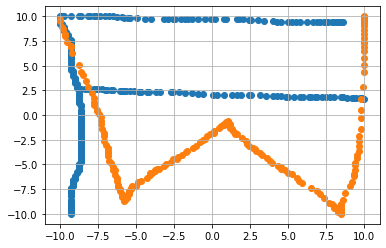

Coeff of F0 :  272.6464167891286
Coeff of W0_test :  236.11100211897917
Coeff of F1 :  1244.8964398323333
Coeff of W1_test :  1076.9716438337794
Coeff of F2 :  -1131.92812329564
Coeff of W2_test :  -1028.1655377026354


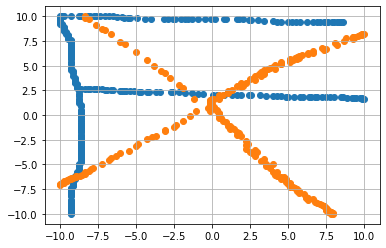

Coeff of F0 :  272.6464167891286
Coeff of X0_test :  202.9950320276672
Coeff of F1 :  1244.8964398323333
Coeff of X1_test :  921.5927592848752
Coeff of F2 :  -1131.92812329564
Coeff of X2_test :  -664.5155167433047


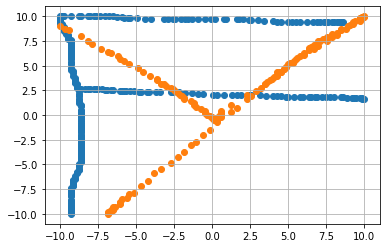

Coeff of F0 :  272.6464167891286
Coeff of Y0_test :  120.89855183715876
Coeff of F1 :  1244.8964398323333
Coeff of Y1_test :  827.7485841209242
Coeff of F2 :  -1131.92812329564
Coeff of Y2_test :  -358.7235004998596


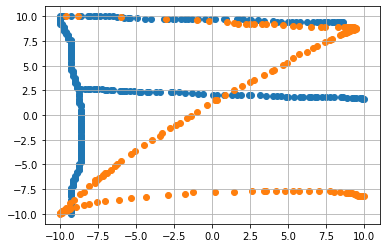

Coeff of F0 :  272.6464167891286
Coeff of Z0_test :  165.25315292561243
Coeff of F1 :  1244.8964398323333
Coeff of Z1_test :  1145.1837448016436
Coeff of F2 :  -1131.92812329564
Coeff of Z2_test :  -1023.0387527418625


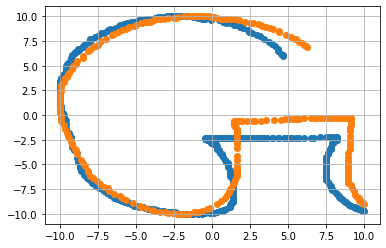

Coeff of G0 :  287.79189450586796
Coeff of G0_test :  287.81806338658964
Coeff of G1 :  1174.136765408722
Coeff of G1_test :  1184.13016369023
Coeff of G2 :  -1157.7973193873183
Coeff of G2_test :  -889.6157584280653


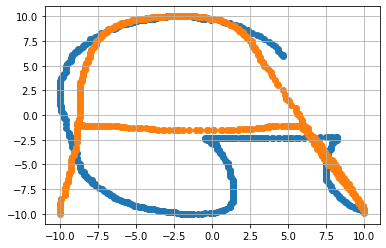

Coeff of G0 :  287.79189450586796
Coeff of A0_test :  295.75212444547986
Coeff of G1 :  1174.136765408722
Coeff of A1_test :  1167.8748903146416
Coeff of G2 :  -1157.7973193873183
Coeff of A2_test :  -833.8149325892592


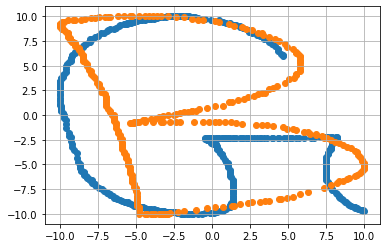

Coeff of G0 :  287.79189450586796
Coeff of B0_test :  259.0953261510756
Coeff of G1 :  1174.136765408722
Coeff of B1_test :  1079.4803944623545
Coeff of G2 :  -1157.7973193873183
Coeff of B2_test :  -967.0156291299161


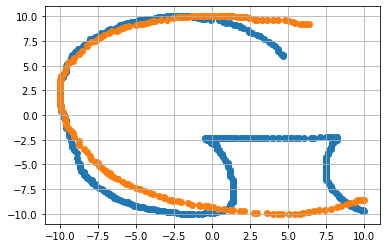

Coeff of G0 :  287.79189450586796
Coeff of C0_test :  303.33333558039624
Coeff of G1 :  1174.136765408722
Coeff of C1_test :  1324.1760920437448
Coeff of G2 :  -1157.7973193873183
Coeff of C2_test :  -1185.8005411694767


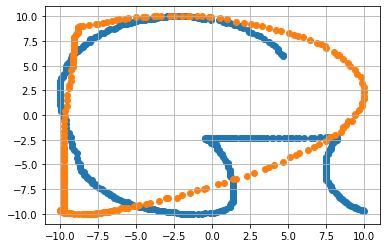

Coeff of G0 :  287.79189450586796
Coeff of D0_test :  258.43618154195667
Coeff of G1 :  1174.136765408722
Coeff of D1_test :  1320.6773231749596
Coeff of G2 :  -1157.7973193873183
Coeff of D2_test :  -1422.3196127785307


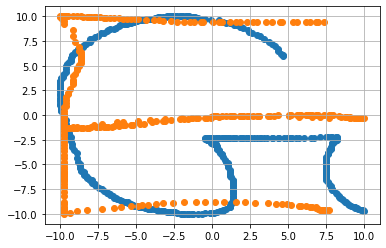

Coeff of G0 :  287.79189450586796
Coeff of E0_test :  265.84587396695025
Coeff of G1 :  1174.136765408722
Coeff of E1_test :  1153.4052496110676
Coeff of G2 :  -1157.7973193873183
Coeff of E2_test :  -1169.2190472063774


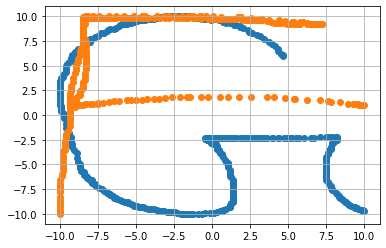

Coeff of G0 :  287.79189450586796
Coeff of F0_test :  303.2106574863934
Coeff of G1 :  1174.136765408722
Coeff of F1_test :  1311.714510611808
Coeff of G2 :  -1157.7973193873183
Coeff of F2_test :  -905.8068476262688


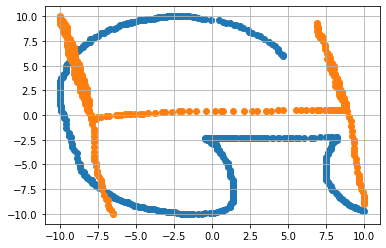

Coeff of G0 :  287.79189450586796
Coeff of H0_test :  274.7281613651508
Coeff of G1 :  1174.136765408722
Coeff of H1_test :  1207.5890377110502
Coeff of G2 :  -1157.7973193873183
Coeff of H2_test :  -835.9788200672382


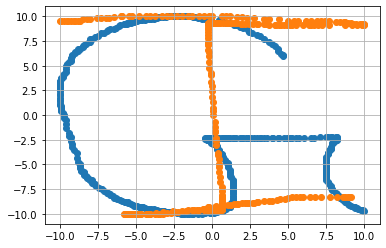

Coeff of G0 :  287.79189450586796
Coeff of I0_test :  270.69151720540685
Coeff of G1 :  1174.136765408722
Coeff of I1_test :  1241.1484099097927
Coeff of G2 :  -1157.7973193873183
Coeff of I2_test :  -812.2991068471923


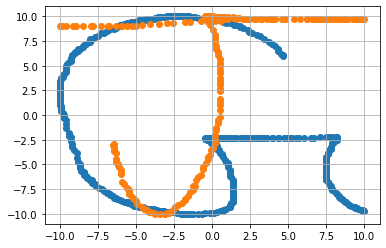

Coeff of G0 :  287.79189450586796
Coeff of J0_test :  221.45118729813638
Coeff of G1 :  1174.136765408722
Coeff of J1_test :  1126.8306481468614
Coeff of G2 :  -1157.7973193873183
Coeff of J2_test :  -566.7243542000019


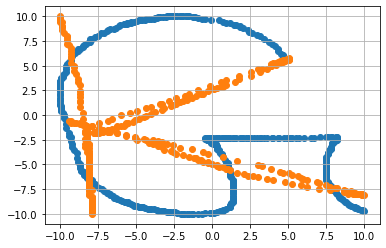

Coeff of G0 :  287.79189450586796
Coeff of K0_test :  225.27417960061194
Coeff of G1 :  1174.136765408722
Coeff of K1_test :  1019.6317748186923
Coeff of G2 :  -1157.7973193873183
Coeff of K2_test :  -1304.4310580413776


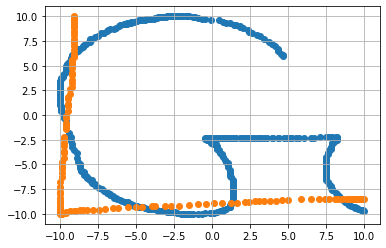

Coeff of G0 :  287.79189450586796
Coeff of l0_test :  285.9043978519215
Coeff of G1 :  1174.136765408722
Coeff of l1_test :  1422.5570081418418
Coeff of G2 :  -1157.7973193873183
Coeff of l2_test :  -2018.5060264647684


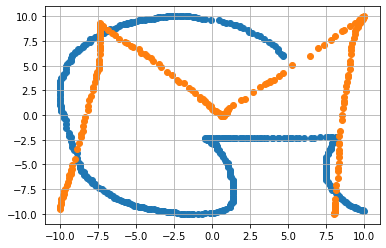

Coeff of G0 :  287.79189450586796
Coeff of M0_test :  214.10803634567756
Coeff of G1 :  1174.136765408722
Coeff of M1_test :  1089.6741001583043
Coeff of G2 :  -1157.7973193873183
Coeff of M2_test :  -629.8972346564841


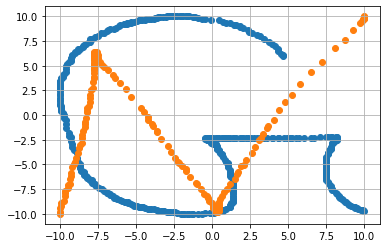

Coeff of G0 :  287.79189450586796
Coeff of N0_test :  243.10505698081576
Coeff of G1 :  1174.136765408722
Coeff of N1_test :  1105.8386136599713
Coeff of G2 :  -1157.7973193873183
Coeff of N2_test :  -1310.925127662746


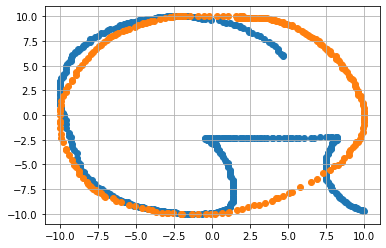

Coeff of G0 :  287.79189450586796
Coeff of O0_test :  269.7623165120487
Coeff of G1 :  1174.136765408722
Coeff of O1_test :  1282.249724789818
Coeff of G2 :  -1157.7973193873183
Coeff of O2_test :  -717.4726016993875


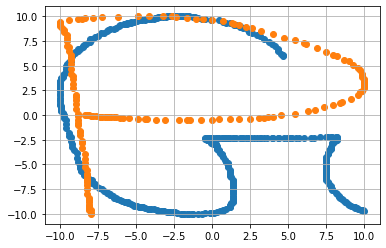

Coeff of G0 :  287.79189450586796
Coeff of P0_test :  253.9459355754082
Coeff of G1 :  1174.136765408722
Coeff of P1_test :  1164.824965942085
Coeff of G2 :  -1157.7973193873183
Coeff of P2_test :  -989.6196113536425


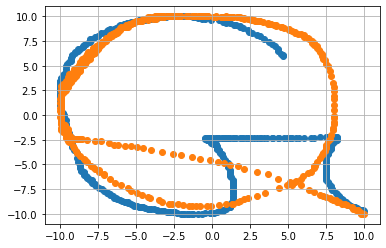

Coeff of G0 :  287.79189450586796
Coeff of Q0_test :  305.04450712852395
Coeff of G1 :  1174.136765408722
Coeff of Q1_test :  1276.4719466447903
Coeff of G2 :  -1157.7973193873183
Coeff of Q2_test :  -995.8869849547273


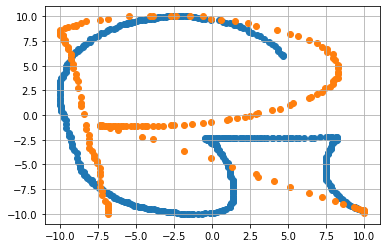

Coeff of G0 :  287.79189450586796
Coeff of R0_test :  254.8594941303752
Coeff of G1 :  1174.136765408722
Coeff of R1_test :  1124.5862399648388
Coeff of G2 :  -1157.7973193873183
Coeff of R2_test :  -992.1013853714055


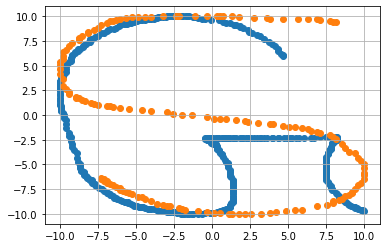

Coeff of G0 :  287.79189450586796
Coeff of S0_test :  290.8544314933228
Coeff of G1 :  1174.136765408722
Coeff of S1_test :  1226.8256899731539
Coeff of G2 :  -1157.7973193873183
Coeff of S2_test :  -1063.3894728687897


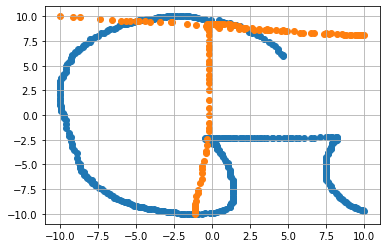

Coeff of G0 :  287.79189450586796
Coeff of T0_test :  236.43423922900277
Coeff of G1 :  1174.136765408722
Coeff of T1_test :  1121.3978887350374
Coeff of G2 :  -1157.7973193873183
Coeff of T2_test :  -220.72383321871104


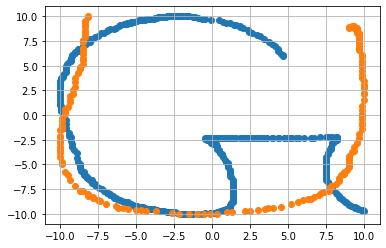

Coeff of G0 :  287.79189450586796
Coeff of U0_test :  275.3156630172093
Coeff of G1 :  1174.136765408722
Coeff of U1_test :  1361.5579794263167
Coeff of G2 :  -1157.7973193873183
Coeff of U2_test :  -1039.933347800673


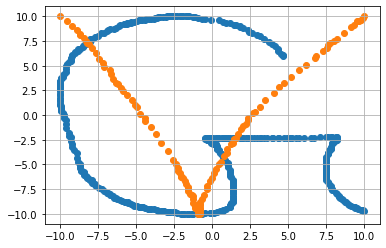

Coeff of G0 :  287.79189450586796
Coeff of V0_test :  225.07537052980817
Coeff of G1 :  1174.136765408722
Coeff of V1_test :  993.1652737688586
Coeff of G2 :  -1157.7973193873183
Coeff of V2_test :  -888.3002255901538


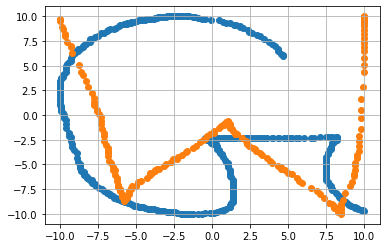

Coeff of G0 :  287.79189450586796
Coeff of W0_test :  236.11100211897917
Coeff of G1 :  1174.136765408722
Coeff of W1_test :  1076.9716438337794
Coeff of G2 :  -1157.7973193873183
Coeff of W2_test :  -1028.1655377026354


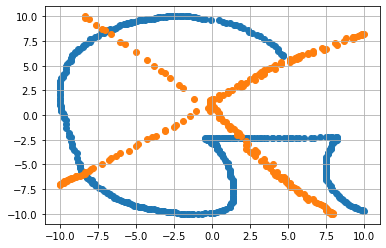

Coeff of G0 :  287.79189450586796
Coeff of X0_test :  202.9950320276672
Coeff of G1 :  1174.136765408722
Coeff of X1_test :  921.5927592848752
Coeff of G2 :  -1157.7973193873183
Coeff of X2_test :  -664.5155167433047


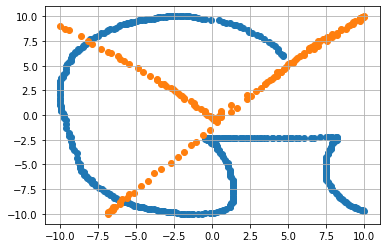

Coeff of G0 :  287.79189450586796
Coeff of Y0_test :  120.89855183715876
Coeff of G1 :  1174.136765408722
Coeff of Y1_test :  827.7485841209242
Coeff of G2 :  -1157.7973193873183
Coeff of Y2_test :  -358.7235004998596


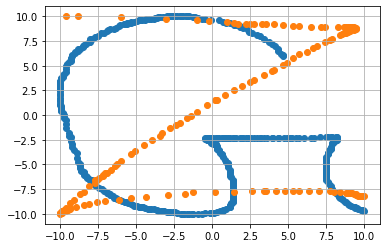

Coeff of G0 :  287.79189450586796
Coeff of Z0_test :  165.25315292561243
Coeff of G1 :  1174.136765408722
Coeff of Z1_test :  1145.1837448016436
Coeff of G2 :  -1157.7973193873183
Coeff of Z2_test :  -1023.0387527418625


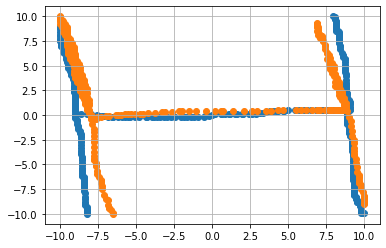

Coeff of H0 :  261.86160507373023
Coeff of H0_test :  274.7281613651508
Coeff of H1 :  1193.3700858161162
Coeff of H1_test :  1207.5890377110502
Coeff of H2 :  -859.0127092125854
Coeff of H2_test :  -835.9788200672382


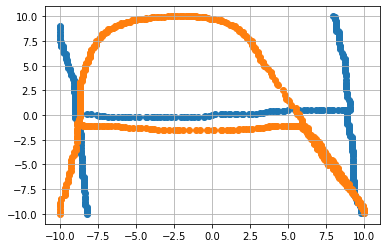

Coeff of H0 :  261.86160507373023
Coeff of A0_test :  295.75212444547986
Coeff of H1 :  1193.3700858161162
Coeff of A1_test :  1167.8748903146416
Coeff of H2 :  -859.0127092125854
Coeff of A2_test :  -833.8149325892592


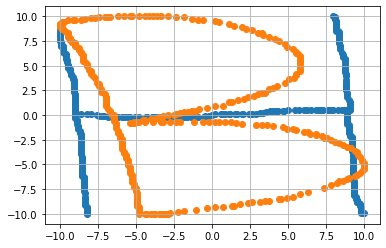

Coeff of H0 :  261.86160507373023
Coeff of B0_test :  259.0953261510756
Coeff of H1 :  1193.3700858161162
Coeff of B1_test :  1079.4803944623545
Coeff of H2 :  -859.0127092125854
Coeff of B2_test :  -967.0156291299161


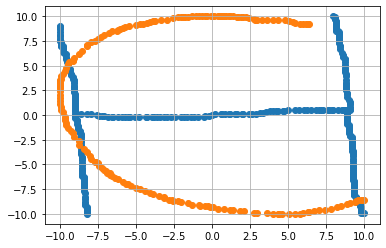

Coeff of H0 :  261.86160507373023
Coeff of C0_test :  303.33333558039624
Coeff of H1 :  1193.3700858161162
Coeff of C1_test :  1324.1760920437448
Coeff of H2 :  -859.0127092125854
Coeff of C2_test :  -1185.8005411694767


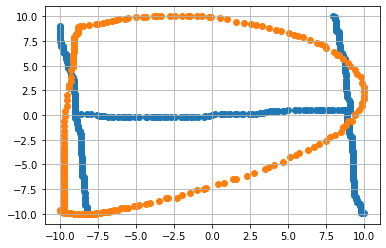

Coeff of H0 :  261.86160507373023
Coeff of D0_test :  258.43618154195667
Coeff of H1 :  1193.3700858161162
Coeff of D1_test :  1320.6773231749596
Coeff of H2 :  -859.0127092125854
Coeff of D2_test :  -1422.3196127785307


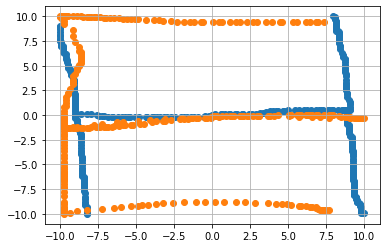

Coeff of H0 :  261.86160507373023
Coeff of E0_test :  265.84587396695025
Coeff of H1 :  1193.3700858161162
Coeff of E1_test :  1153.4052496110676
Coeff of H2 :  -859.0127092125854
Coeff of E2_test :  -1169.2190472063774


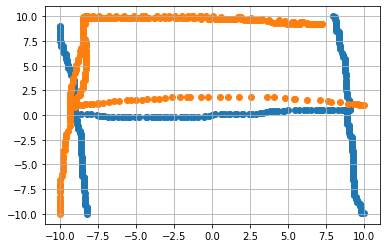

Coeff of H0 :  261.86160507373023
Coeff of F0_test :  303.2106574863934
Coeff of H1 :  1193.3700858161162
Coeff of F1_test :  1311.714510611808
Coeff of H2 :  -859.0127092125854
Coeff of F2_test :  -905.8068476262688


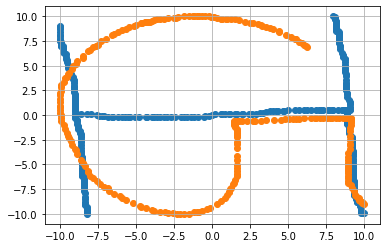

Coeff of H0 :  261.86160507373023
Coeff of G0_test :  287.81806338658964
Coeff of H1 :  1193.3700858161162
Coeff of G1_test :  1184.13016369023
Coeff of H2 :  -859.0127092125854
Coeff of G2_test :  -889.6157584280653


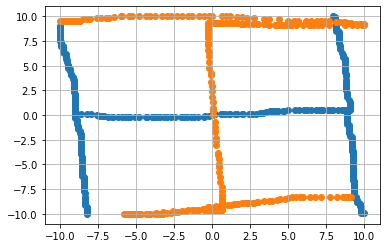

Coeff of H0 :  261.86160507373023
Coeff of I0_test :  270.69151720540685
Coeff of H1 :  1193.3700858161162
Coeff of I1_test :  1241.1484099097927
Coeff of H2 :  -859.0127092125854
Coeff of I2_test :  -812.2991068471923


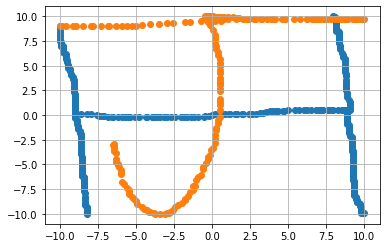

Coeff of H0 :  261.86160507373023
Coeff of J0_test :  221.45118729813638
Coeff of H1 :  1193.3700858161162
Coeff of J1_test :  1126.8306481468614
Coeff of H2 :  -859.0127092125854
Coeff of J2_test :  -566.7243542000019


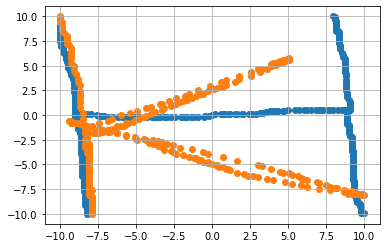

Coeff of H0 :  261.86160507373023
Coeff of K0_test :  225.27417960061194
Coeff of H1 :  1193.3700858161162
Coeff of K1_test :  1019.6317748186923
Coeff of H2 :  -859.0127092125854
Coeff of K2_test :  -1304.4310580413776


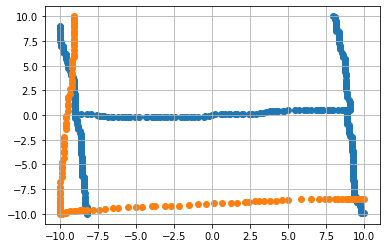

Coeff of H0 :  261.86160507373023
Coeff of l0_test :  285.9043978519215
Coeff of H1 :  1193.3700858161162
Coeff of l1_test :  1422.5570081418418
Coeff of H2 :  -859.0127092125854
Coeff of l2_test :  -2018.5060264647684


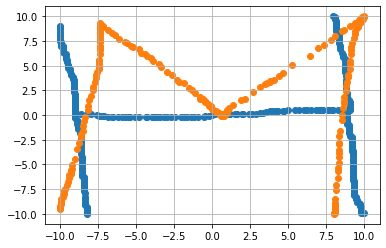

Coeff of H0 :  261.86160507373023
Coeff of M0_test :  214.10803634567756
Coeff of H1 :  1193.3700858161162
Coeff of M1_test :  1089.6741001583043
Coeff of H2 :  -859.0127092125854
Coeff of M2_test :  -629.8972346564841


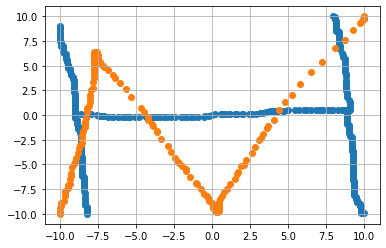

Coeff of H0 :  261.86160507373023
Coeff of N0_test :  243.10505698081576
Coeff of H1 :  1193.3700858161162
Coeff of N1_test :  1105.8386136599713
Coeff of H2 :  -859.0127092125854
Coeff of N2_test :  -1310.925127662746


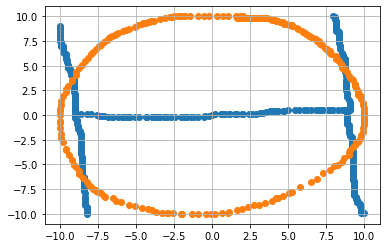

Coeff of H0 :  261.86160507373023
Coeff of O0_test :  269.7623165120487
Coeff of H1 :  1193.3700858161162
Coeff of O1_test :  1282.249724789818
Coeff of H2 :  -859.0127092125854
Coeff of O2_test :  -717.4726016993875


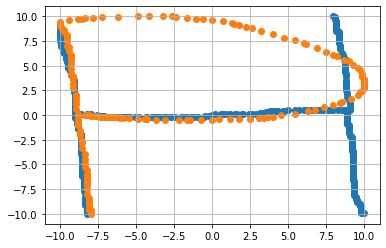

Coeff of H0 :  261.86160507373023
Coeff of P0_test :  253.9459355754082
Coeff of H1 :  1193.3700858161162
Coeff of P1_test :  1164.824965942085
Coeff of H2 :  -859.0127092125854
Coeff of P2_test :  -989.6196113536425


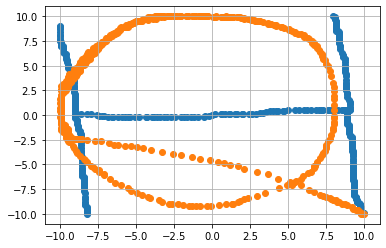

Coeff of H0 :  261.86160507373023
Coeff of Q0_test :  305.04450712852395
Coeff of H1 :  1193.3700858161162
Coeff of Q1_test :  1276.4719466447903
Coeff of H2 :  -859.0127092125854
Coeff of Q2_test :  -995.8869849547273


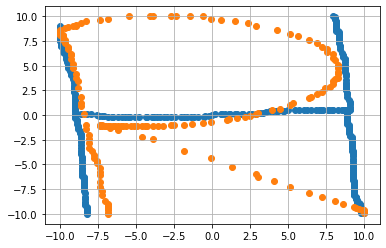

Coeff of H0 :  261.86160507373023
Coeff of R0_test :  254.8594941303752
Coeff of H1 :  1193.3700858161162
Coeff of R1_test :  1124.5862399648388
Coeff of H2 :  -859.0127092125854
Coeff of R2_test :  -992.1013853714055


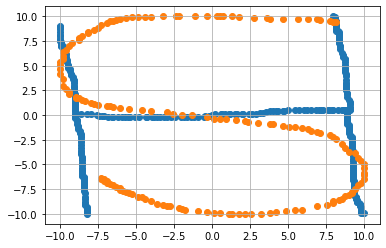

Coeff of H0 :  261.86160507373023
Coeff of S0_test :  290.8544314933228
Coeff of H1 :  1193.3700858161162
Coeff of S1_test :  1226.8256899731539
Coeff of H2 :  -859.0127092125854
Coeff of S2_test :  -1063.3894728687897


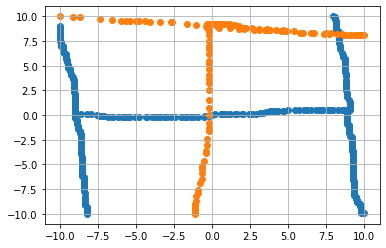

Coeff of H0 :  261.86160507373023
Coeff of T0_test :  236.43423922900277
Coeff of H1 :  1193.3700858161162
Coeff of T1_test :  1121.3978887350374
Coeff of H2 :  -859.0127092125854
Coeff of T2_test :  -220.72383321871104


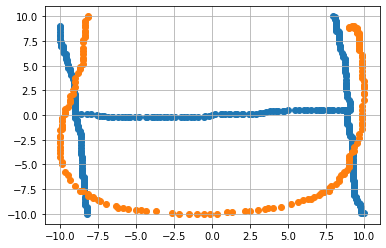

Coeff of H0 :  261.86160507373023
Coeff of U0_test :  275.3156630172093
Coeff of H1 :  1193.3700858161162
Coeff of U1_test :  1361.5579794263167
Coeff of H2 :  -859.0127092125854
Coeff of U2_test :  -1039.933347800673


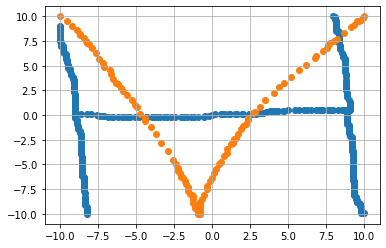

Coeff of H0 :  261.86160507373023
Coeff of V0_test :  225.07537052980817
Coeff of H1 :  1193.3700858161162
Coeff of V1_test :  993.1652737688586
Coeff of H2 :  -859.0127092125854
Coeff of V2_test :  -888.3002255901538


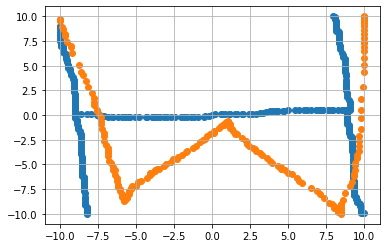

Coeff of H0 :  261.86160507373023
Coeff of W0_test :  236.11100211897917
Coeff of H1 :  1193.3700858161162
Coeff of W1_test :  1076.9716438337794
Coeff of H2 :  -859.0127092125854
Coeff of W2_test :  -1028.1655377026354


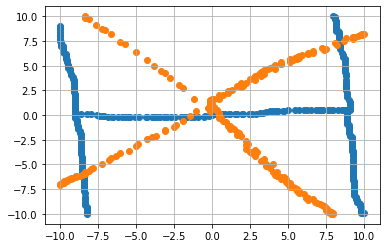

Coeff of H0 :  261.86160507373023
Coeff of X0_test :  202.9950320276672
Coeff of H1 :  1193.3700858161162
Coeff of X1_test :  921.5927592848752
Coeff of H2 :  -859.0127092125854
Coeff of X2_test :  -664.5155167433047


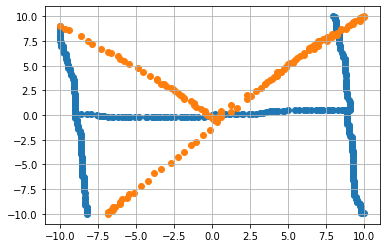

Coeff of H0 :  261.86160507373023
Coeff of Y0_test :  120.89855183715876
Coeff of H1 :  1193.3700858161162
Coeff of Y1_test :  827.7485841209242
Coeff of H2 :  -859.0127092125854
Coeff of Y2_test :  -358.7235004998596


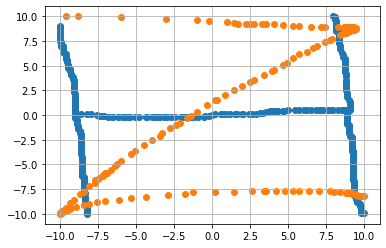

Coeff of H0 :  261.86160507373023
Coeff of Z0_test :  165.25315292561243
Coeff of H1 :  1193.3700858161162
Coeff of Z1_test :  1145.1837448016436
Coeff of H2 :  -859.0127092125854
Coeff of Z2_test :  -1023.0387527418625


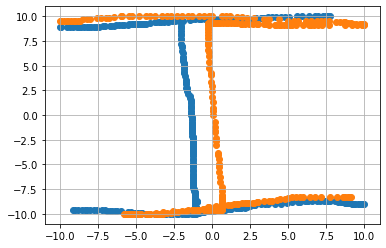

Coeff of I0 :  277.35047945254865
Coeff of I0_test :  270.69151720540685
Coeff of I1 :  1169.7245774208448
Coeff of I1_test :  1241.1484099097927
Coeff of I2 :  -1089.4978885931232
Coeff of I2_test :  -812.2991068471923


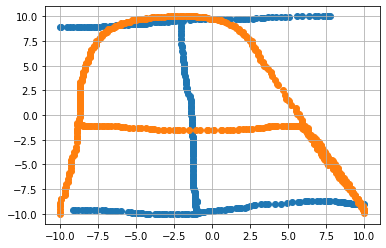

Coeff of I0 :  277.35047945254865
Coeff of A0_test :  295.75212444547986
Coeff of I1 :  1169.7245774208448
Coeff of A1_test :  1167.8748903146416
Coeff of I2 :  -1089.4978885931232
Coeff of A2_test :  -833.8149325892592


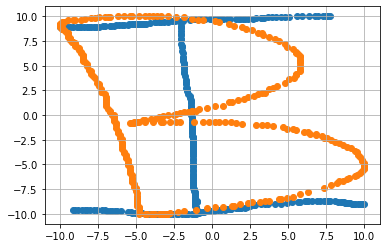

Coeff of I0 :  277.35047945254865
Coeff of B0_test :  259.0953261510756
Coeff of I1 :  1169.7245774208448
Coeff of B1_test :  1079.4803944623545
Coeff of I2 :  -1089.4978885931232
Coeff of B2_test :  -967.0156291299161


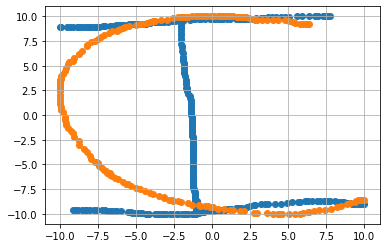

Coeff of I0 :  277.35047945254865
Coeff of C0_test :  303.33333558039624
Coeff of I1 :  1169.7245774208448
Coeff of C1_test :  1324.1760920437448
Coeff of I2 :  -1089.4978885931232
Coeff of C2_test :  -1185.8005411694767


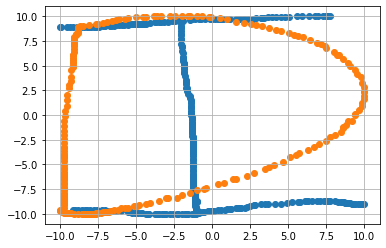

Coeff of I0 :  277.35047945254865
Coeff of D0_test :  258.43618154195667
Coeff of I1 :  1169.7245774208448
Coeff of D1_test :  1320.6773231749596
Coeff of I2 :  -1089.4978885931232
Coeff of D2_test :  -1422.3196127785307


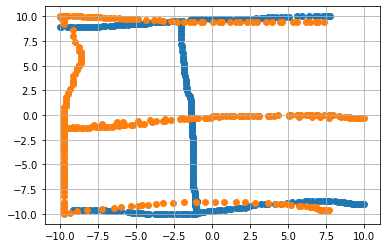

Coeff of I0 :  277.35047945254865
Coeff of E0_test :  265.84587396695025
Coeff of I1 :  1169.7245774208448
Coeff of E1_test :  1153.4052496110676
Coeff of I2 :  -1089.4978885931232
Coeff of E2_test :  -1169.2190472063774


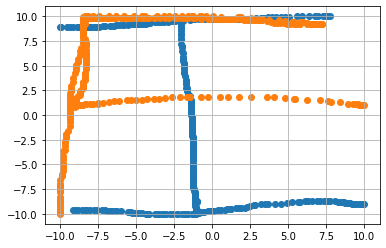

Coeff of I0 :  277.35047945254865
Coeff of F0_test :  303.2106574863934
Coeff of I1 :  1169.7245774208448
Coeff of F1_test :  1311.714510611808
Coeff of I2 :  -1089.4978885931232
Coeff of F2_test :  -905.8068476262688


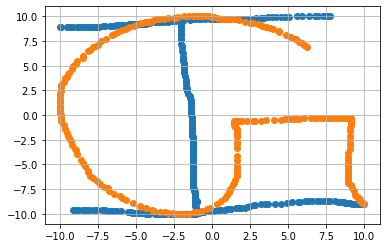

Coeff of I0 :  277.35047945254865
Coeff of G0_test :  287.81806338658964
Coeff of I1 :  1169.7245774208448
Coeff of G1_test :  1184.13016369023
Coeff of I2 :  -1089.4978885931232
Coeff of G2_test :  -889.6157584280653


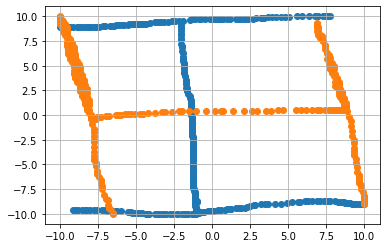

Coeff of I0 :  277.35047945254865
Coeff of H0_test :  274.7281613651508
Coeff of I1 :  1169.7245774208448
Coeff of H1_test :  1207.5890377110502
Coeff of I2 :  -1089.4978885931232
Coeff of H2_test :  -835.9788200672382


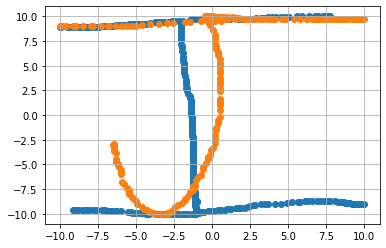

Coeff of I0 :  277.35047945254865
Coeff of J0_test :  221.45118729813638
Coeff of I1 :  1169.7245774208448
Coeff of J1_test :  1126.8306481468614
Coeff of I2 :  -1089.4978885931232
Coeff of J2_test :  -566.7243542000019


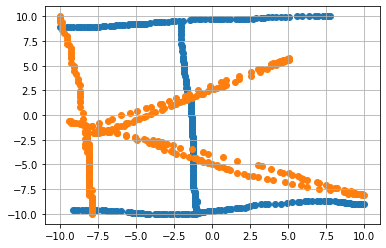

Coeff of I0 :  277.35047945254865
Coeff of K0_test :  225.27417960061194
Coeff of I1 :  1169.7245774208448
Coeff of K1_test :  1019.6317748186923
Coeff of I2 :  -1089.4978885931232
Coeff of K2_test :  -1304.4310580413776


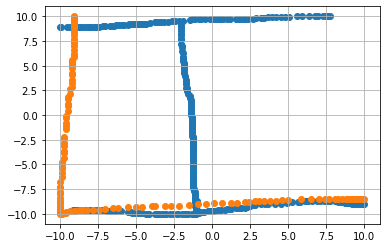

Coeff of I0 :  277.35047945254865
Coeff of l0_test :  285.9043978519215
Coeff of I1 :  1169.7245774208448
Coeff of l1_test :  1422.5570081418418
Coeff of I2 :  -1089.4978885931232
Coeff of l2_test :  -2018.5060264647684


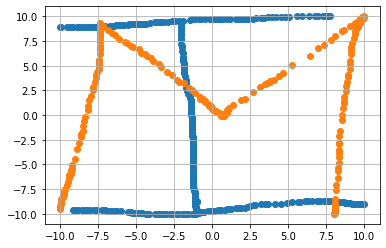

Coeff of I0 :  277.35047945254865
Coeff of M0_test :  214.10803634567756
Coeff of I1 :  1169.7245774208448
Coeff of M1_test :  1089.6741001583043
Coeff of I2 :  -1089.4978885931232
Coeff of M2_test :  -629.8972346564841


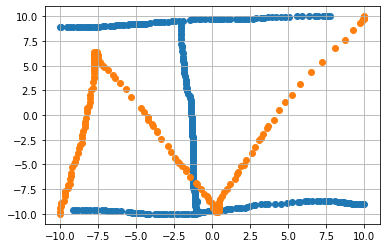

Coeff of I0 :  277.35047945254865
Coeff of N0_test :  243.10505698081576
Coeff of I1 :  1169.7245774208448
Coeff of N1_test :  1105.8386136599713
Coeff of I2 :  -1089.4978885931232
Coeff of N2_test :  -1310.925127662746


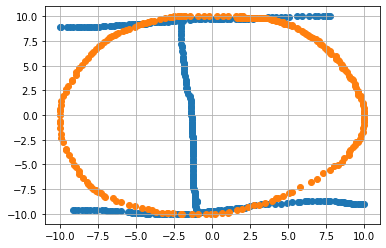

Coeff of I0 :  277.35047945254865
Coeff of O0_test :  269.7623165120487
Coeff of I1 :  1169.7245774208448
Coeff of O1_test :  1282.249724789818
Coeff of I2 :  -1089.4978885931232
Coeff of O2_test :  -717.4726016993875


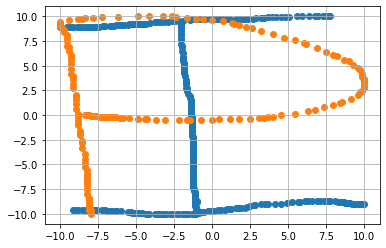

Coeff of I0 :  277.35047945254865
Coeff of P0_test :  253.9459355754082
Coeff of I1 :  1169.7245774208448
Coeff of P1_test :  1164.824965942085
Coeff of I2 :  -1089.4978885931232
Coeff of P2_test :  -989.6196113536425


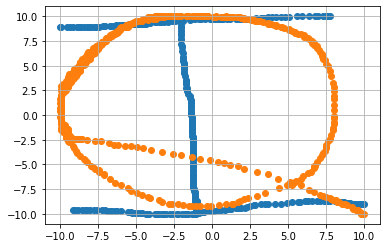

Coeff of I0 :  277.35047945254865
Coeff of Q0_test :  305.04450712852395
Coeff of I1 :  1169.7245774208448
Coeff of Q1_test :  1276.4719466447903
Coeff of I2 :  -1089.4978885931232
Coeff of Q2_test :  -995.8869849547273


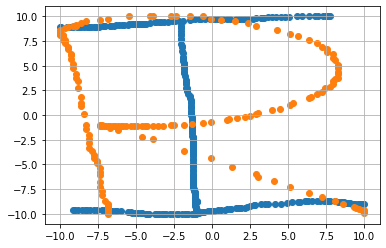

Coeff of I0 :  277.35047945254865
Coeff of R0_test :  254.8594941303752
Coeff of I1 :  1169.7245774208448
Coeff of R1_test :  1124.5862399648388
Coeff of I2 :  -1089.4978885931232
Coeff of R2_test :  -992.1013853714055


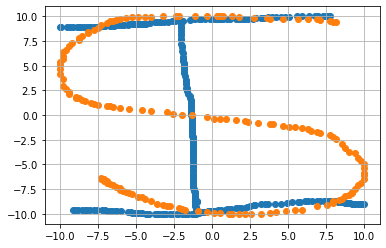

Coeff of I0 :  277.35047945254865
Coeff of S0_test :  290.8544314933228
Coeff of I1 :  1169.7245774208448
Coeff of S1_test :  1226.8256899731539
Coeff of I2 :  -1089.4978885931232
Coeff of S2_test :  -1063.3894728687897


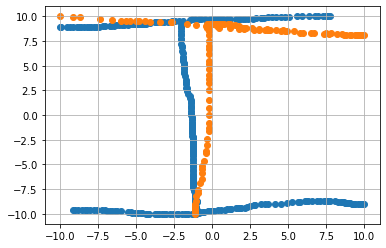

Coeff of I0 :  277.35047945254865
Coeff of T0_test :  236.43423922900277
Coeff of I1 :  1169.7245774208448
Coeff of T1_test :  1121.3978887350374
Coeff of I2 :  -1089.4978885931232
Coeff of T2_test :  -220.72383321871104


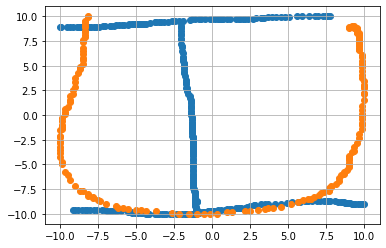

Coeff of I0 :  277.35047945254865
Coeff of U0_test :  275.3156630172093
Coeff of I1 :  1169.7245774208448
Coeff of U1_test :  1361.5579794263167
Coeff of I2 :  -1089.4978885931232
Coeff of U2_test :  -1039.933347800673


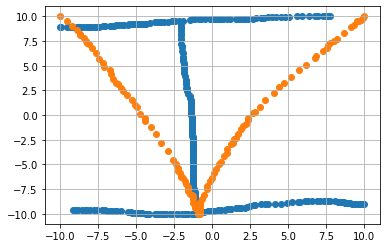

Coeff of I0 :  277.35047945254865
Coeff of V0_test :  225.07537052980817
Coeff of I1 :  1169.7245774208448
Coeff of V1_test :  993.1652737688586
Coeff of I2 :  -1089.4978885931232
Coeff of V2_test :  -888.3002255901538


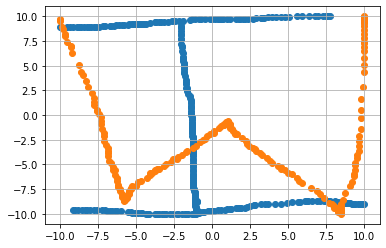

Coeff of I0 :  277.35047945254865
Coeff of W0_test :  236.11100211897917
Coeff of I1 :  1169.7245774208448
Coeff of W1_test :  1076.9716438337794
Coeff of I2 :  -1089.4978885931232
Coeff of W2_test :  -1028.1655377026354


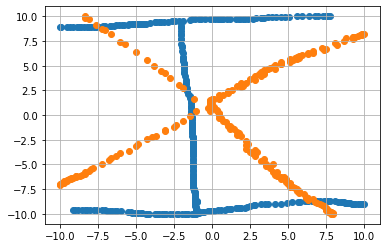

Coeff of I0 :  277.35047945254865
Coeff of X0_test :  202.9950320276672
Coeff of I1 :  1169.7245774208448
Coeff of X1_test :  921.5927592848752
Coeff of I2 :  -1089.4978885931232
Coeff of X2_test :  -664.5155167433047


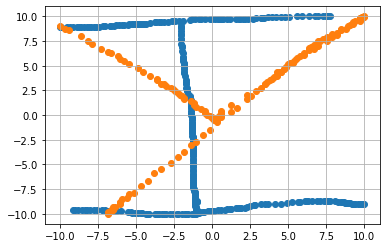

Coeff of I0 :  277.35047945254865
Coeff of Y0_test :  120.89855183715876
Coeff of I1 :  1169.7245774208448
Coeff of Y1_test :  827.7485841209242
Coeff of I2 :  -1089.4978885931232
Coeff of Y2_test :  -358.7235004998596


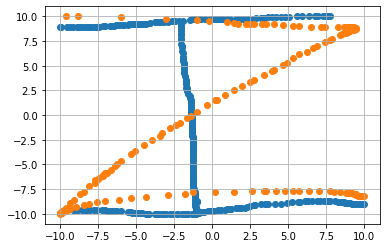

Coeff of I0 :  277.35047945254865
Coeff of Z0_test :  165.25315292561243
Coeff of I1 :  1169.7245774208448
Coeff of Z1_test :  1145.1837448016436
Coeff of I2 :  -1089.4978885931232
Coeff of Z2_test :  -1023.0387527418625


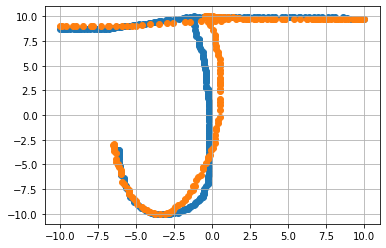

Coeff of J0 :  239.93568278875009
Coeff of J0_test :  221.45118729813638
Coeff of J1 :  1061.9473513747164
Coeff of J1_test :  1126.8306481468614
Coeff of J2 :  -799.4288818046165
Coeff of J2_test :  -566.7243542000019


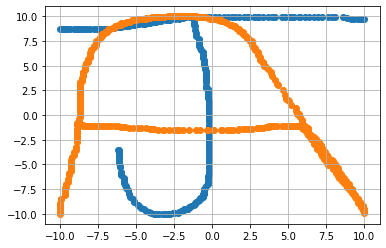

Coeff of J0 :  239.93568278875009
Coeff of A0_test :  295.75212444547986
Coeff of J1 :  1061.9473513747164
Coeff of A1_test :  1167.8748903146416
Coeff of J2 :  -799.4288818046165
Coeff of A2_test :  -833.8149325892592


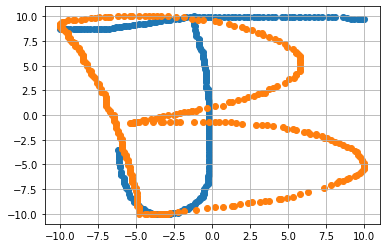

Coeff of J0 :  239.93568278875009
Coeff of B0_test :  259.0953261510756
Coeff of J1 :  1061.9473513747164
Coeff of B1_test :  1079.4803944623545
Coeff of J2 :  -799.4288818046165
Coeff of B2_test :  -967.0156291299161


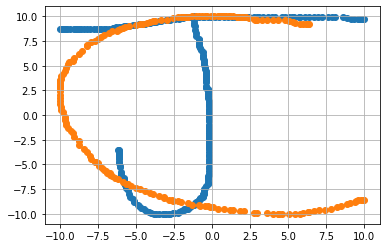

Coeff of J0 :  239.93568278875009
Coeff of C0_test :  303.33333558039624
Coeff of J1 :  1061.9473513747164
Coeff of C1_test :  1324.1760920437448
Coeff of J2 :  -799.4288818046165
Coeff of C2_test :  -1185.8005411694767


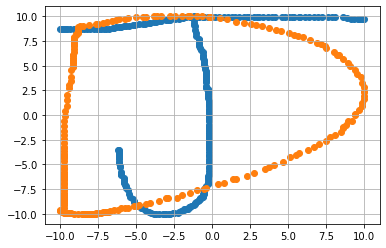

Coeff of J0 :  239.93568278875009
Coeff of D0_test :  258.43618154195667
Coeff of J1 :  1061.9473513747164
Coeff of D1_test :  1320.6773231749596
Coeff of J2 :  -799.4288818046165
Coeff of D2_test :  -1422.3196127785307


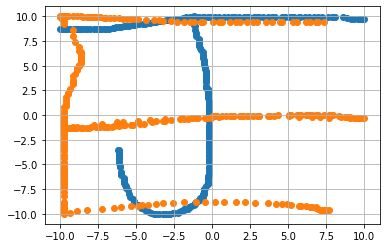

Coeff of J0 :  239.93568278875009
Coeff of E0_test :  265.84587396695025
Coeff of J1 :  1061.9473513747164
Coeff of E1_test :  1153.4052496110676
Coeff of J2 :  -799.4288818046165
Coeff of E2_test :  -1169.2190472063774


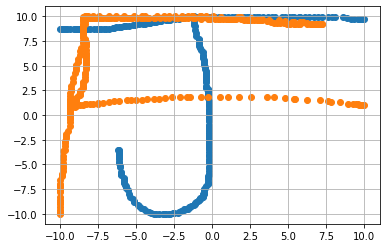

Coeff of J0 :  239.93568278875009
Coeff of F0_test :  303.2106574863934
Coeff of J1 :  1061.9473513747164
Coeff of F1_test :  1311.714510611808
Coeff of J2 :  -799.4288818046165
Coeff of F2_test :  -905.8068476262688


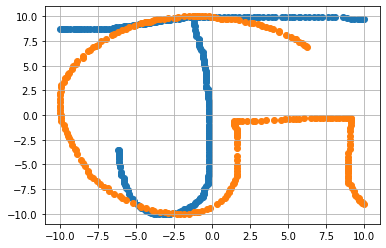

Coeff of J0 :  239.93568278875009
Coeff of G0_test :  287.81806338658964
Coeff of J1 :  1061.9473513747164
Coeff of G1_test :  1184.13016369023
Coeff of J2 :  -799.4288818046165
Coeff of G2_test :  -889.6157584280653


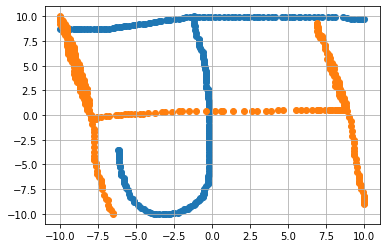

Coeff of J0 :  239.93568278875009
Coeff of H0_test :  274.7281613651508
Coeff of J1 :  1061.9473513747164
Coeff of H1_test :  1207.5890377110502
Coeff of J2 :  -799.4288818046165
Coeff of H2_test :  -835.9788200672382


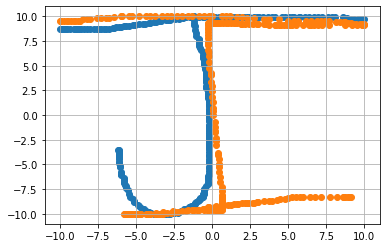

Coeff of J0 :  239.93568278875009
Coeff of I0_test :  270.69151720540685
Coeff of J1 :  1061.9473513747164
Coeff of I1_test :  1241.1484099097927
Coeff of J2 :  -799.4288818046165
Coeff of I2_test :  -812.2991068471923


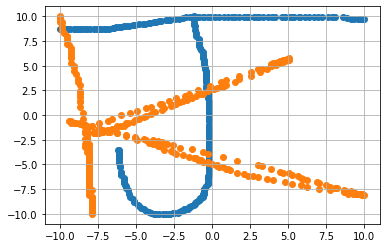

Coeff of J0 :  239.93568278875009
Coeff of K0_test :  225.27417960061194
Coeff of J1 :  1061.9473513747164
Coeff of K1_test :  1019.6317748186923
Coeff of J2 :  -799.4288818046165
Coeff of K2_test :  -1304.4310580413776


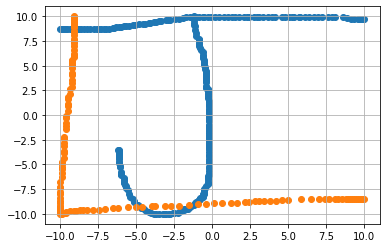

Coeff of J0 :  239.93568278875009
Coeff of l0_test :  285.9043978519215
Coeff of J1 :  1061.9473513747164
Coeff of l1_test :  1422.5570081418418
Coeff of J2 :  -799.4288818046165
Coeff of l2_test :  -2018.5060264647684


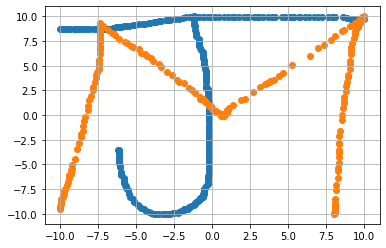

Coeff of J0 :  239.93568278875009
Coeff of M0_test :  214.10803634567756
Coeff of J1 :  1061.9473513747164
Coeff of M1_test :  1089.6741001583043
Coeff of J2 :  -799.4288818046165
Coeff of M2_test :  -629.8972346564841


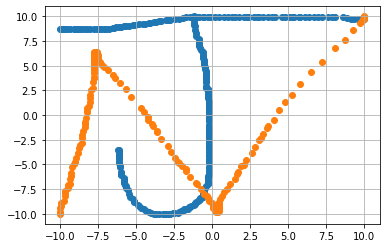

Coeff of J0 :  239.93568278875009
Coeff of N0_test :  243.10505698081576
Coeff of J1 :  1061.9473513747164
Coeff of N1_test :  1105.8386136599713
Coeff of J2 :  -799.4288818046165
Coeff of N2_test :  -1310.925127662746


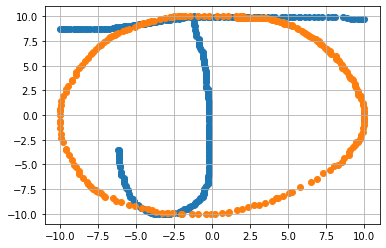

Coeff of J0 :  239.93568278875009
Coeff of O0_test :  269.7623165120487
Coeff of J1 :  1061.9473513747164
Coeff of O1_test :  1282.249724789818
Coeff of J2 :  -799.4288818046165
Coeff of O2_test :  -717.4726016993875


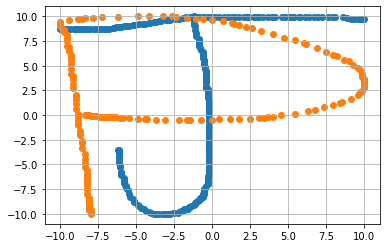

Coeff of J0 :  239.93568278875009
Coeff of P0_test :  253.9459355754082
Coeff of J1 :  1061.9473513747164
Coeff of P1_test :  1164.824965942085
Coeff of J2 :  -799.4288818046165
Coeff of P2_test :  -989.6196113536425


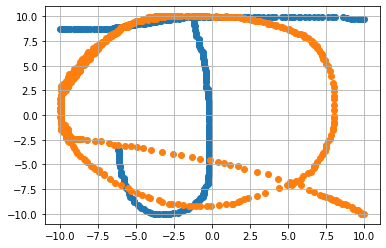

Coeff of J0 :  239.93568278875009
Coeff of Q0_test :  305.04450712852395
Coeff of J1 :  1061.9473513747164
Coeff of Q1_test :  1276.4719466447903
Coeff of J2 :  -799.4288818046165
Coeff of Q2_test :  -995.8869849547273


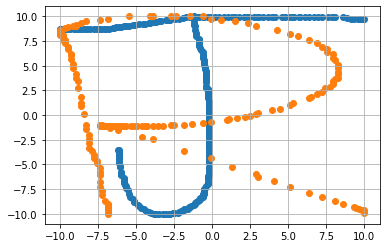

Coeff of J0 :  239.93568278875009
Coeff of R0_test :  254.8594941303752
Coeff of J1 :  1061.9473513747164
Coeff of R1_test :  1124.5862399648388
Coeff of J2 :  -799.4288818046165
Coeff of R2_test :  -992.1013853714055


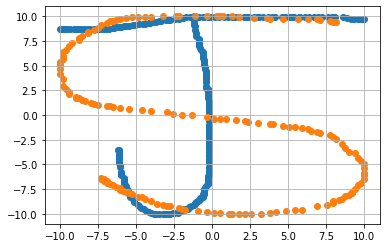

Coeff of J0 :  239.93568278875009
Coeff of S0_test :  290.8544314933228
Coeff of J1 :  1061.9473513747164
Coeff of S1_test :  1226.8256899731539
Coeff of J2 :  -799.4288818046165
Coeff of S2_test :  -1063.3894728687897


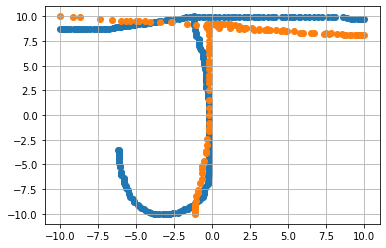

Coeff of J0 :  239.93568278875009
Coeff of T0_test :  236.43423922900277
Coeff of J1 :  1061.9473513747164
Coeff of T1_test :  1121.3978887350374
Coeff of J2 :  -799.4288818046165
Coeff of T2_test :  -220.72383321871104


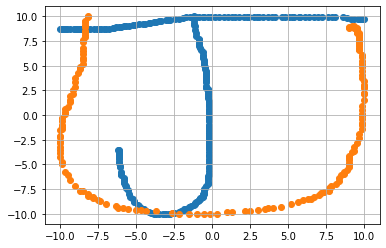

Coeff of J0 :  239.93568278875009
Coeff of U0_test :  275.3156630172093
Coeff of J1 :  1061.9473513747164
Coeff of U1_test :  1361.5579794263167
Coeff of J2 :  -799.4288818046165
Coeff of U2_test :  -1039.933347800673


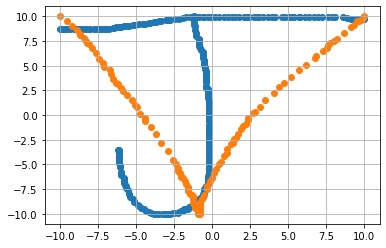

Coeff of J0 :  239.93568278875009
Coeff of V0_test :  225.07537052980817
Coeff of J1 :  1061.9473513747164
Coeff of V1_test :  993.1652737688586
Coeff of J2 :  -799.4288818046165
Coeff of V2_test :  -888.3002255901538


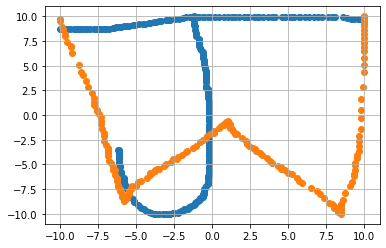

Coeff of J0 :  239.93568278875009
Coeff of W0_test :  236.11100211897917
Coeff of J1 :  1061.9473513747164
Coeff of W1_test :  1076.9716438337794
Coeff of J2 :  -799.4288818046165
Coeff of W2_test :  -1028.1655377026354


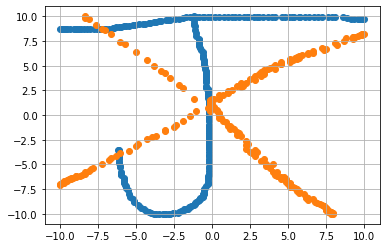

Coeff of J0 :  239.93568278875009
Coeff of X0_test :  202.9950320276672
Coeff of J1 :  1061.9473513747164
Coeff of X1_test :  921.5927592848752
Coeff of J2 :  -799.4288818046165
Coeff of X2_test :  -664.5155167433047


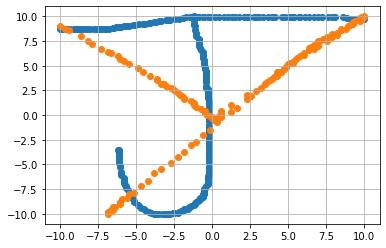

Coeff of J0 :  239.93568278875009
Coeff of Y0_test :  120.89855183715876
Coeff of J1 :  1061.9473513747164
Coeff of Y1_test :  827.7485841209242
Coeff of J2 :  -799.4288818046165
Coeff of Y2_test :  -358.7235004998596


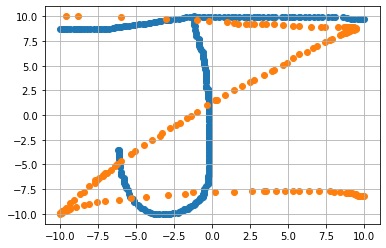

Coeff of J0 :  239.93568278875009
Coeff of Z0_test :  165.25315292561243
Coeff of J1 :  1061.9473513747164
Coeff of Z1_test :  1145.1837448016436
Coeff of J2 :  -799.4288818046165
Coeff of Z2_test :  -1023.0387527418625


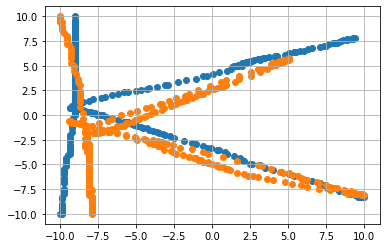

Coeff of K0 :  256.91038800719286
Coeff of K0_test :  225.27417960061194
Coeff of K1 :  1133.9740544501024
Coeff of K1_test :  1019.6317748186923
Coeff of K2 :  -1130.73148024525
Coeff of K2_test :  -1304.4310580413776


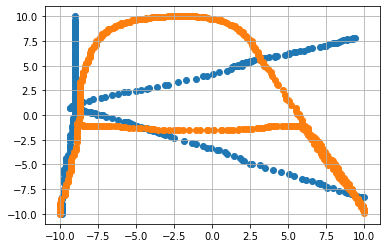

Coeff of K0 :  256.91038800719286
Coeff of A0_test :  295.75212444547986
Coeff of K1 :  1133.9740544501024
Coeff of A1_test :  1167.8748903146416
Coeff of K2 :  -1130.73148024525
Coeff of A2_test :  -833.8149325892592


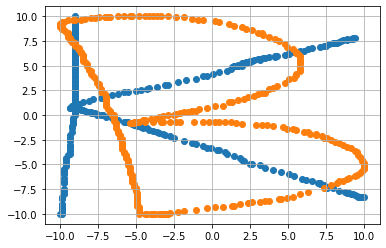

Coeff of K0 :  256.91038800719286
Coeff of B0_test :  259.0953261510756
Coeff of K1 :  1133.9740544501024
Coeff of B1_test :  1079.4803944623545
Coeff of K2 :  -1130.73148024525
Coeff of B2_test :  -967.0156291299161


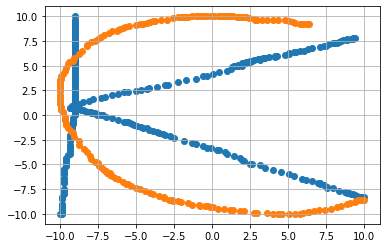

Coeff of K0 :  256.91038800719286
Coeff of C0_test :  303.33333558039624
Coeff of K1 :  1133.9740544501024
Coeff of C1_test :  1324.1760920437448
Coeff of K2 :  -1130.73148024525
Coeff of C2_test :  -1185.8005411694767


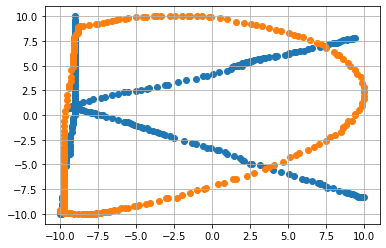

Coeff of K0 :  256.91038800719286
Coeff of D0_test :  258.43618154195667
Coeff of K1 :  1133.9740544501024
Coeff of D1_test :  1320.6773231749596
Coeff of K2 :  -1130.73148024525
Coeff of D2_test :  -1422.3196127785307


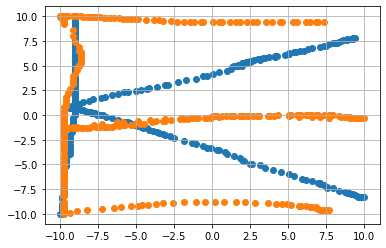

Coeff of K0 :  256.91038800719286
Coeff of E0_test :  265.84587396695025
Coeff of K1 :  1133.9740544501024
Coeff of E1_test :  1153.4052496110676
Coeff of K2 :  -1130.73148024525
Coeff of E2_test :  -1169.2190472063774


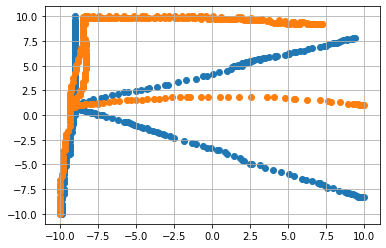

Coeff of K0 :  256.91038800719286
Coeff of F0_test :  303.2106574863934
Coeff of K1 :  1133.9740544501024
Coeff of F1_test :  1311.714510611808
Coeff of K2 :  -1130.73148024525
Coeff of F2_test :  -905.8068476262688


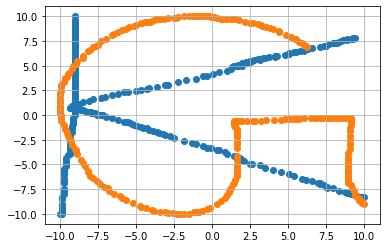

Coeff of K0 :  256.91038800719286
Coeff of G0_test :  287.81806338658964
Coeff of K1 :  1133.9740544501024
Coeff of G1_test :  1184.13016369023
Coeff of K2 :  -1130.73148024525
Coeff of G2_test :  -889.6157584280653


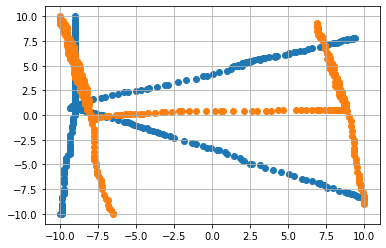

Coeff of K0 :  256.91038800719286
Coeff of H0_test :  274.7281613651508
Coeff of K1 :  1133.9740544501024
Coeff of H1_test :  1207.5890377110502
Coeff of K2 :  -1130.73148024525
Coeff of H2_test :  -835.9788200672382


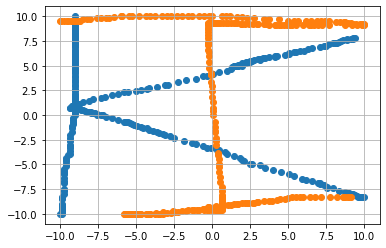

Coeff of K0 :  256.91038800719286
Coeff of I0_test :  270.69151720540685
Coeff of K1 :  1133.9740544501024
Coeff of I1_test :  1241.1484099097927
Coeff of K2 :  -1130.73148024525
Coeff of I2_test :  -812.2991068471923


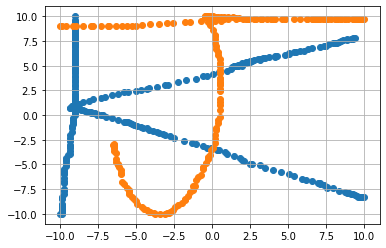

Coeff of K0 :  256.91038800719286
Coeff of J0_test :  221.45118729813638
Coeff of K1 :  1133.9740544501024
Coeff of J1_test :  1126.8306481468614
Coeff of K2 :  -1130.73148024525
Coeff of J2_test :  -566.7243542000019


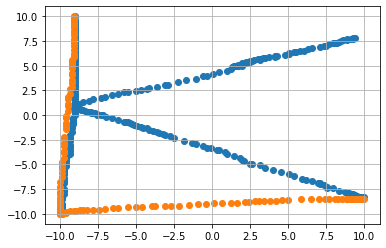

Coeff of K0 :  256.91038800719286
Coeff of l0_test :  285.9043978519215
Coeff of K1 :  1133.9740544501024
Coeff of l1_test :  1422.5570081418418
Coeff of K2 :  -1130.73148024525
Coeff of l2_test :  -2018.5060264647684


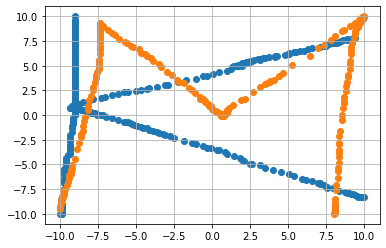

Coeff of K0 :  256.91038800719286
Coeff of M0_test :  214.10803634567756
Coeff of K1 :  1133.9740544501024
Coeff of M1_test :  1089.6741001583043
Coeff of K2 :  -1130.73148024525
Coeff of M2_test :  -629.8972346564841


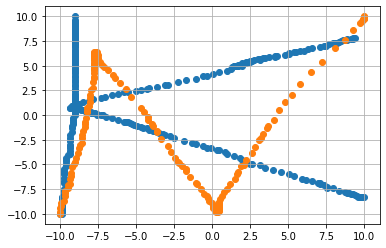

Coeff of K0 :  256.91038800719286
Coeff of N0_test :  243.10505698081576
Coeff of K1 :  1133.9740544501024
Coeff of N1_test :  1105.8386136599713
Coeff of K2 :  -1130.73148024525
Coeff of N2_test :  -1310.925127662746


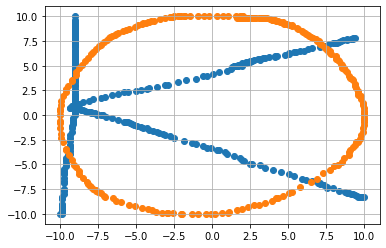

Coeff of K0 :  256.91038800719286
Coeff of O0_test :  269.7623165120487
Coeff of K1 :  1133.9740544501024
Coeff of O1_test :  1282.249724789818
Coeff of K2 :  -1130.73148024525
Coeff of O2_test :  -717.4726016993875


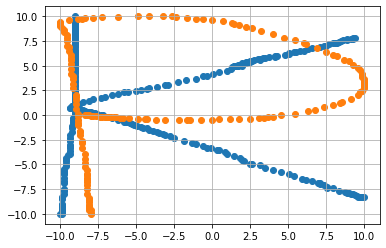

Coeff of K0 :  256.91038800719286
Coeff of P0_test :  253.9459355754082
Coeff of K1 :  1133.9740544501024
Coeff of P1_test :  1164.824965942085
Coeff of K2 :  -1130.73148024525
Coeff of P2_test :  -989.6196113536425


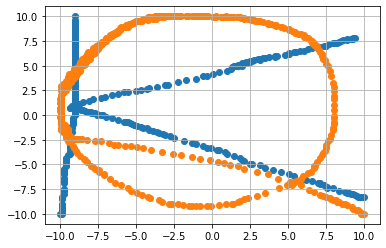

Coeff of K0 :  256.91038800719286
Coeff of Q0_test :  305.04450712852395
Coeff of K1 :  1133.9740544501024
Coeff of Q1_test :  1276.4719466447903
Coeff of K2 :  -1130.73148024525
Coeff of Q2_test :  -995.8869849547273


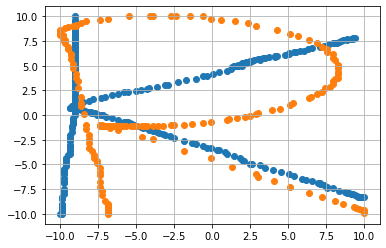

Coeff of K0 :  256.91038800719286
Coeff of R0_test :  254.8594941303752
Coeff of K1 :  1133.9740544501024
Coeff of R1_test :  1124.5862399648388
Coeff of K2 :  -1130.73148024525
Coeff of R2_test :  -992.1013853714055


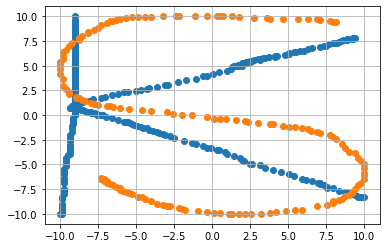

Coeff of K0 :  256.91038800719286
Coeff of S0_test :  290.8544314933228
Coeff of K1 :  1133.9740544501024
Coeff of S1_test :  1226.8256899731539
Coeff of K2 :  -1130.73148024525
Coeff of S2_test :  -1063.3894728687897


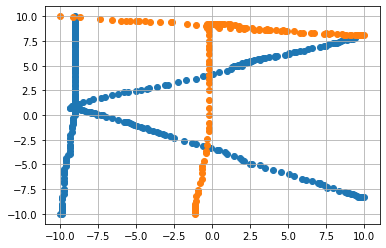

Coeff of K0 :  256.91038800719286
Coeff of T0_test :  236.43423922900277
Coeff of K1 :  1133.9740544501024
Coeff of T1_test :  1121.3978887350374
Coeff of K2 :  -1130.73148024525
Coeff of T2_test :  -220.72383321871104


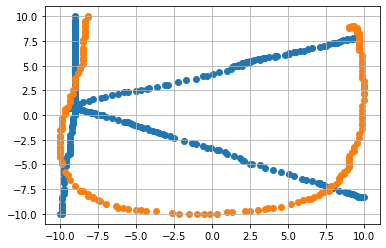

Coeff of K0 :  256.91038800719286
Coeff of U0_test :  275.3156630172093
Coeff of K1 :  1133.9740544501024
Coeff of U1_test :  1361.5579794263167
Coeff of K2 :  -1130.73148024525
Coeff of U2_test :  -1039.933347800673


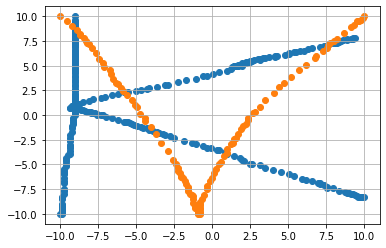

Coeff of K0 :  256.91038800719286
Coeff of V0_test :  225.07537052980817
Coeff of K1 :  1133.9740544501024
Coeff of V1_test :  993.1652737688586
Coeff of K2 :  -1130.73148024525
Coeff of V2_test :  -888.3002255901538


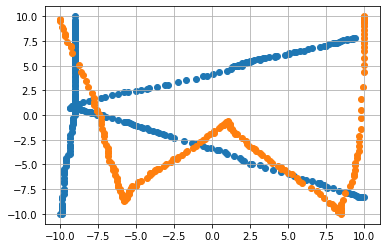

Coeff of K0 :  256.91038800719286
Coeff of W0_test :  236.11100211897917
Coeff of K1 :  1133.9740544501024
Coeff of W1_test :  1076.9716438337794
Coeff of K2 :  -1130.73148024525
Coeff of W2_test :  -1028.1655377026354


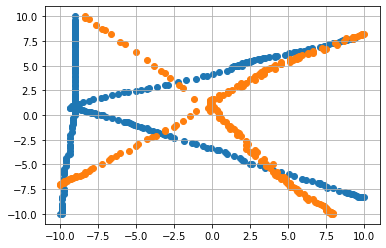

Coeff of K0 :  256.91038800719286
Coeff of X0_test :  202.9950320276672
Coeff of K1 :  1133.9740544501024
Coeff of X1_test :  921.5927592848752
Coeff of K2 :  -1130.73148024525
Coeff of X2_test :  -664.5155167433047


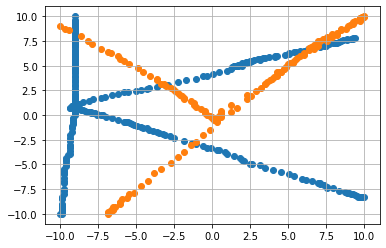

Coeff of K0 :  256.91038800719286
Coeff of Y0_test :  120.89855183715876
Coeff of K1 :  1133.9740544501024
Coeff of Y1_test :  827.7485841209242
Coeff of K2 :  -1130.73148024525
Coeff of Y2_test :  -358.7235004998596


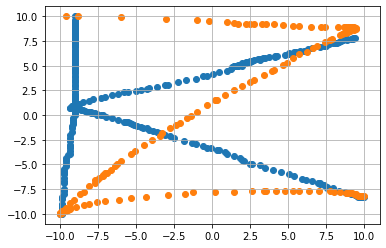

Coeff of K0 :  256.91038800719286
Coeff of Z0_test :  165.25315292561243
Coeff of K1 :  1133.9740544501024
Coeff of Z1_test :  1145.1837448016436
Coeff of K2 :  -1130.73148024525
Coeff of Z2_test :  -1023.0387527418625


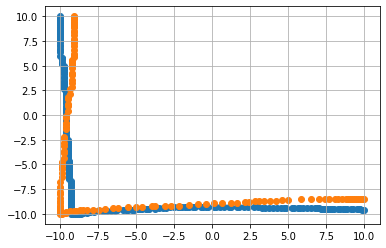

Coeff of l0 :  289.13059030332465
Coeff of l0_test :  285.9043978519215
Coeff of l1 :  1409.1669271638855
Coeff of l1_test :  1422.5570081418418
Coeff of l2 :  -2071.0214744612304
Coeff of l2_test :  -2018.5060264647684


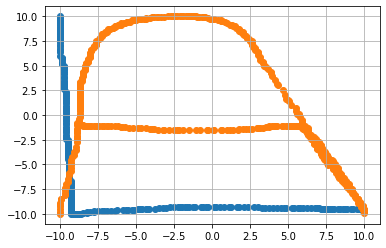

Coeff of l0 :  289.13059030332465
Coeff of A0_test :  295.75212444547986
Coeff of l1 :  1409.1669271638855
Coeff of A1_test :  1167.8748903146416
Coeff of l2 :  -2071.0214744612304
Coeff of A2_test :  -833.8149325892592


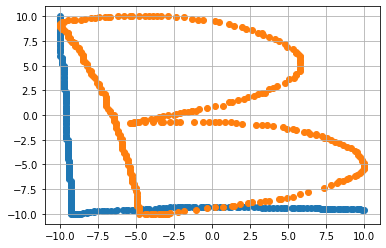

Coeff of l0 :  289.13059030332465
Coeff of B0_test :  259.0953261510756
Coeff of l1 :  1409.1669271638855
Coeff of B1_test :  1079.4803944623545
Coeff of l2 :  -2071.0214744612304
Coeff of B2_test :  -967.0156291299161


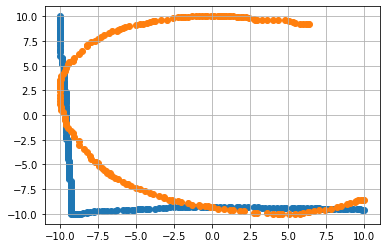

Coeff of l0 :  289.13059030332465
Coeff of C0_test :  303.33333558039624
Coeff of l1 :  1409.1669271638855
Coeff of C1_test :  1324.1760920437448
Coeff of l2 :  -2071.0214744612304
Coeff of C2_test :  -1185.8005411694767


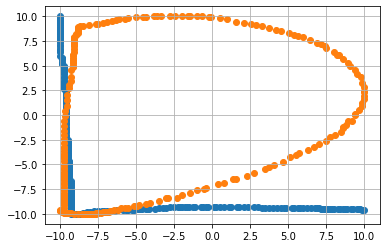

Coeff of l0 :  289.13059030332465
Coeff of D0_test :  258.43618154195667
Coeff of l1 :  1409.1669271638855
Coeff of D1_test :  1320.6773231749596
Coeff of l2 :  -2071.0214744612304
Coeff of D2_test :  -1422.3196127785307


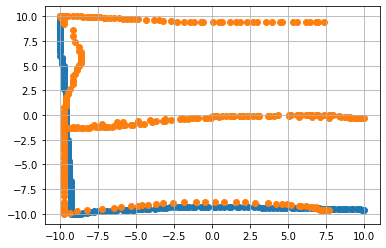

Coeff of l0 :  289.13059030332465
Coeff of E0_test :  265.84587396695025
Coeff of l1 :  1409.1669271638855
Coeff of E1_test :  1153.4052496110676
Coeff of l2 :  -2071.0214744612304
Coeff of E2_test :  -1169.2190472063774


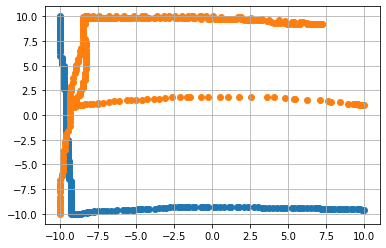

Coeff of l0 :  289.13059030332465
Coeff of F0_test :  303.2106574863934
Coeff of l1 :  1409.1669271638855
Coeff of F1_test :  1311.714510611808
Coeff of l2 :  -2071.0214744612304
Coeff of F2_test :  -905.8068476262688


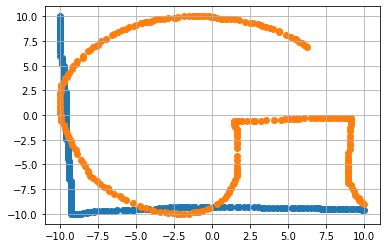

Coeff of l0 :  289.13059030332465
Coeff of G0_test :  287.81806338658964
Coeff of l1 :  1409.1669271638855
Coeff of G1_test :  1184.13016369023
Coeff of l2 :  -2071.0214744612304
Coeff of G2_test :  -889.6157584280653


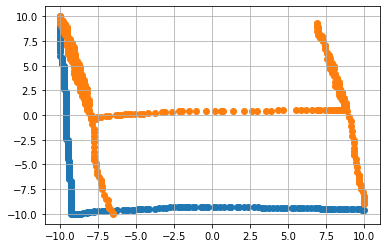

Coeff of l0 :  289.13059030332465
Coeff of H0_test :  274.7281613651508
Coeff of l1 :  1409.1669271638855
Coeff of H1_test :  1207.5890377110502
Coeff of l2 :  -2071.0214744612304
Coeff of H2_test :  -835.9788200672382


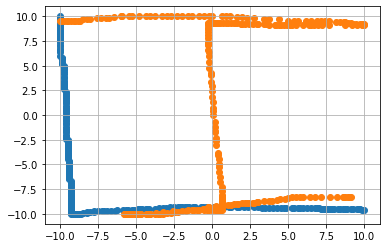

Coeff of l0 :  289.13059030332465
Coeff of I0_test :  270.69151720540685
Coeff of l1 :  1409.1669271638855
Coeff of I1_test :  1241.1484099097927
Coeff of l2 :  -2071.0214744612304
Coeff of I2_test :  -812.2991068471923


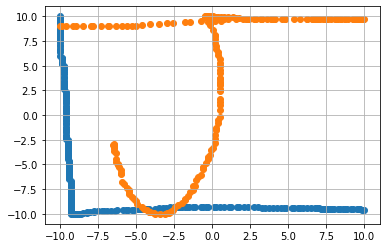

Coeff of l0 :  289.13059030332465
Coeff of J0_test :  221.45118729813638
Coeff of l1 :  1409.1669271638855
Coeff of J1_test :  1126.8306481468614
Coeff of l2 :  -2071.0214744612304
Coeff of J2_test :  -566.7243542000019


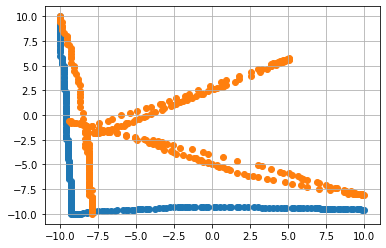

Coeff of l0 :  289.13059030332465
Coeff of K0_test :  225.27417960061194
Coeff of l1 :  1409.1669271638855
Coeff of K1_test :  1019.6317748186923
Coeff of l2 :  -2071.0214744612304
Coeff of K2_test :  -1304.4310580413776


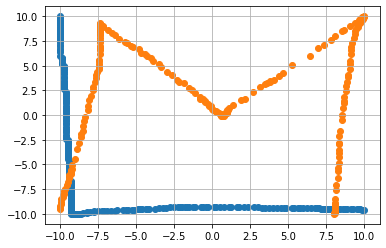

Coeff of l0 :  289.13059030332465
Coeff of M0_test :  214.10803634567756
Coeff of l1 :  1409.1669271638855
Coeff of M1_test :  1089.6741001583043
Coeff of l2 :  -2071.0214744612304
Coeff of M2_test :  -629.8972346564841


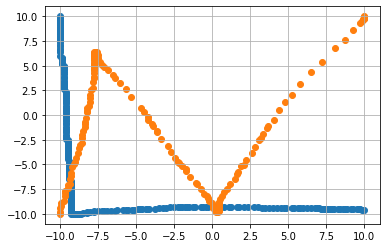

Coeff of l0 :  289.13059030332465
Coeff of N0_test :  243.10505698081576
Coeff of l1 :  1409.1669271638855
Coeff of N1_test :  1105.8386136599713
Coeff of l2 :  -2071.0214744612304
Coeff of N2_test :  -1310.925127662746


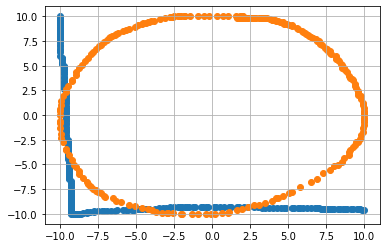

Coeff of l0 :  289.13059030332465
Coeff of O0_test :  269.7623165120487
Coeff of l1 :  1409.1669271638855
Coeff of O1_test :  1282.249724789818
Coeff of l2 :  -2071.0214744612304
Coeff of O2_test :  -717.4726016993875


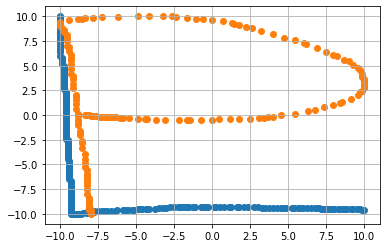

Coeff of l0 :  289.13059030332465
Coeff of P0_test :  253.9459355754082
Coeff of l1 :  1409.1669271638855
Coeff of P1_test :  1164.824965942085
Coeff of l2 :  -2071.0214744612304
Coeff of P2_test :  -989.6196113536425


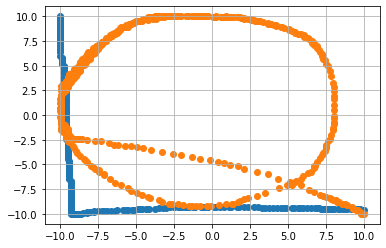

Coeff of l0 :  289.13059030332465
Coeff of Q0_test :  305.04450712852395
Coeff of l1 :  1409.1669271638855
Coeff of Q1_test :  1276.4719466447903
Coeff of l2 :  -2071.0214744612304
Coeff of Q2_test :  -995.8869849547273


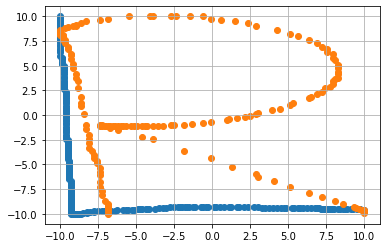

Coeff of l0 :  289.13059030332465
Coeff of R0_test :  254.8594941303752
Coeff of l1 :  1409.1669271638855
Coeff of R1_test :  1124.5862399648388
Coeff of l2 :  -2071.0214744612304
Coeff of R2_test :  -992.1013853714055


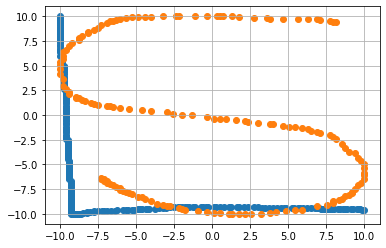

Coeff of l0 :  289.13059030332465
Coeff of S0_test :  290.8544314933228
Coeff of l1 :  1409.1669271638855
Coeff of S1_test :  1226.8256899731539
Coeff of l2 :  -2071.0214744612304
Coeff of S2_test :  -1063.3894728687897


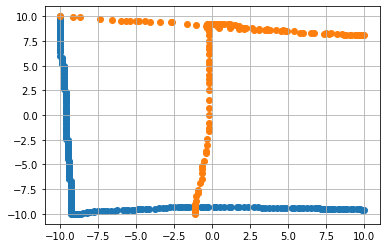

Coeff of l0 :  289.13059030332465
Coeff of T0_test :  236.43423922900277
Coeff of l1 :  1409.1669271638855
Coeff of T1_test :  1121.3978887350374
Coeff of l2 :  -2071.0214744612304
Coeff of T2_test :  -220.72383321871104


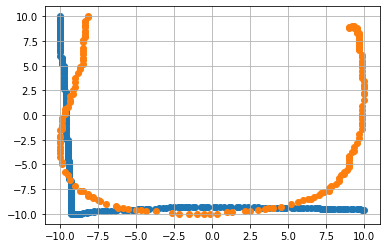

Coeff of l0 :  289.13059030332465
Coeff of U0_test :  275.3156630172093
Coeff of l1 :  1409.1669271638855
Coeff of U1_test :  1361.5579794263167
Coeff of l2 :  -2071.0214744612304
Coeff of U2_test :  -1039.933347800673


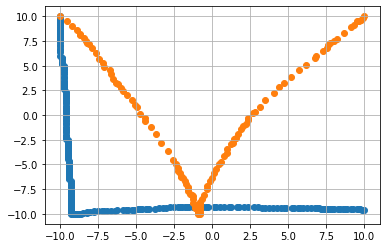

Coeff of l0 :  289.13059030332465
Coeff of V0_test :  225.07537052980817
Coeff of l1 :  1409.1669271638855
Coeff of V1_test :  993.1652737688586
Coeff of l2 :  -2071.0214744612304
Coeff of V2_test :  -888.3002255901538


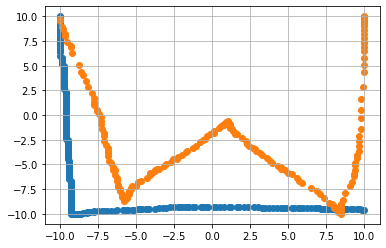

Coeff of l0 :  289.13059030332465
Coeff of W0_test :  236.11100211897917
Coeff of l1 :  1409.1669271638855
Coeff of W1_test :  1076.9716438337794
Coeff of l2 :  -2071.0214744612304
Coeff of W2_test :  -1028.1655377026354


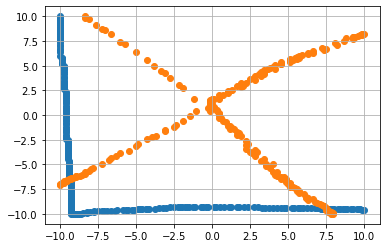

Coeff of l0 :  289.13059030332465
Coeff of X0_test :  202.9950320276672
Coeff of l1 :  1409.1669271638855
Coeff of X1_test :  921.5927592848752
Coeff of l2 :  -2071.0214744612304
Coeff of X2_test :  -664.5155167433047


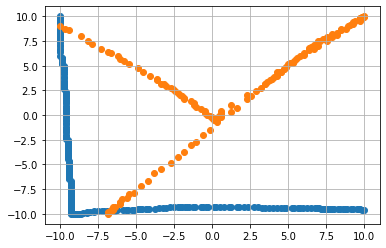

Coeff of l0 :  289.13059030332465
Coeff of Y0_test :  120.89855183715876
Coeff of l1 :  1409.1669271638855
Coeff of Y1_test :  827.7485841209242
Coeff of l2 :  -2071.0214744612304
Coeff of Y2_test :  -358.7235004998596


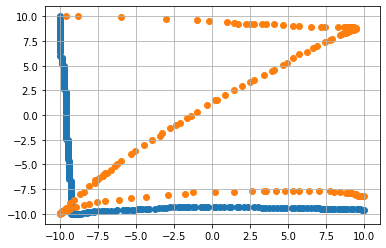

Coeff of l0 :  289.13059030332465
Coeff of Z0_test :  165.25315292561243
Coeff of l1 :  1409.1669271638855
Coeff of Z1_test :  1145.1837448016436
Coeff of l2 :  -2071.0214744612304
Coeff of Z2_test :  -1023.0387527418625


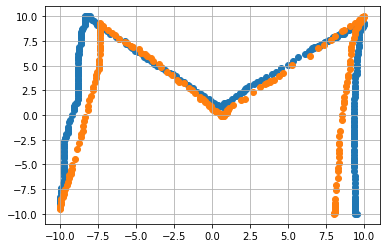

Coeff of M0 :  236.77440458918758
Coeff of M0_test :  214.10803634567756
Coeff of M1 :  1193.3292589621747
Coeff of M1_test :  1089.6741001583043
Coeff of M2 :  -677.7635951931245
Coeff of M2_test :  -629.8972346564841


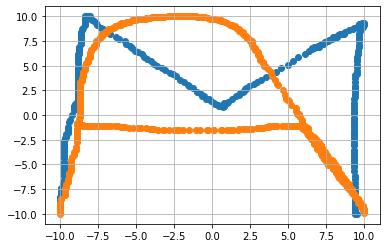

Coeff of M0 :  236.77440458918758
Coeff of A0_test :  295.75212444547986
Coeff of M1 :  1193.3292589621747
Coeff of A1_test :  1167.8748903146416
Coeff of M2 :  -677.7635951931245
Coeff of A2_test :  -833.8149325892592


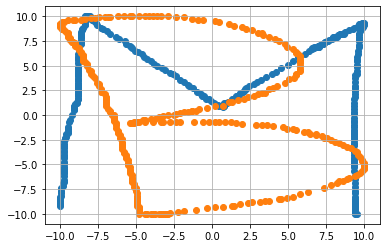

Coeff of M0 :  236.77440458918758
Coeff of B0_test :  259.0953261510756
Coeff of M1 :  1193.3292589621747
Coeff of B1_test :  1079.4803944623545
Coeff of M2 :  -677.7635951931245
Coeff of B2_test :  -967.0156291299161


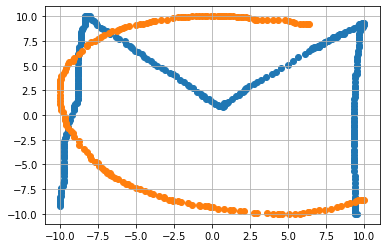

Coeff of M0 :  236.77440458918758
Coeff of C0_test :  303.33333558039624
Coeff of M1 :  1193.3292589621747
Coeff of C1_test :  1324.1760920437448
Coeff of M2 :  -677.7635951931245
Coeff of C2_test :  -1185.8005411694767


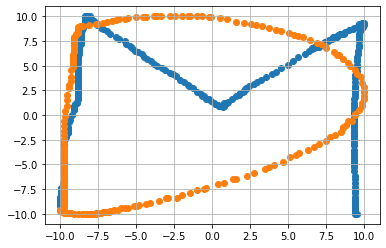

Coeff of M0 :  236.77440458918758
Coeff of D0_test :  258.43618154195667
Coeff of M1 :  1193.3292589621747
Coeff of D1_test :  1320.6773231749596
Coeff of M2 :  -677.7635951931245
Coeff of D2_test :  -1422.3196127785307


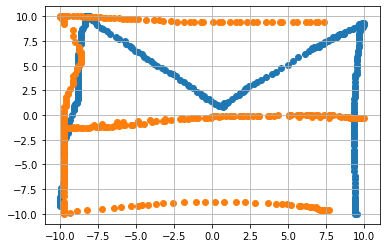

Coeff of M0 :  236.77440458918758
Coeff of E0_test :  265.84587396695025
Coeff of M1 :  1193.3292589621747
Coeff of E1_test :  1153.4052496110676
Coeff of M2 :  -677.7635951931245
Coeff of E2_test :  -1169.2190472063774


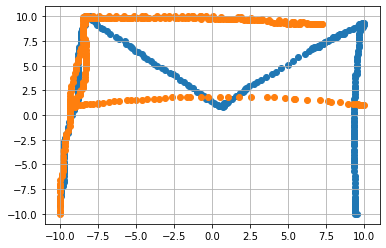

Coeff of M0 :  236.77440458918758
Coeff of F0_test :  303.2106574863934
Coeff of M1 :  1193.3292589621747
Coeff of F1_test :  1311.714510611808
Coeff of M2 :  -677.7635951931245
Coeff of F2_test :  -905.8068476262688


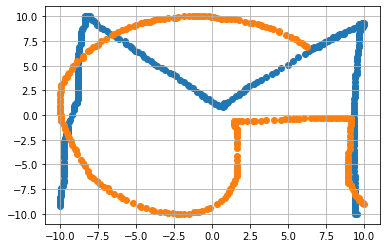

Coeff of M0 :  236.77440458918758
Coeff of G0_test :  287.81806338658964
Coeff of M1 :  1193.3292589621747
Coeff of G1_test :  1184.13016369023
Coeff of M2 :  -677.7635951931245
Coeff of G2_test :  -889.6157584280653


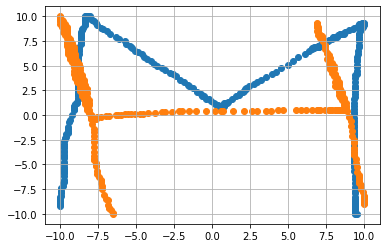

Coeff of M0 :  236.77440458918758
Coeff of H0_test :  274.7281613651508
Coeff of M1 :  1193.3292589621747
Coeff of H1_test :  1207.5890377110502
Coeff of M2 :  -677.7635951931245
Coeff of H2_test :  -835.9788200672382


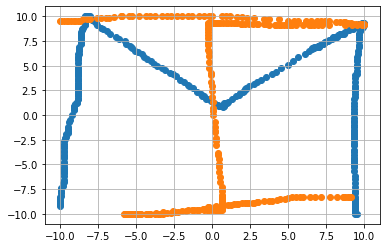

Coeff of M0 :  236.77440458918758
Coeff of I0_test :  270.69151720540685
Coeff of M1 :  1193.3292589621747
Coeff of I1_test :  1241.1484099097927
Coeff of M2 :  -677.7635951931245
Coeff of I2_test :  -812.2991068471923


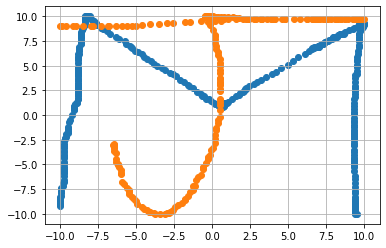

Coeff of M0 :  236.77440458918758
Coeff of J0_test :  221.45118729813638
Coeff of M1 :  1193.3292589621747
Coeff of J1_test :  1126.8306481468614
Coeff of M2 :  -677.7635951931245
Coeff of J2_test :  -566.7243542000019


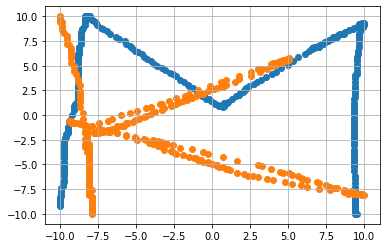

Coeff of M0 :  236.77440458918758
Coeff of K0_test :  225.27417960061194
Coeff of M1 :  1193.3292589621747
Coeff of K1_test :  1019.6317748186923
Coeff of M2 :  -677.7635951931245
Coeff of K2_test :  -1304.4310580413776


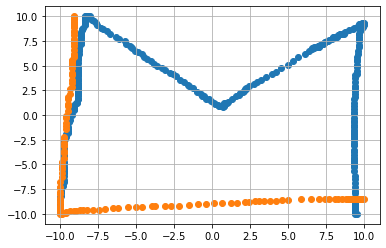

Coeff of M0 :  236.77440458918758
Coeff of l0_test :  285.9043978519215
Coeff of M1 :  1193.3292589621747
Coeff of l1_test :  1422.5570081418418
Coeff of M2 :  -677.7635951931245
Coeff of l2_test :  -2018.5060264647684


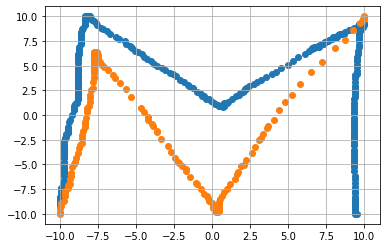

Coeff of M0 :  236.77440458918758
Coeff of N0_test :  243.10505698081576
Coeff of M1 :  1193.3292589621747
Coeff of N1_test :  1105.8386136599713
Coeff of M2 :  -677.7635951931245
Coeff of N2_test :  -1310.925127662746


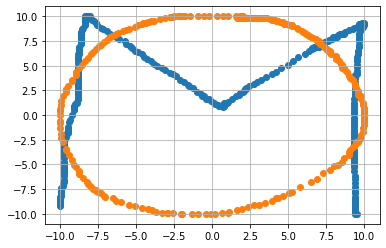

Coeff of M0 :  236.77440458918758
Coeff of O0_test :  269.7623165120487
Coeff of M1 :  1193.3292589621747
Coeff of O1_test :  1282.249724789818
Coeff of M2 :  -677.7635951931245
Coeff of O2_test :  -717.4726016993875


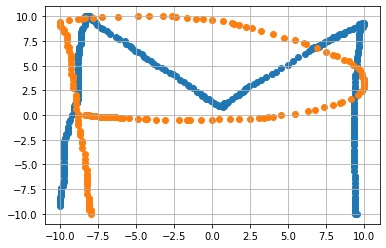

Coeff of M0 :  236.77440458918758
Coeff of P0_test :  253.9459355754082
Coeff of M1 :  1193.3292589621747
Coeff of P1_test :  1164.824965942085
Coeff of M2 :  -677.7635951931245
Coeff of P2_test :  -989.6196113536425


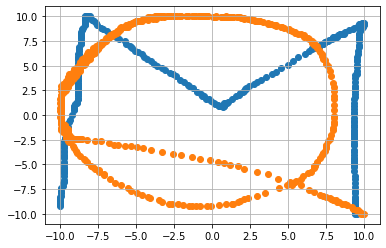

Coeff of M0 :  236.77440458918758
Coeff of Q0_test :  305.04450712852395
Coeff of M1 :  1193.3292589621747
Coeff of Q1_test :  1276.4719466447903
Coeff of M2 :  -677.7635951931245
Coeff of Q2_test :  -995.8869849547273


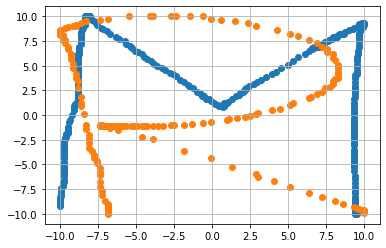

Coeff of M0 :  236.77440458918758
Coeff of R0_test :  254.8594941303752
Coeff of M1 :  1193.3292589621747
Coeff of R1_test :  1124.5862399648388
Coeff of M2 :  -677.7635951931245
Coeff of R2_test :  -992.1013853714055


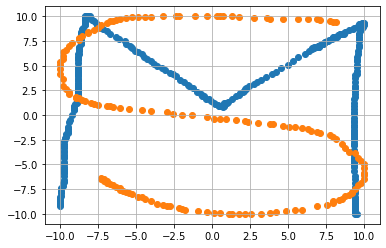

Coeff of M0 :  236.77440458918758
Coeff of S0_test :  290.8544314933228
Coeff of M1 :  1193.3292589621747
Coeff of S1_test :  1226.8256899731539
Coeff of M2 :  -677.7635951931245
Coeff of S2_test :  -1063.3894728687897


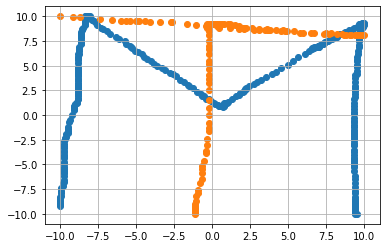

Coeff of M0 :  236.77440458918758
Coeff of T0_test :  236.43423922900277
Coeff of M1 :  1193.3292589621747
Coeff of T1_test :  1121.3978887350374
Coeff of M2 :  -677.7635951931245
Coeff of T2_test :  -220.72383321871104


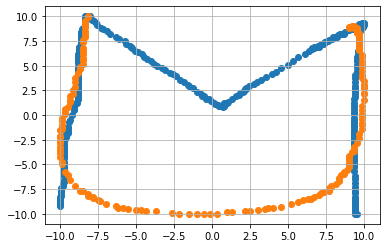

Coeff of M0 :  236.77440458918758
Coeff of U0_test :  275.3156630172093
Coeff of M1 :  1193.3292589621747
Coeff of U1_test :  1361.5579794263167
Coeff of M2 :  -677.7635951931245
Coeff of U2_test :  -1039.933347800673


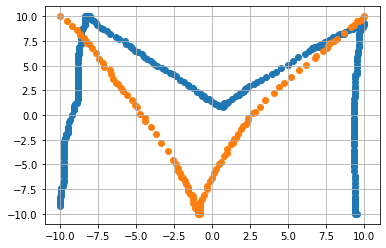

Coeff of M0 :  236.77440458918758
Coeff of V0_test :  225.07537052980817
Coeff of M1 :  1193.3292589621747
Coeff of V1_test :  993.1652737688586
Coeff of M2 :  -677.7635951931245
Coeff of V2_test :  -888.3002255901538


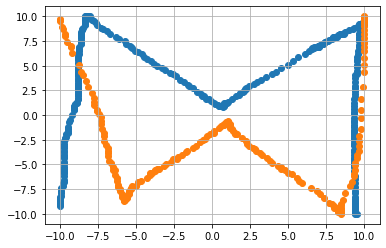

Coeff of M0 :  236.77440458918758
Coeff of W0_test :  236.11100211897917
Coeff of M1 :  1193.3292589621747
Coeff of W1_test :  1076.9716438337794
Coeff of M2 :  -677.7635951931245
Coeff of W2_test :  -1028.1655377026354


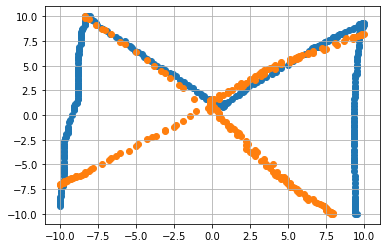

Coeff of M0 :  236.77440458918758
Coeff of X0_test :  202.9950320276672
Coeff of M1 :  1193.3292589621747
Coeff of X1_test :  921.5927592848752
Coeff of M2 :  -677.7635951931245
Coeff of X2_test :  -664.5155167433047


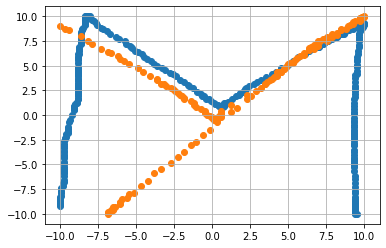

Coeff of M0 :  236.77440458918758
Coeff of Y0_test :  120.89855183715876
Coeff of M1 :  1193.3292589621747
Coeff of Y1_test :  827.7485841209242
Coeff of M2 :  -677.7635951931245
Coeff of Y2_test :  -358.7235004998596


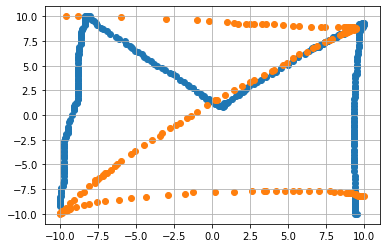

Coeff of M0 :  236.77440458918758
Coeff of Z0_test :  165.25315292561243
Coeff of M1 :  1193.3292589621747
Coeff of Z1_test :  1145.1837448016436
Coeff of M2 :  -677.7635951931245
Coeff of Z2_test :  -1023.0387527418625


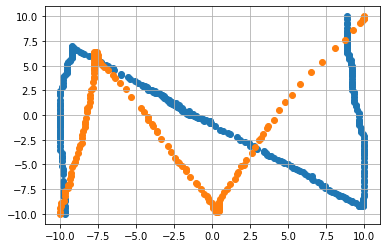

Coeff of N0 :  269.8758324816396
Coeff of N0_test :  243.10505698081576
Coeff of N1 :  1123.771300945998
Coeff of N1_test :  1105.8386136599713
Coeff of N2 :  -859.0202674104008
Coeff of N2_test :  -1310.925127662746


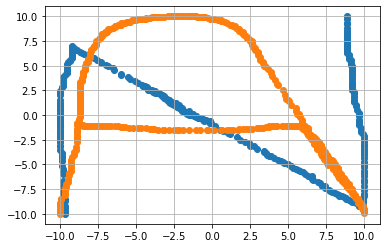

Coeff of N0 :  269.8758324816396
Coeff of A0_test :  295.75212444547986
Coeff of N1 :  1123.771300945998
Coeff of A1_test :  1167.8748903146416
Coeff of N2 :  -859.0202674104008
Coeff of A2_test :  -833.8149325892592


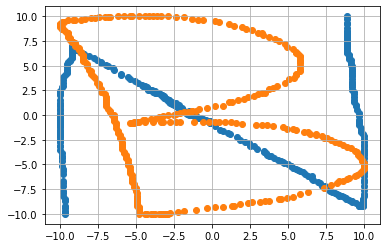

Coeff of N0 :  269.8758324816396
Coeff of B0_test :  259.0953261510756
Coeff of N1 :  1123.771300945998
Coeff of B1_test :  1079.4803944623545
Coeff of N2 :  -859.0202674104008
Coeff of B2_test :  -967.0156291299161


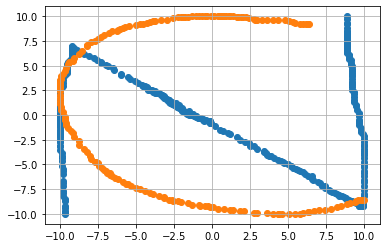

Coeff of N0 :  269.8758324816396
Coeff of C0_test :  303.33333558039624
Coeff of N1 :  1123.771300945998
Coeff of C1_test :  1324.1760920437448
Coeff of N2 :  -859.0202674104008
Coeff of C2_test :  -1185.8005411694767


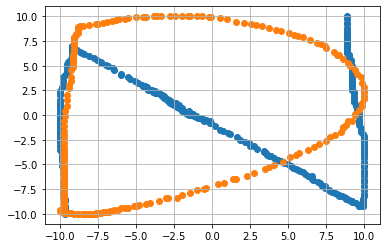

Coeff of N0 :  269.8758324816396
Coeff of D0_test :  258.43618154195667
Coeff of N1 :  1123.771300945998
Coeff of D1_test :  1320.6773231749596
Coeff of N2 :  -859.0202674104008
Coeff of D2_test :  -1422.3196127785307


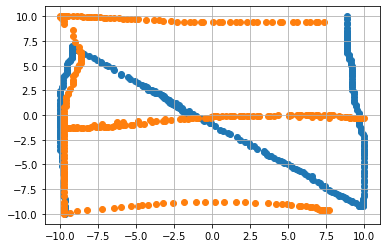

Coeff of N0 :  269.8758324816396
Coeff of E0_test :  265.84587396695025
Coeff of N1 :  1123.771300945998
Coeff of E1_test :  1153.4052496110676
Coeff of N2 :  -859.0202674104008
Coeff of E2_test :  -1169.2190472063774


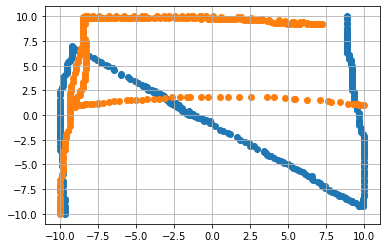

Coeff of N0 :  269.8758324816396
Coeff of F0_test :  303.2106574863934
Coeff of N1 :  1123.771300945998
Coeff of F1_test :  1311.714510611808
Coeff of N2 :  -859.0202674104008
Coeff of F2_test :  -905.8068476262688


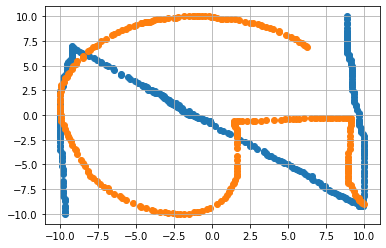

Coeff of N0 :  269.8758324816396
Coeff of G0_test :  287.81806338658964
Coeff of N1 :  1123.771300945998
Coeff of G1_test :  1184.13016369023
Coeff of N2 :  -859.0202674104008
Coeff of G2_test :  -889.6157584280653


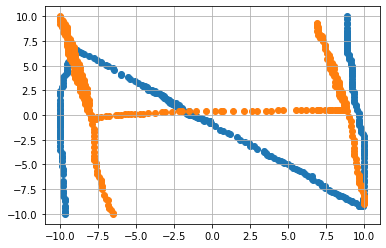

Coeff of N0 :  269.8758324816396
Coeff of H0_test :  274.7281613651508
Coeff of N1 :  1123.771300945998
Coeff of H1_test :  1207.5890377110502
Coeff of N2 :  -859.0202674104008
Coeff of H2_test :  -835.9788200672382


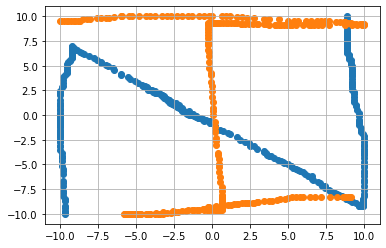

Coeff of N0 :  269.8758324816396
Coeff of I0_test :  270.69151720540685
Coeff of N1 :  1123.771300945998
Coeff of I1_test :  1241.1484099097927
Coeff of N2 :  -859.0202674104008
Coeff of I2_test :  -812.2991068471923


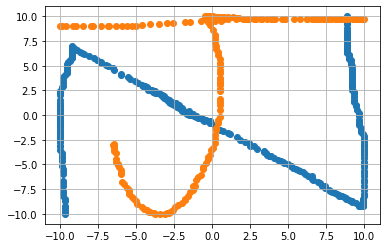

Coeff of N0 :  269.8758324816396
Coeff of J0_test :  221.45118729813638
Coeff of N1 :  1123.771300945998
Coeff of J1_test :  1126.8306481468614
Coeff of N2 :  -859.0202674104008
Coeff of J2_test :  -566.7243542000019


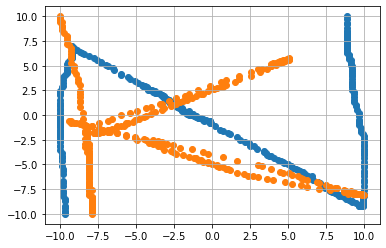

Coeff of N0 :  269.8758324816396
Coeff of K0_test :  225.27417960061194
Coeff of N1 :  1123.771300945998
Coeff of K1_test :  1019.6317748186923
Coeff of N2 :  -859.0202674104008
Coeff of K2_test :  -1304.4310580413776


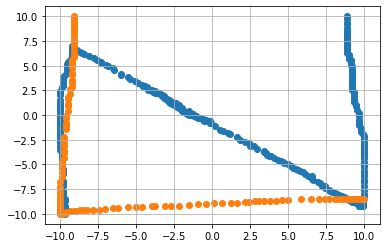

Coeff of N0 :  269.8758324816396
Coeff of l0_test :  285.9043978519215
Coeff of N1 :  1123.771300945998
Coeff of l1_test :  1422.5570081418418
Coeff of N2 :  -859.0202674104008
Coeff of l2_test :  -2018.5060264647684


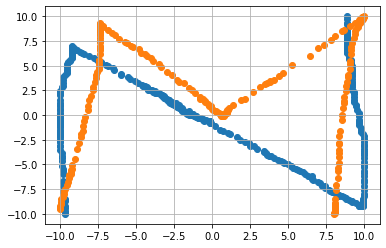

Coeff of N0 :  269.8758324816396
Coeff of M0_test :  214.10803634567756
Coeff of N1 :  1123.771300945998
Coeff of M1_test :  1089.6741001583043
Coeff of N2 :  -859.0202674104008
Coeff of M2_test :  -629.8972346564841


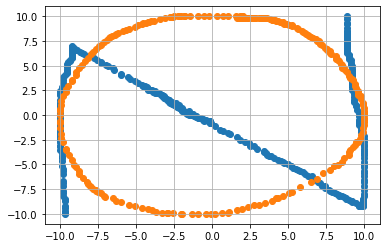

Coeff of N0 :  269.8758324816396
Coeff of O0_test :  269.7623165120487
Coeff of N1 :  1123.771300945998
Coeff of O1_test :  1282.249724789818
Coeff of N2 :  -859.0202674104008
Coeff of O2_test :  -717.4726016993875


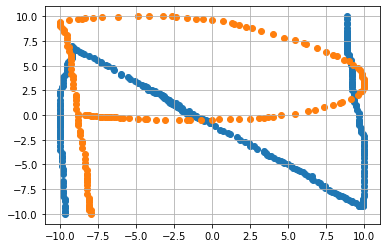

Coeff of N0 :  269.8758324816396
Coeff of P0_test :  253.9459355754082
Coeff of N1 :  1123.771300945998
Coeff of P1_test :  1164.824965942085
Coeff of N2 :  -859.0202674104008
Coeff of P2_test :  -989.6196113536425


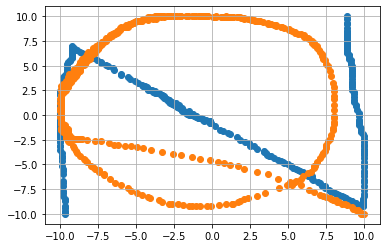

Coeff of N0 :  269.8758324816396
Coeff of Q0_test :  305.04450712852395
Coeff of N1 :  1123.771300945998
Coeff of Q1_test :  1276.4719466447903
Coeff of N2 :  -859.0202674104008
Coeff of Q2_test :  -995.8869849547273


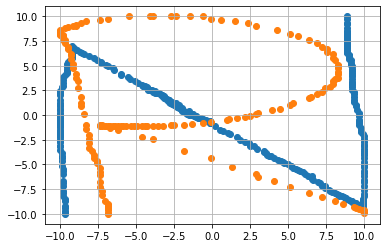

Coeff of N0 :  269.8758324816396
Coeff of R0_test :  254.8594941303752
Coeff of N1 :  1123.771300945998
Coeff of R1_test :  1124.5862399648388
Coeff of N2 :  -859.0202674104008
Coeff of R2_test :  -992.1013853714055


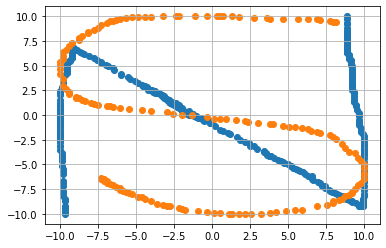

Coeff of N0 :  269.8758324816396
Coeff of S0_test :  290.8544314933228
Coeff of N1 :  1123.771300945998
Coeff of S1_test :  1226.8256899731539
Coeff of N2 :  -859.0202674104008
Coeff of S2_test :  -1063.3894728687897


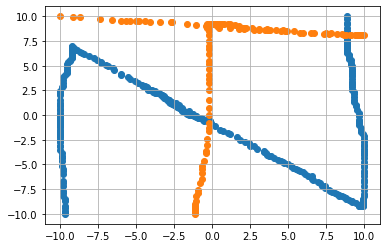

Coeff of N0 :  269.8758324816396
Coeff of T0_test :  236.43423922900277
Coeff of N1 :  1123.771300945998
Coeff of T1_test :  1121.3978887350374
Coeff of N2 :  -859.0202674104008
Coeff of T2_test :  -220.72383321871104


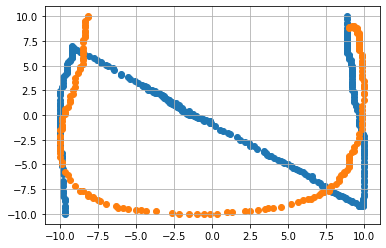

Coeff of N0 :  269.8758324816396
Coeff of U0_test :  275.3156630172093
Coeff of N1 :  1123.771300945998
Coeff of U1_test :  1361.5579794263167
Coeff of N2 :  -859.0202674104008
Coeff of U2_test :  -1039.933347800673


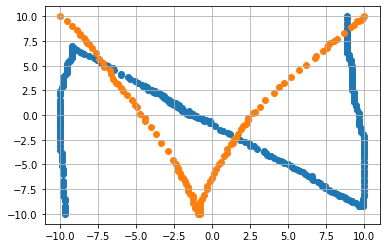

Coeff of N0 :  269.8758324816396
Coeff of V0_test :  225.07537052980817
Coeff of N1 :  1123.771300945998
Coeff of V1_test :  993.1652737688586
Coeff of N2 :  -859.0202674104008
Coeff of V2_test :  -888.3002255901538


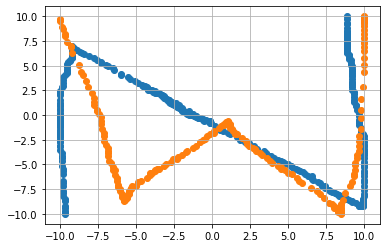

Coeff of N0 :  269.8758324816396
Coeff of W0_test :  236.11100211897917
Coeff of N1 :  1123.771300945998
Coeff of W1_test :  1076.9716438337794
Coeff of N2 :  -859.0202674104008
Coeff of W2_test :  -1028.1655377026354


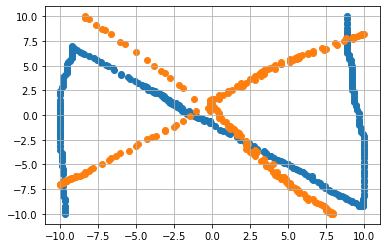

Coeff of N0 :  269.8758324816396
Coeff of X0_test :  202.9950320276672
Coeff of N1 :  1123.771300945998
Coeff of X1_test :  921.5927592848752
Coeff of N2 :  -859.0202674104008
Coeff of X2_test :  -664.5155167433047


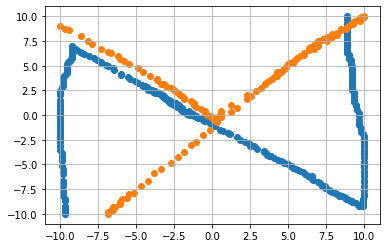

Coeff of N0 :  269.8758324816396
Coeff of Y0_test :  120.89855183715876
Coeff of N1 :  1123.771300945998
Coeff of Y1_test :  827.7485841209242
Coeff of N2 :  -859.0202674104008
Coeff of Y2_test :  -358.7235004998596


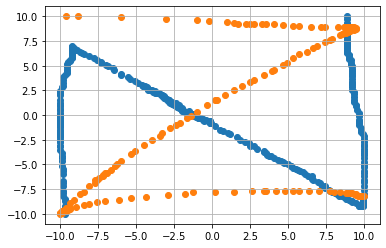

Coeff of N0 :  269.8758324816396
Coeff of Z0_test :  165.25315292561243
Coeff of N1 :  1123.771300945998
Coeff of Z1_test :  1145.1837448016436
Coeff of N2 :  -859.0202674104008
Coeff of Z2_test :  -1023.0387527418625


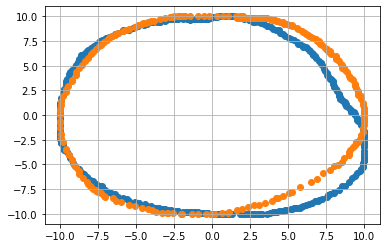

Coeff of O0 :  294.0629834617759
Coeff of O0_test :  269.7623165120487
Coeff of O1 :  1297.254546916237
Coeff of O1_test :  1282.249724789818
Coeff of O2 :  -956.8089272264216
Coeff of O2_test :  -717.4726016993875


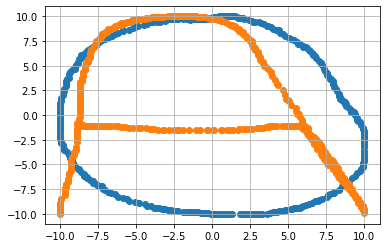

Coeff of O0 :  294.0629834617759
Coeff of A0_test :  295.75212444547986
Coeff of O1 :  1297.254546916237
Coeff of A1_test :  1167.8748903146416
Coeff of O2 :  -956.8089272264216
Coeff of A2_test :  -833.8149325892592


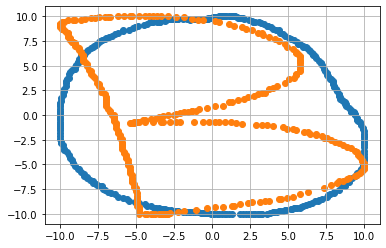

Coeff of O0 :  294.0629834617759
Coeff of B0_test :  259.0953261510756
Coeff of O1 :  1297.254546916237
Coeff of B1_test :  1079.4803944623545
Coeff of O2 :  -956.8089272264216
Coeff of B2_test :  -967.0156291299161


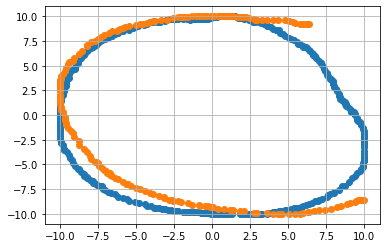

Coeff of O0 :  294.0629834617759
Coeff of C0_test :  303.33333558039624
Coeff of O1 :  1297.254546916237
Coeff of C1_test :  1324.1760920437448
Coeff of O2 :  -956.8089272264216
Coeff of C2_test :  -1185.8005411694767


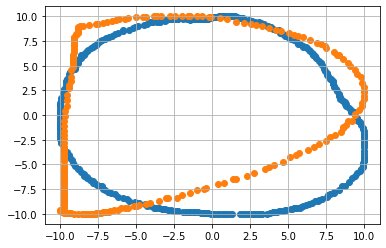

Coeff of O0 :  294.0629834617759
Coeff of D0_test :  258.43618154195667
Coeff of O1 :  1297.254546916237
Coeff of D1_test :  1320.6773231749596
Coeff of O2 :  -956.8089272264216
Coeff of D2_test :  -1422.3196127785307


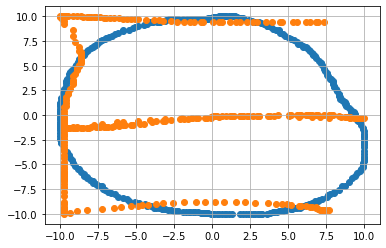

Coeff of O0 :  294.0629834617759
Coeff of E0_test :  265.84587396695025
Coeff of O1 :  1297.254546916237
Coeff of E1_test :  1153.4052496110676
Coeff of O2 :  -956.8089272264216
Coeff of E2_test :  -1169.2190472063774


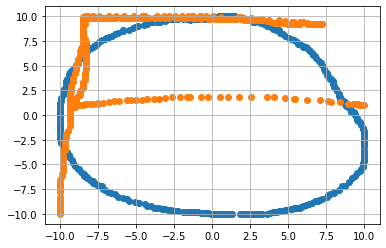

Coeff of O0 :  294.0629834617759
Coeff of F0_test :  303.2106574863934
Coeff of O1 :  1297.254546916237
Coeff of F1_test :  1311.714510611808
Coeff of O2 :  -956.8089272264216
Coeff of F2_test :  -905.8068476262688


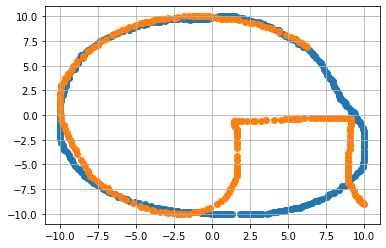

Coeff of O0 :  294.0629834617759
Coeff of G0_test :  287.81806338658964
Coeff of O1 :  1297.254546916237
Coeff of G1_test :  1184.13016369023
Coeff of O2 :  -956.8089272264216
Coeff of G2_test :  -889.6157584280653


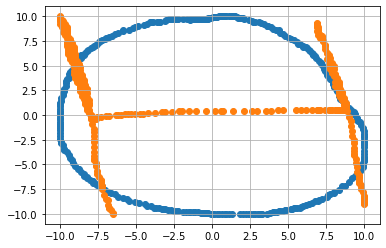

Coeff of O0 :  294.0629834617759
Coeff of H0_test :  274.7281613651508
Coeff of O1 :  1297.254546916237
Coeff of H1_test :  1207.5890377110502
Coeff of O2 :  -956.8089272264216
Coeff of H2_test :  -835.9788200672382


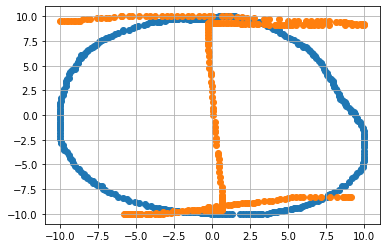

Coeff of O0 :  294.0629834617759
Coeff of I0_test :  270.69151720540685
Coeff of O1 :  1297.254546916237
Coeff of I1_test :  1241.1484099097927
Coeff of O2 :  -956.8089272264216
Coeff of I2_test :  -812.2991068471923


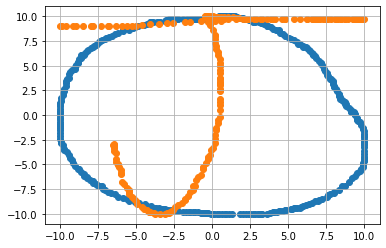

Coeff of O0 :  294.0629834617759
Coeff of J0_test :  221.45118729813638
Coeff of O1 :  1297.254546916237
Coeff of J1_test :  1126.8306481468614
Coeff of O2 :  -956.8089272264216
Coeff of J2_test :  -566.7243542000019


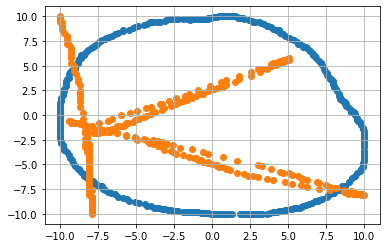

Coeff of O0 :  294.0629834617759
Coeff of K0_test :  225.27417960061194
Coeff of O1 :  1297.254546916237
Coeff of K1_test :  1019.6317748186923
Coeff of O2 :  -956.8089272264216
Coeff of K2_test :  -1304.4310580413776


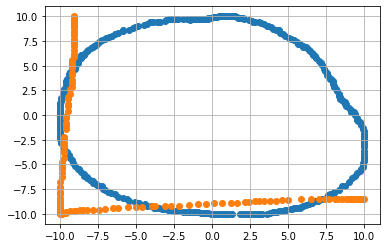

Coeff of O0 :  294.0629834617759
Coeff of l0_test :  285.9043978519215
Coeff of O1 :  1297.254546916237
Coeff of l1_test :  1422.5570081418418
Coeff of O2 :  -956.8089272264216
Coeff of l2_test :  -2018.5060264647684


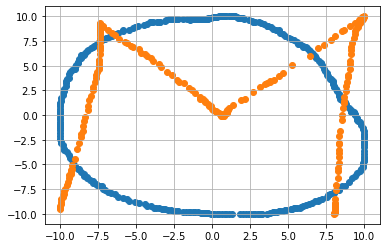

Coeff of O0 :  294.0629834617759
Coeff of M0_test :  214.10803634567756
Coeff of O1 :  1297.254546916237
Coeff of M1_test :  1089.6741001583043
Coeff of O2 :  -956.8089272264216
Coeff of M2_test :  -629.8972346564841


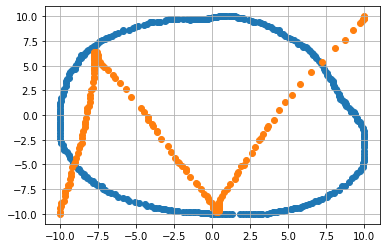

Coeff of O0 :  294.0629834617759
Coeff of N0_test :  243.10505698081576
Coeff of O1 :  1297.254546916237
Coeff of N1_test :  1105.8386136599713
Coeff of O2 :  -956.8089272264216
Coeff of N2_test :  -1310.925127662746


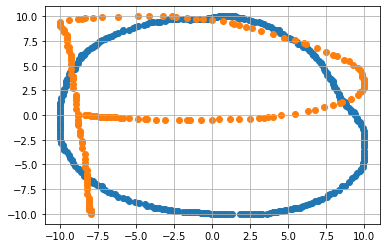

Coeff of O0 :  294.0629834617759
Coeff of P0_test :  253.9459355754082
Coeff of O1 :  1297.254546916237
Coeff of P1_test :  1164.824965942085
Coeff of O2 :  -956.8089272264216
Coeff of P2_test :  -989.6196113536425


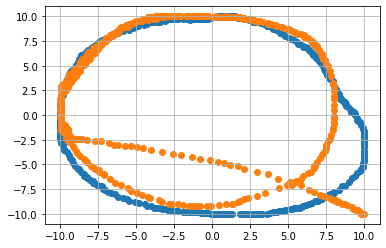

Coeff of O0 :  294.0629834617759
Coeff of Q0_test :  305.04450712852395
Coeff of O1 :  1297.254546916237
Coeff of Q1_test :  1276.4719466447903
Coeff of O2 :  -956.8089272264216
Coeff of Q2_test :  -995.8869849547273


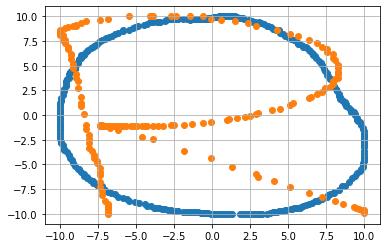

Coeff of O0 :  294.0629834617759
Coeff of R0_test :  254.8594941303752
Coeff of O1 :  1297.254546916237
Coeff of R1_test :  1124.5862399648388
Coeff of O2 :  -956.8089272264216
Coeff of R2_test :  -992.1013853714055


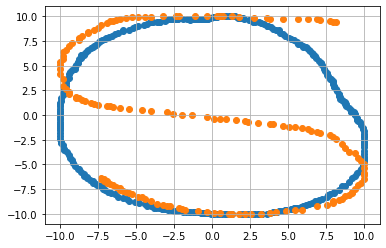

Coeff of O0 :  294.0629834617759
Coeff of S0_test :  290.8544314933228
Coeff of O1 :  1297.254546916237
Coeff of S1_test :  1226.8256899731539
Coeff of O2 :  -956.8089272264216
Coeff of S2_test :  -1063.3894728687897


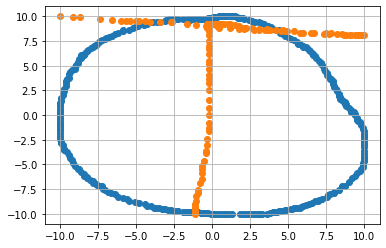

Coeff of O0 :  294.0629834617759
Coeff of T0_test :  236.43423922900277
Coeff of O1 :  1297.254546916237
Coeff of T1_test :  1121.3978887350374
Coeff of O2 :  -956.8089272264216
Coeff of T2_test :  -220.72383321871104


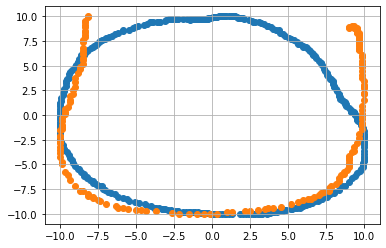

Coeff of O0 :  294.0629834617759
Coeff of U0_test :  275.3156630172093
Coeff of O1 :  1297.254546916237
Coeff of U1_test :  1361.5579794263167
Coeff of O2 :  -956.8089272264216
Coeff of U2_test :  -1039.933347800673


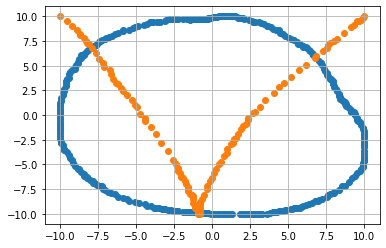

Coeff of O0 :  294.0629834617759
Coeff of V0_test :  225.07537052980817
Coeff of O1 :  1297.254546916237
Coeff of V1_test :  993.1652737688586
Coeff of O2 :  -956.8089272264216
Coeff of V2_test :  -888.3002255901538


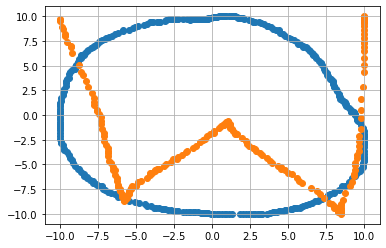

Coeff of O0 :  294.0629834617759
Coeff of W0_test :  236.11100211897917
Coeff of O1 :  1297.254546916237
Coeff of W1_test :  1076.9716438337794
Coeff of O2 :  -956.8089272264216
Coeff of W2_test :  -1028.1655377026354


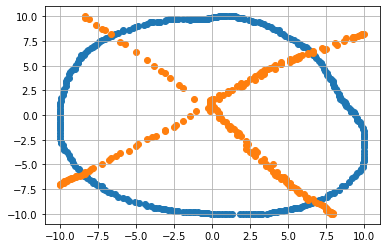

Coeff of O0 :  294.0629834617759
Coeff of X0_test :  202.9950320276672
Coeff of O1 :  1297.254546916237
Coeff of X1_test :  921.5927592848752
Coeff of O2 :  -956.8089272264216
Coeff of X2_test :  -664.5155167433047


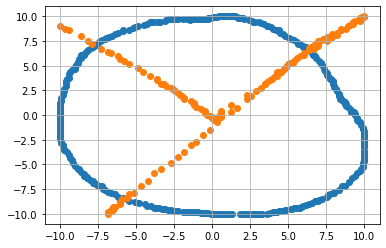

Coeff of O0 :  294.0629834617759
Coeff of Y0_test :  120.89855183715876
Coeff of O1 :  1297.254546916237
Coeff of Y1_test :  827.7485841209242
Coeff of O2 :  -956.8089272264216
Coeff of Y2_test :  -358.7235004998596


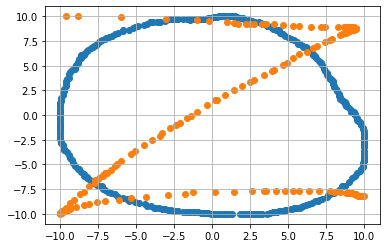

Coeff of O0 :  294.0629834617759
Coeff of Z0_test :  165.25315292561243
Coeff of O1 :  1297.254546916237
Coeff of Z1_test :  1145.1837448016436
Coeff of O2 :  -956.8089272264216
Coeff of Z2_test :  -1023.0387527418625


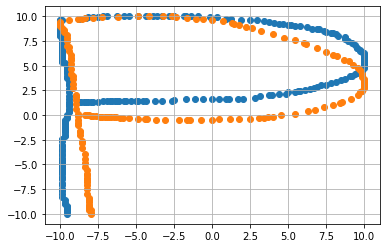

Coeff of P0 :  264.5328075510204
Coeff of P0_test :  253.9459355754082
Coeff of P1 :  1265.17628379536
Coeff of P1_test :  1164.824965942085
Coeff of P2 :  -1030.9707376602219
Coeff of P2_test :  -989.6196113536425


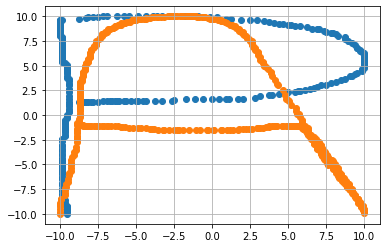

Coeff of P0 :  264.5328075510204
Coeff of A0_test :  295.75212444547986
Coeff of P1 :  1265.17628379536
Coeff of A1_test :  1167.8748903146416
Coeff of P2 :  -1030.9707376602219
Coeff of A2_test :  -833.8149325892592


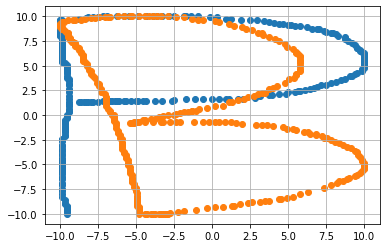

Coeff of P0 :  264.5328075510204
Coeff of B0_test :  259.0953261510756
Coeff of P1 :  1265.17628379536
Coeff of B1_test :  1079.4803944623545
Coeff of P2 :  -1030.9707376602219
Coeff of B2_test :  -967.0156291299161


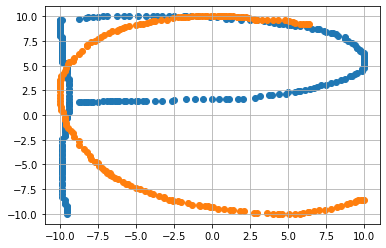

Coeff of P0 :  264.5328075510204
Coeff of C0_test :  303.33333558039624
Coeff of P1 :  1265.17628379536
Coeff of C1_test :  1324.1760920437448
Coeff of P2 :  -1030.9707376602219
Coeff of C2_test :  -1185.8005411694767


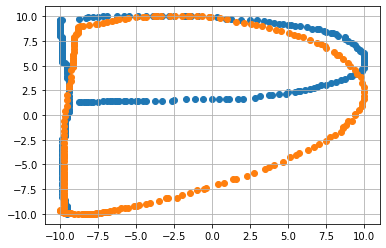

Coeff of P0 :  264.5328075510204
Coeff of D0_test :  258.43618154195667
Coeff of P1 :  1265.17628379536
Coeff of D1_test :  1320.6773231749596
Coeff of P2 :  -1030.9707376602219
Coeff of D2_test :  -1422.3196127785307


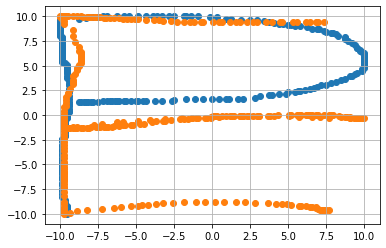

Coeff of P0 :  264.5328075510204
Coeff of E0_test :  265.84587396695025
Coeff of P1 :  1265.17628379536
Coeff of E1_test :  1153.4052496110676
Coeff of P2 :  -1030.9707376602219
Coeff of E2_test :  -1169.2190472063774


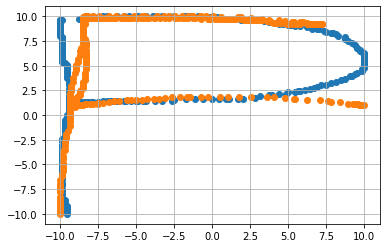

Coeff of P0 :  264.5328075510204
Coeff of F0_test :  303.2106574863934
Coeff of P1 :  1265.17628379536
Coeff of F1_test :  1311.714510611808
Coeff of P2 :  -1030.9707376602219
Coeff of F2_test :  -905.8068476262688


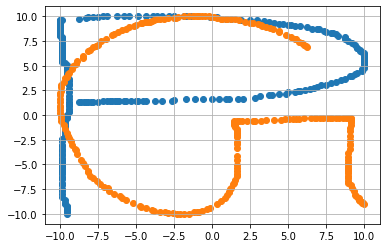

Coeff of P0 :  264.5328075510204
Coeff of G0_test :  287.81806338658964
Coeff of P1 :  1265.17628379536
Coeff of G1_test :  1184.13016369023
Coeff of P2 :  -1030.9707376602219
Coeff of G2_test :  -889.6157584280653


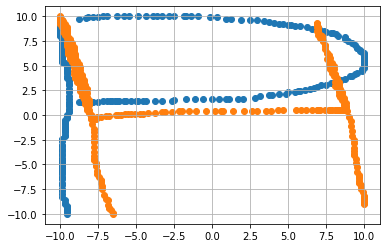

Coeff of P0 :  264.5328075510204
Coeff of H0_test :  274.7281613651508
Coeff of P1 :  1265.17628379536
Coeff of H1_test :  1207.5890377110502
Coeff of P2 :  -1030.9707376602219
Coeff of H2_test :  -835.9788200672382


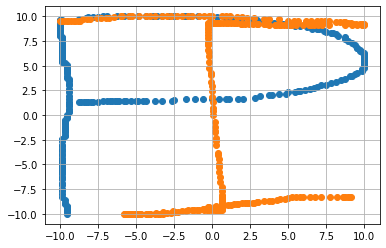

Coeff of P0 :  264.5328075510204
Coeff of I0_test :  270.69151720540685
Coeff of P1 :  1265.17628379536
Coeff of I1_test :  1241.1484099097927
Coeff of P2 :  -1030.9707376602219
Coeff of I2_test :  -812.2991068471923


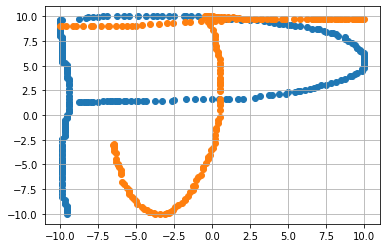

Coeff of P0 :  264.5328075510204
Coeff of J0_test :  221.45118729813638
Coeff of P1 :  1265.17628379536
Coeff of J1_test :  1126.8306481468614
Coeff of P2 :  -1030.9707376602219
Coeff of J2_test :  -566.7243542000019


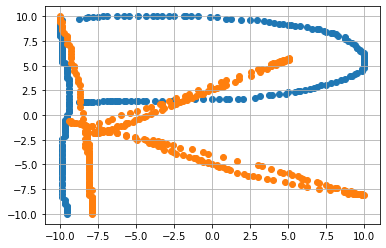

Coeff of P0 :  264.5328075510204
Coeff of K0_test :  225.27417960061194
Coeff of P1 :  1265.17628379536
Coeff of K1_test :  1019.6317748186923
Coeff of P2 :  -1030.9707376602219
Coeff of K2_test :  -1304.4310580413776


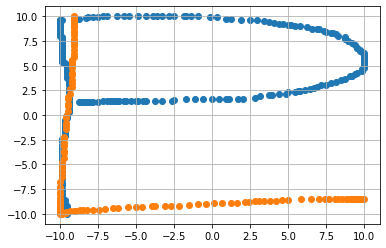

Coeff of P0 :  264.5328075510204
Coeff of l0_test :  285.9043978519215
Coeff of P1 :  1265.17628379536
Coeff of l1_test :  1422.5570081418418
Coeff of P2 :  -1030.9707376602219
Coeff of l2_test :  -2018.5060264647684


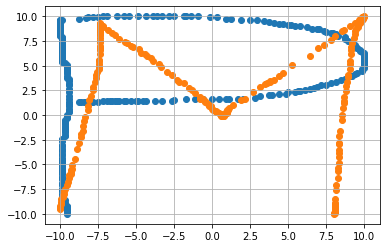

Coeff of P0 :  264.5328075510204
Coeff of M0_test :  214.10803634567756
Coeff of P1 :  1265.17628379536
Coeff of M1_test :  1089.6741001583043
Coeff of P2 :  -1030.9707376602219
Coeff of M2_test :  -629.8972346564841


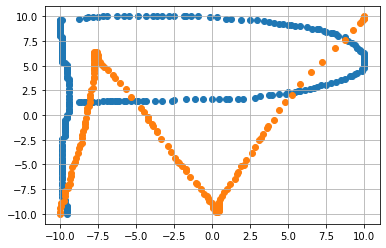

Coeff of P0 :  264.5328075510204
Coeff of N0_test :  243.10505698081576
Coeff of P1 :  1265.17628379536
Coeff of N1_test :  1105.8386136599713
Coeff of P2 :  -1030.9707376602219
Coeff of N2_test :  -1310.925127662746


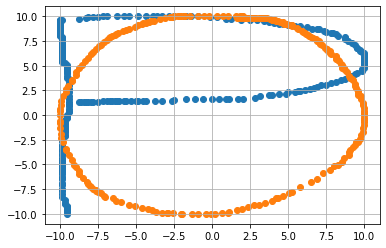

Coeff of P0 :  264.5328075510204
Coeff of O0_test :  269.7623165120487
Coeff of P1 :  1265.17628379536
Coeff of O1_test :  1282.249724789818
Coeff of P2 :  -1030.9707376602219
Coeff of O2_test :  -717.4726016993875


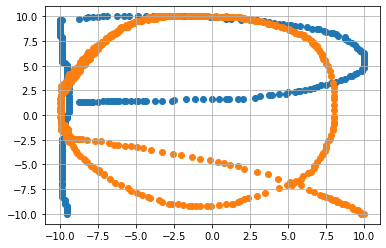

Coeff of P0 :  264.5328075510204
Coeff of Q0_test :  305.04450712852395
Coeff of P1 :  1265.17628379536
Coeff of Q1_test :  1276.4719466447903
Coeff of P2 :  -1030.9707376602219
Coeff of Q2_test :  -995.8869849547273


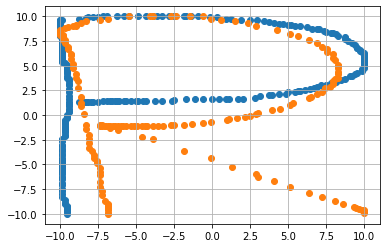

Coeff of P0 :  264.5328075510204
Coeff of R0_test :  254.8594941303752
Coeff of P1 :  1265.17628379536
Coeff of R1_test :  1124.5862399648388
Coeff of P2 :  -1030.9707376602219
Coeff of R2_test :  -992.1013853714055


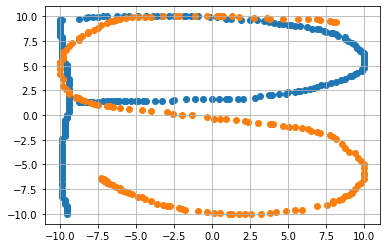

Coeff of P0 :  264.5328075510204
Coeff of S0_test :  290.8544314933228
Coeff of P1 :  1265.17628379536
Coeff of S1_test :  1226.8256899731539
Coeff of P2 :  -1030.9707376602219
Coeff of S2_test :  -1063.3894728687897


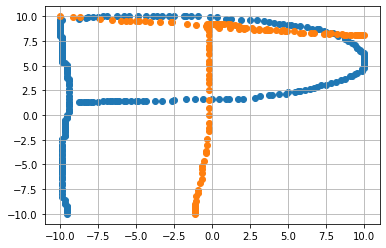

Coeff of P0 :  264.5328075510204
Coeff of T0_test :  236.43423922900277
Coeff of P1 :  1265.17628379536
Coeff of T1_test :  1121.3978887350374
Coeff of P2 :  -1030.9707376602219
Coeff of T2_test :  -220.72383321871104


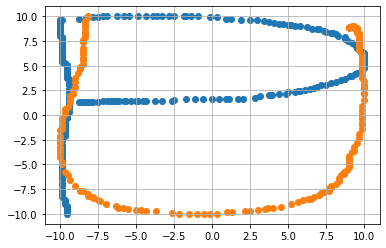

Coeff of P0 :  264.5328075510204
Coeff of U0_test :  275.3156630172093
Coeff of P1 :  1265.17628379536
Coeff of U1_test :  1361.5579794263167
Coeff of P2 :  -1030.9707376602219
Coeff of U2_test :  -1039.933347800673


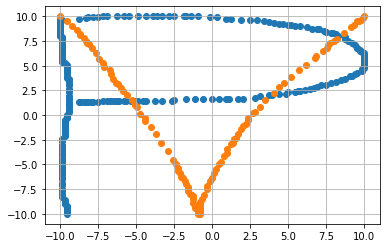

Coeff of P0 :  264.5328075510204
Coeff of V0_test :  225.07537052980817
Coeff of P1 :  1265.17628379536
Coeff of V1_test :  993.1652737688586
Coeff of P2 :  -1030.9707376602219
Coeff of V2_test :  -888.3002255901538


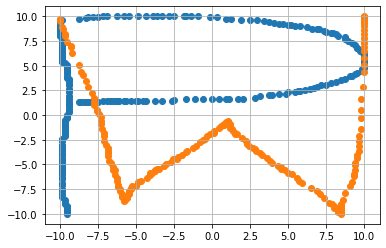

Coeff of P0 :  264.5328075510204
Coeff of W0_test :  236.11100211897917
Coeff of P1 :  1265.17628379536
Coeff of W1_test :  1076.9716438337794
Coeff of P2 :  -1030.9707376602219
Coeff of W2_test :  -1028.1655377026354


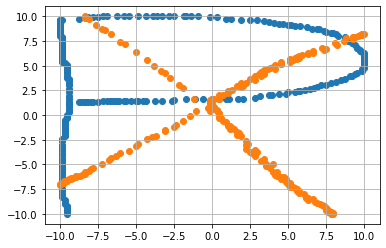

Coeff of P0 :  264.5328075510204
Coeff of X0_test :  202.9950320276672
Coeff of P1 :  1265.17628379536
Coeff of X1_test :  921.5927592848752
Coeff of P2 :  -1030.9707376602219
Coeff of X2_test :  -664.5155167433047


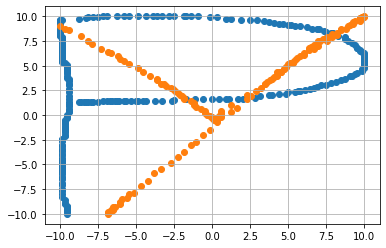

Coeff of P0 :  264.5328075510204
Coeff of Y0_test :  120.89855183715876
Coeff of P1 :  1265.17628379536
Coeff of Y1_test :  827.7485841209242
Coeff of P2 :  -1030.9707376602219
Coeff of Y2_test :  -358.7235004998596


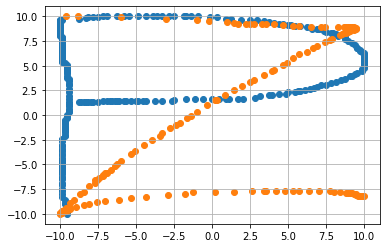

Coeff of P0 :  264.5328075510204
Coeff of Z0_test :  165.25315292561243
Coeff of P1 :  1265.17628379536
Coeff of Z1_test :  1145.1837448016436
Coeff of P2 :  -1030.9707376602219
Coeff of Z2_test :  -1023.0387527418625


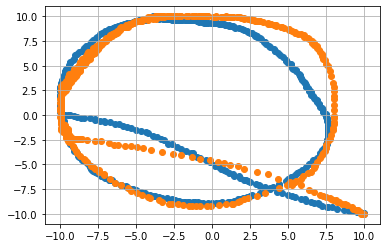

Coeff of Q0 :  283.0903055833546
Coeff of Q0_test :  305.04450712852395
Coeff of Q1 :  1175.2279278443325
Coeff of Q1_test :  1276.4719466447903
Coeff of Q2 :  -934.5763374902996
Coeff of Q2_test :  -995.8869849547273


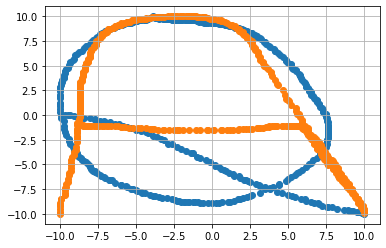

Coeff of Q0 :  283.0903055833546
Coeff of A0_test :  295.75212444547986
Coeff of Q1 :  1175.2279278443325
Coeff of A1_test :  1167.8748903146416
Coeff of Q2 :  -934.5763374902996
Coeff of A2_test :  -833.8149325892592


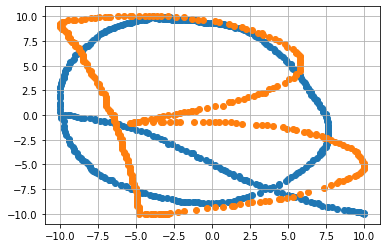

Coeff of Q0 :  283.0903055833546
Coeff of B0_test :  259.0953261510756
Coeff of Q1 :  1175.2279278443325
Coeff of B1_test :  1079.4803944623545
Coeff of Q2 :  -934.5763374902996
Coeff of B2_test :  -967.0156291299161


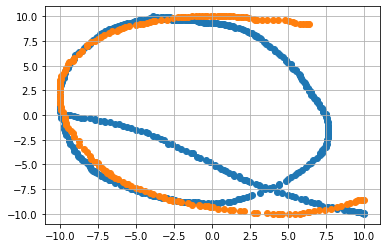

Coeff of Q0 :  283.0903055833546
Coeff of C0_test :  303.33333558039624
Coeff of Q1 :  1175.2279278443325
Coeff of C1_test :  1324.1760920437448
Coeff of Q2 :  -934.5763374902996
Coeff of C2_test :  -1185.8005411694767


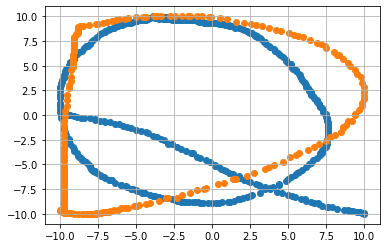

Coeff of Q0 :  283.0903055833546
Coeff of D0_test :  258.43618154195667
Coeff of Q1 :  1175.2279278443325
Coeff of D1_test :  1320.6773231749596
Coeff of Q2 :  -934.5763374902996
Coeff of D2_test :  -1422.3196127785307


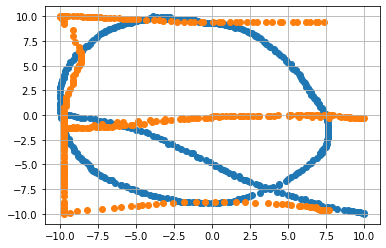

Coeff of Q0 :  283.0903055833546
Coeff of E0_test :  265.84587396695025
Coeff of Q1 :  1175.2279278443325
Coeff of E1_test :  1153.4052496110676
Coeff of Q2 :  -934.5763374902996
Coeff of E2_test :  -1169.2190472063774


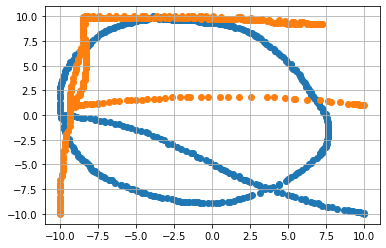

Coeff of Q0 :  283.0903055833546
Coeff of F0_test :  303.2106574863934
Coeff of Q1 :  1175.2279278443325
Coeff of F1_test :  1311.714510611808
Coeff of Q2 :  -934.5763374902996
Coeff of F2_test :  -905.8068476262688


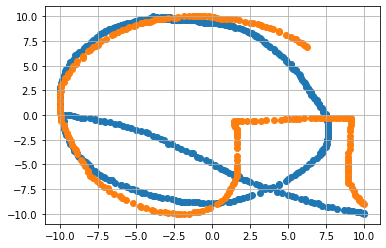

Coeff of Q0 :  283.0903055833546
Coeff of G0_test :  287.81806338658964
Coeff of Q1 :  1175.2279278443325
Coeff of G1_test :  1184.13016369023
Coeff of Q2 :  -934.5763374902996
Coeff of G2_test :  -889.6157584280653


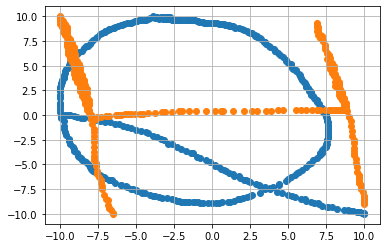

Coeff of Q0 :  283.0903055833546
Coeff of H0_test :  274.7281613651508
Coeff of Q1 :  1175.2279278443325
Coeff of H1_test :  1207.5890377110502
Coeff of Q2 :  -934.5763374902996
Coeff of H2_test :  -835.9788200672382


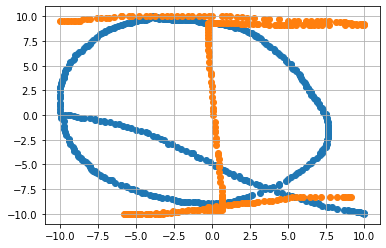

Coeff of Q0 :  283.0903055833546
Coeff of I0_test :  270.69151720540685
Coeff of Q1 :  1175.2279278443325
Coeff of I1_test :  1241.1484099097927
Coeff of Q2 :  -934.5763374902996
Coeff of I2_test :  -812.2991068471923


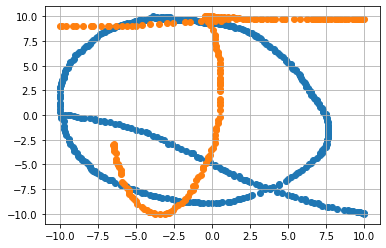

Coeff of Q0 :  283.0903055833546
Coeff of J0_test :  221.45118729813638
Coeff of Q1 :  1175.2279278443325
Coeff of J1_test :  1126.8306481468614
Coeff of Q2 :  -934.5763374902996
Coeff of J2_test :  -566.7243542000019


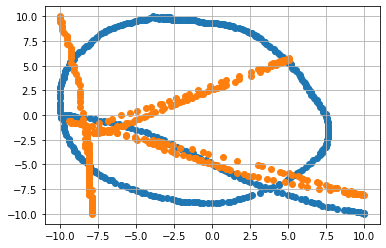

Coeff of Q0 :  283.0903055833546
Coeff of K0_test :  225.27417960061194
Coeff of Q1 :  1175.2279278443325
Coeff of K1_test :  1019.6317748186923
Coeff of Q2 :  -934.5763374902996
Coeff of K2_test :  -1304.4310580413776


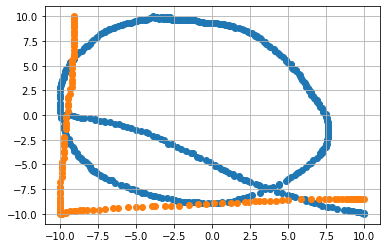

Coeff of Q0 :  283.0903055833546
Coeff of l0_test :  285.9043978519215
Coeff of Q1 :  1175.2279278443325
Coeff of l1_test :  1422.5570081418418
Coeff of Q2 :  -934.5763374902996
Coeff of l2_test :  -2018.5060264647684


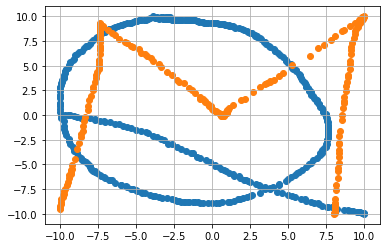

Coeff of Q0 :  283.0903055833546
Coeff of M0_test :  214.10803634567756
Coeff of Q1 :  1175.2279278443325
Coeff of M1_test :  1089.6741001583043
Coeff of Q2 :  -934.5763374902996
Coeff of M2_test :  -629.8972346564841


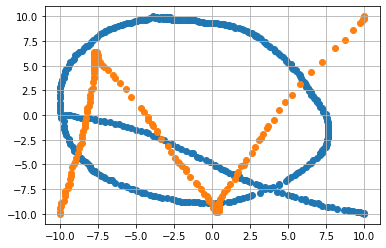

Coeff of Q0 :  283.0903055833546
Coeff of N0_test :  243.10505698081576
Coeff of Q1 :  1175.2279278443325
Coeff of N1_test :  1105.8386136599713
Coeff of Q2 :  -934.5763374902996
Coeff of N2_test :  -1310.925127662746


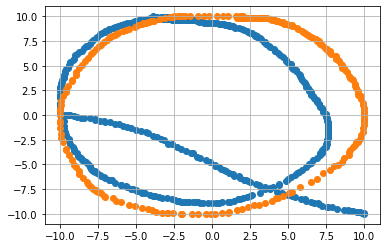

Coeff of Q0 :  283.0903055833546
Coeff of O0_test :  269.7623165120487
Coeff of Q1 :  1175.2279278443325
Coeff of O1_test :  1282.249724789818
Coeff of Q2 :  -934.5763374902996
Coeff of O2_test :  -717.4726016993875


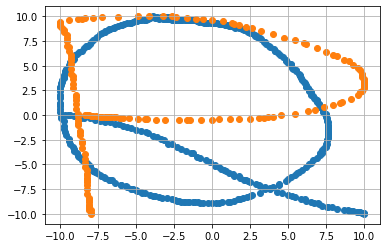

Coeff of Q0 :  283.0903055833546
Coeff of P0_test :  253.9459355754082
Coeff of Q1 :  1175.2279278443325
Coeff of P1_test :  1164.824965942085
Coeff of Q2 :  -934.5763374902996
Coeff of P2_test :  -989.6196113536425


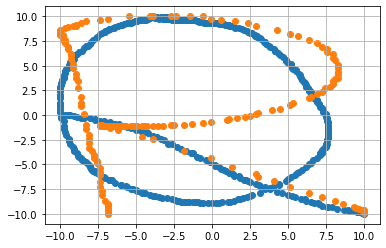

Coeff of Q0 :  283.0903055833546
Coeff of R0_test :  254.8594941303752
Coeff of Q1 :  1175.2279278443325
Coeff of R1_test :  1124.5862399648388
Coeff of Q2 :  -934.5763374902996
Coeff of R2_test :  -992.1013853714055


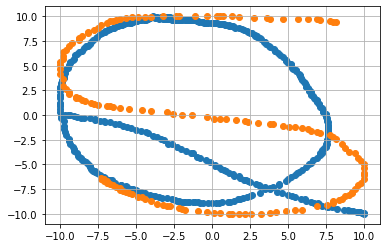

Coeff of Q0 :  283.0903055833546
Coeff of S0_test :  290.8544314933228
Coeff of Q1 :  1175.2279278443325
Coeff of S1_test :  1226.8256899731539
Coeff of Q2 :  -934.5763374902996
Coeff of S2_test :  -1063.3894728687897


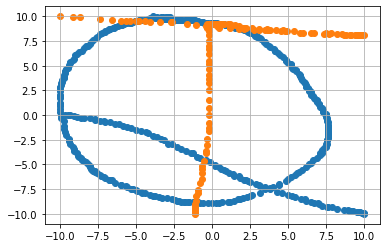

Coeff of Q0 :  283.0903055833546
Coeff of T0_test :  236.43423922900277
Coeff of Q1 :  1175.2279278443325
Coeff of T1_test :  1121.3978887350374
Coeff of Q2 :  -934.5763374902996
Coeff of T2_test :  -220.72383321871104


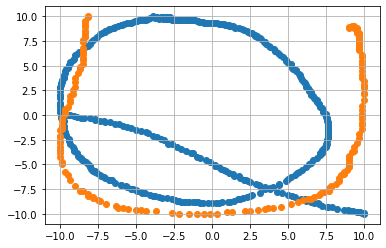

Coeff of Q0 :  283.0903055833546
Coeff of U0_test :  275.3156630172093
Coeff of Q1 :  1175.2279278443325
Coeff of U1_test :  1361.5579794263167
Coeff of Q2 :  -934.5763374902996
Coeff of U2_test :  -1039.933347800673


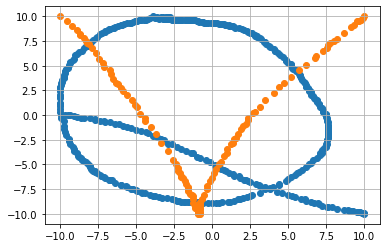

Coeff of Q0 :  283.0903055833546
Coeff of V0_test :  225.07537052980817
Coeff of Q1 :  1175.2279278443325
Coeff of V1_test :  993.1652737688586
Coeff of Q2 :  -934.5763374902996
Coeff of V2_test :  -888.3002255901538


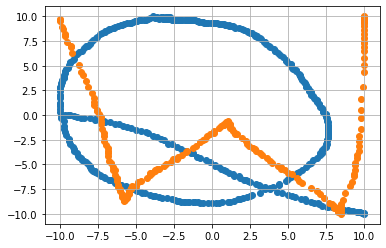

Coeff of Q0 :  283.0903055833546
Coeff of W0_test :  236.11100211897917
Coeff of Q1 :  1175.2279278443325
Coeff of W1_test :  1076.9716438337794
Coeff of Q2 :  -934.5763374902996
Coeff of W2_test :  -1028.1655377026354


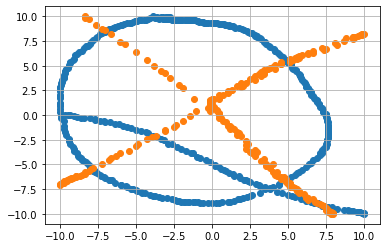

Coeff of Q0 :  283.0903055833546
Coeff of X0_test :  202.9950320276672
Coeff of Q1 :  1175.2279278443325
Coeff of X1_test :  921.5927592848752
Coeff of Q2 :  -934.5763374902996
Coeff of X2_test :  -664.5155167433047


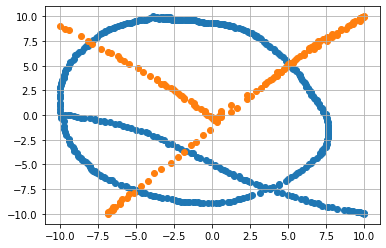

Coeff of Q0 :  283.0903055833546
Coeff of Y0_test :  120.89855183715876
Coeff of Q1 :  1175.2279278443325
Coeff of Y1_test :  827.7485841209242
Coeff of Q2 :  -934.5763374902996
Coeff of Y2_test :  -358.7235004998596


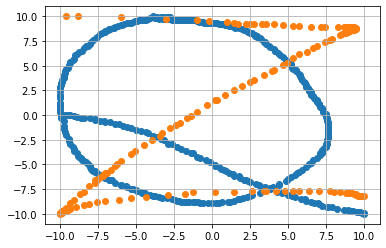

Coeff of Q0 :  283.0903055833546
Coeff of Z0_test :  165.25315292561243
Coeff of Q1 :  1175.2279278443325
Coeff of Z1_test :  1145.1837448016436
Coeff of Q2 :  -934.5763374902996
Coeff of Z2_test :  -1023.0387527418625


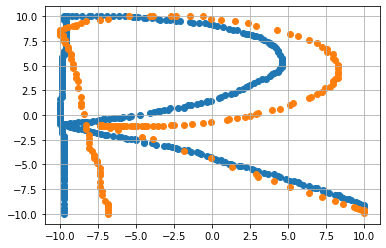

Coeff of R0 :  271.0556489543758
Coeff of R0_test :  254.8594941303752
Coeff of R1 :  1154.7944555239346
Coeff of R1_test :  1124.5862399648388
Coeff of R2 :  -1183.568062802659
Coeff of R2_test :  -992.1013853714055


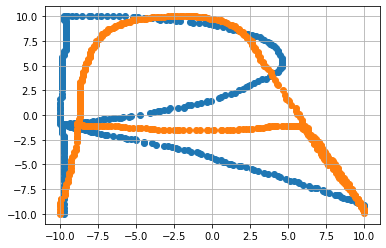

Coeff of R0 :  271.0556489543758
Coeff of A0_test :  295.75212444547986
Coeff of R1 :  1154.7944555239346
Coeff of A1_test :  1167.8748903146416
Coeff of R2 :  -1183.568062802659
Coeff of A2_test :  -833.8149325892592


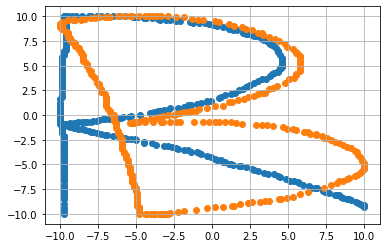

Coeff of R0 :  271.0556489543758
Coeff of B0_test :  259.0953261510756
Coeff of R1 :  1154.7944555239346
Coeff of B1_test :  1079.4803944623545
Coeff of R2 :  -1183.568062802659
Coeff of B2_test :  -967.0156291299161


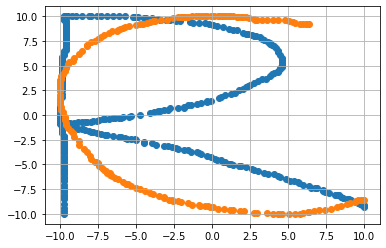

Coeff of R0 :  271.0556489543758
Coeff of C0_test :  303.33333558039624
Coeff of R1 :  1154.7944555239346
Coeff of C1_test :  1324.1760920437448
Coeff of R2 :  -1183.568062802659
Coeff of C2_test :  -1185.8005411694767


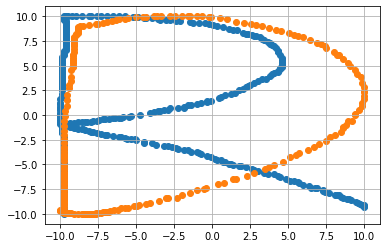

Coeff of R0 :  271.0556489543758
Coeff of D0_test :  258.43618154195667
Coeff of R1 :  1154.7944555239346
Coeff of D1_test :  1320.6773231749596
Coeff of R2 :  -1183.568062802659
Coeff of D2_test :  -1422.3196127785307


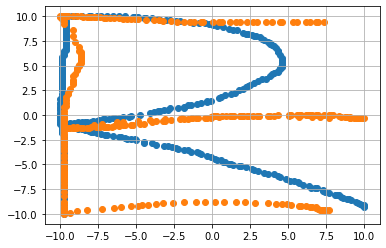

Coeff of R0 :  271.0556489543758
Coeff of E0_test :  265.84587396695025
Coeff of R1 :  1154.7944555239346
Coeff of E1_test :  1153.4052496110676
Coeff of R2 :  -1183.568062802659
Coeff of E2_test :  -1169.2190472063774


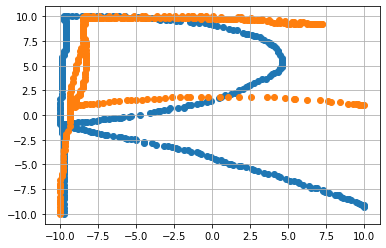

Coeff of R0 :  271.0556489543758
Coeff of F0_test :  303.2106574863934
Coeff of R1 :  1154.7944555239346
Coeff of F1_test :  1311.714510611808
Coeff of R2 :  -1183.568062802659
Coeff of F2_test :  -905.8068476262688


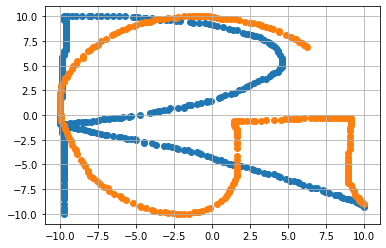

Coeff of R0 :  271.0556489543758
Coeff of G0_test :  287.81806338658964
Coeff of R1 :  1154.7944555239346
Coeff of G1_test :  1184.13016369023
Coeff of R2 :  -1183.568062802659
Coeff of G2_test :  -889.6157584280653


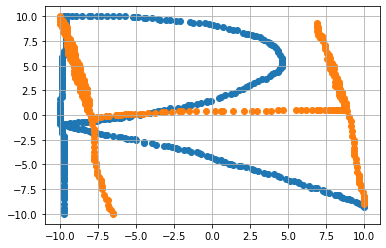

Coeff of R0 :  271.0556489543758
Coeff of H0_test :  274.7281613651508
Coeff of R1 :  1154.7944555239346
Coeff of H1_test :  1207.5890377110502
Coeff of R2 :  -1183.568062802659
Coeff of H2_test :  -835.9788200672382


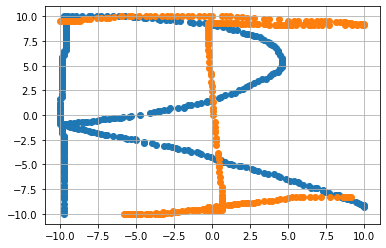

Coeff of R0 :  271.0556489543758
Coeff of I0_test :  270.69151720540685
Coeff of R1 :  1154.7944555239346
Coeff of I1_test :  1241.1484099097927
Coeff of R2 :  -1183.568062802659
Coeff of I2_test :  -812.2991068471923


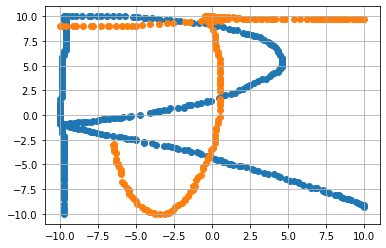

Coeff of R0 :  271.0556489543758
Coeff of J0_test :  221.45118729813638
Coeff of R1 :  1154.7944555239346
Coeff of J1_test :  1126.8306481468614
Coeff of R2 :  -1183.568062802659
Coeff of J2_test :  -566.7243542000019


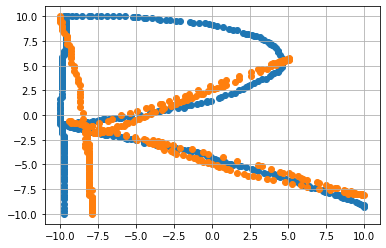

Coeff of R0 :  271.0556489543758
Coeff of K0_test :  225.27417960061194
Coeff of R1 :  1154.7944555239346
Coeff of K1_test :  1019.6317748186923
Coeff of R2 :  -1183.568062802659
Coeff of K2_test :  -1304.4310580413776


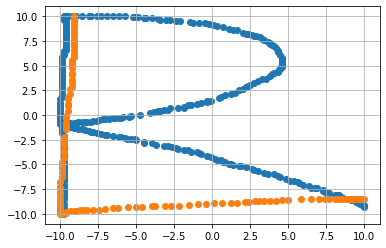

Coeff of R0 :  271.0556489543758
Coeff of l0_test :  285.9043978519215
Coeff of R1 :  1154.7944555239346
Coeff of l1_test :  1422.5570081418418
Coeff of R2 :  -1183.568062802659
Coeff of l2_test :  -2018.5060264647684


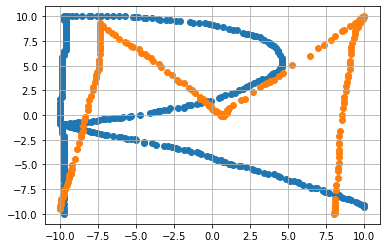

Coeff of R0 :  271.0556489543758
Coeff of M0_test :  214.10803634567756
Coeff of R1 :  1154.7944555239346
Coeff of M1_test :  1089.6741001583043
Coeff of R2 :  -1183.568062802659
Coeff of M2_test :  -629.8972346564841


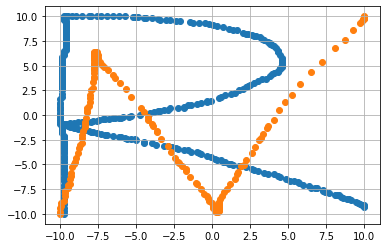

Coeff of R0 :  271.0556489543758
Coeff of N0_test :  243.10505698081576
Coeff of R1 :  1154.7944555239346
Coeff of N1_test :  1105.8386136599713
Coeff of R2 :  -1183.568062802659
Coeff of N2_test :  -1310.925127662746


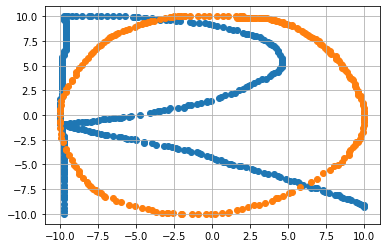

Coeff of R0 :  271.0556489543758
Coeff of O0_test :  269.7623165120487
Coeff of R1 :  1154.7944555239346
Coeff of O1_test :  1282.249724789818
Coeff of R2 :  -1183.568062802659
Coeff of O2_test :  -717.4726016993875


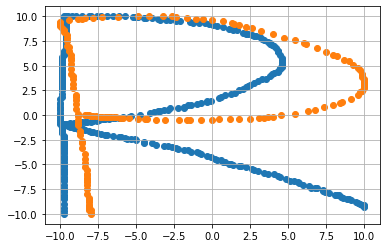

Coeff of R0 :  271.0556489543758
Coeff of P0_test :  253.9459355754082
Coeff of R1 :  1154.7944555239346
Coeff of P1_test :  1164.824965942085
Coeff of R2 :  -1183.568062802659
Coeff of P2_test :  -989.6196113536425


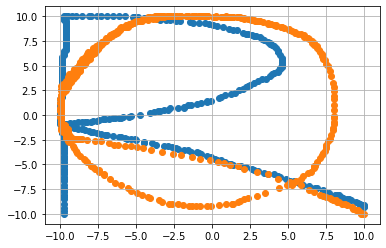

Coeff of R0 :  271.0556489543758
Coeff of Q0_test :  305.04450712852395
Coeff of R1 :  1154.7944555239346
Coeff of Q1_test :  1276.4719466447903
Coeff of R2 :  -1183.568062802659
Coeff of Q2_test :  -995.8869849547273


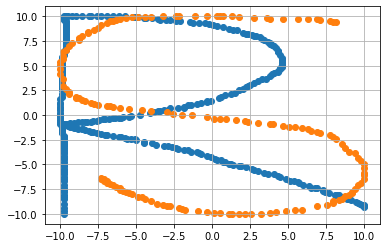

Coeff of R0 :  271.0556489543758
Coeff of S0_test :  290.8544314933228
Coeff of R1 :  1154.7944555239346
Coeff of S1_test :  1226.8256899731539
Coeff of R2 :  -1183.568062802659
Coeff of S2_test :  -1063.3894728687897


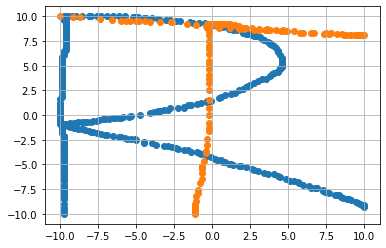

Coeff of R0 :  271.0556489543758
Coeff of T0_test :  236.43423922900277
Coeff of R1 :  1154.7944555239346
Coeff of T1_test :  1121.3978887350374
Coeff of R2 :  -1183.568062802659
Coeff of T2_test :  -220.72383321871104


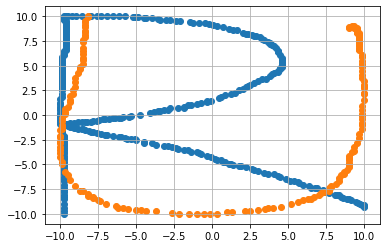

Coeff of R0 :  271.0556489543758
Coeff of U0_test :  275.3156630172093
Coeff of R1 :  1154.7944555239346
Coeff of U1_test :  1361.5579794263167
Coeff of R2 :  -1183.568062802659
Coeff of U2_test :  -1039.933347800673


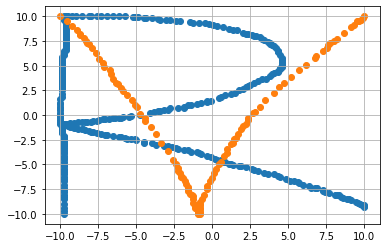

Coeff of R0 :  271.0556489543758
Coeff of V0_test :  225.07537052980817
Coeff of R1 :  1154.7944555239346
Coeff of V1_test :  993.1652737688586
Coeff of R2 :  -1183.568062802659
Coeff of V2_test :  -888.3002255901538


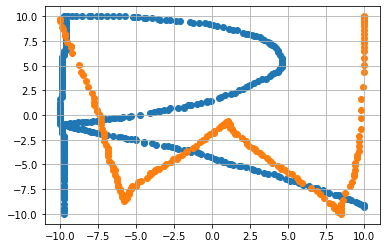

Coeff of R0 :  271.0556489543758
Coeff of W0_test :  236.11100211897917
Coeff of R1 :  1154.7944555239346
Coeff of W1_test :  1076.9716438337794
Coeff of R2 :  -1183.568062802659
Coeff of W2_test :  -1028.1655377026354


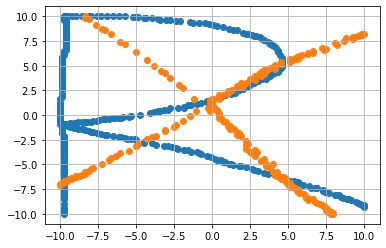

Coeff of R0 :  271.0556489543758
Coeff of X0_test :  202.9950320276672
Coeff of R1 :  1154.7944555239346
Coeff of X1_test :  921.5927592848752
Coeff of R2 :  -1183.568062802659
Coeff of X2_test :  -664.5155167433047


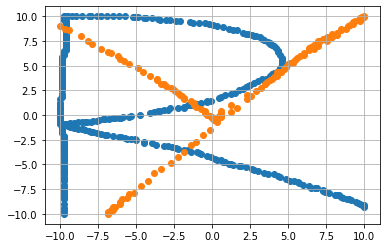

Coeff of R0 :  271.0556489543758
Coeff of Y0_test :  120.89855183715876
Coeff of R1 :  1154.7944555239346
Coeff of Y1_test :  827.7485841209242
Coeff of R2 :  -1183.568062802659
Coeff of Y2_test :  -358.7235004998596


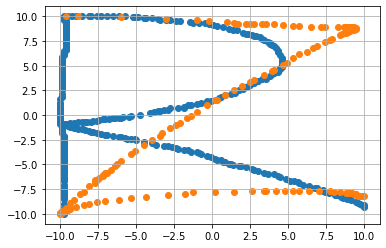

Coeff of R0 :  271.0556489543758
Coeff of Z0_test :  165.25315292561243
Coeff of R1 :  1154.7944555239346
Coeff of Z1_test :  1145.1837448016436
Coeff of R2 :  -1183.568062802659
Coeff of Z2_test :  -1023.0387527418625


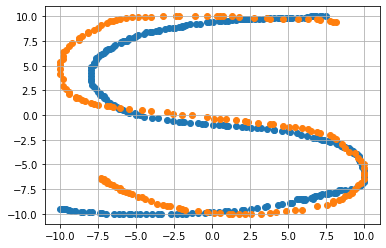

Coeff of S0 :  290.9489788122187
Coeff of S0_test :  290.8544314933228
Coeff of S1 :  1211.4299832218985
Coeff of S1_test :  1226.8256899731539
Coeff of S2 :  -898.4716263764678
Coeff of S2_test :  -1063.3894728687897


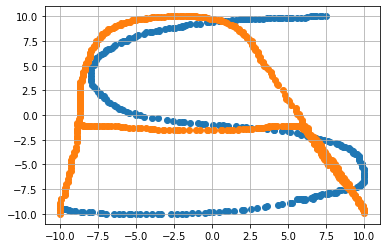

Coeff of S0 :  290.9489788122187
Coeff of A0_test :  295.75212444547986
Coeff of S1 :  1211.4299832218985
Coeff of A1_test :  1167.8748903146416
Coeff of S2 :  -898.4716263764678
Coeff of A2_test :  -833.8149325892592


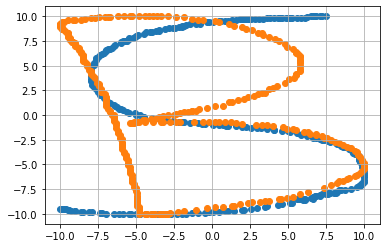

Coeff of S0 :  290.9489788122187
Coeff of B0_test :  259.0953261510756
Coeff of S1 :  1211.4299832218985
Coeff of B1_test :  1079.4803944623545
Coeff of S2 :  -898.4716263764678
Coeff of B2_test :  -967.0156291299161


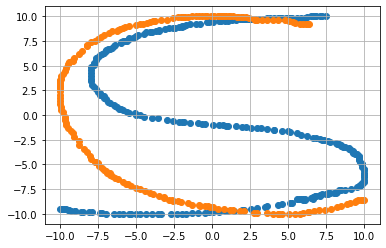

Coeff of S0 :  290.9489788122187
Coeff of C0_test :  303.33333558039624
Coeff of S1 :  1211.4299832218985
Coeff of C1_test :  1324.1760920437448
Coeff of S2 :  -898.4716263764678
Coeff of C2_test :  -1185.8005411694767


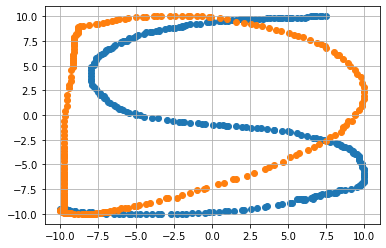

Coeff of S0 :  290.9489788122187
Coeff of D0_test :  258.43618154195667
Coeff of S1 :  1211.4299832218985
Coeff of D1_test :  1320.6773231749596
Coeff of S2 :  -898.4716263764678
Coeff of D2_test :  -1422.3196127785307


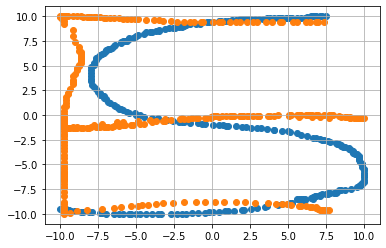

Coeff of S0 :  290.9489788122187
Coeff of E0_test :  265.84587396695025
Coeff of S1 :  1211.4299832218985
Coeff of E1_test :  1153.4052496110676
Coeff of S2 :  -898.4716263764678
Coeff of E2_test :  -1169.2190472063774


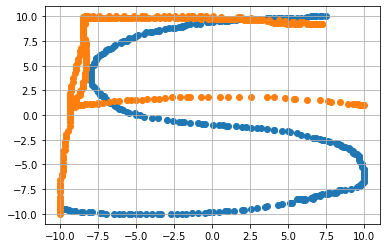

Coeff of S0 :  290.9489788122187
Coeff of F0_test :  303.2106574863934
Coeff of S1 :  1211.4299832218985
Coeff of F1_test :  1311.714510611808
Coeff of S2 :  -898.4716263764678
Coeff of F2_test :  -905.8068476262688


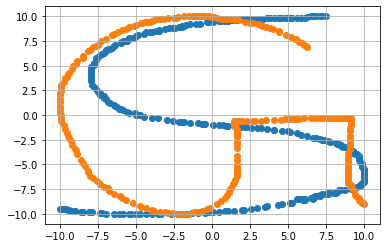

Coeff of S0 :  290.9489788122187
Coeff of G0_test :  287.81806338658964
Coeff of S1 :  1211.4299832218985
Coeff of G1_test :  1184.13016369023
Coeff of S2 :  -898.4716263764678
Coeff of G2_test :  -889.6157584280653


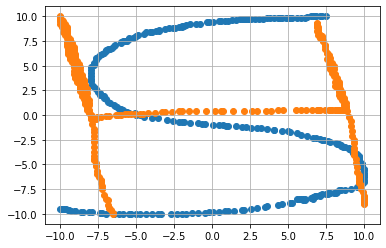

Coeff of S0 :  290.9489788122187
Coeff of H0_test :  274.7281613651508
Coeff of S1 :  1211.4299832218985
Coeff of H1_test :  1207.5890377110502
Coeff of S2 :  -898.4716263764678
Coeff of H2_test :  -835.9788200672382


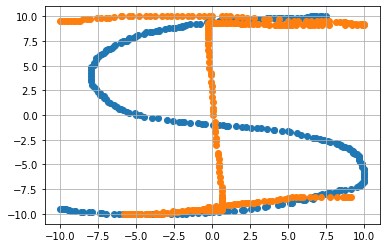

Coeff of S0 :  290.9489788122187
Coeff of I0_test :  270.69151720540685
Coeff of S1 :  1211.4299832218985
Coeff of I1_test :  1241.1484099097927
Coeff of S2 :  -898.4716263764678
Coeff of I2_test :  -812.2991068471923


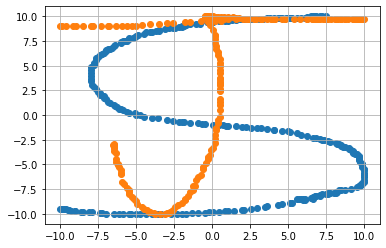

Coeff of S0 :  290.9489788122187
Coeff of J0_test :  221.45118729813638
Coeff of S1 :  1211.4299832218985
Coeff of J1_test :  1126.8306481468614
Coeff of S2 :  -898.4716263764678
Coeff of J2_test :  -566.7243542000019


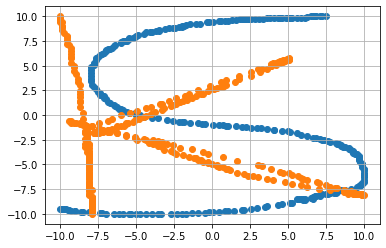

Coeff of S0 :  290.9489788122187
Coeff of K0_test :  225.27417960061194
Coeff of S1 :  1211.4299832218985
Coeff of K1_test :  1019.6317748186923
Coeff of S2 :  -898.4716263764678
Coeff of K2_test :  -1304.4310580413776


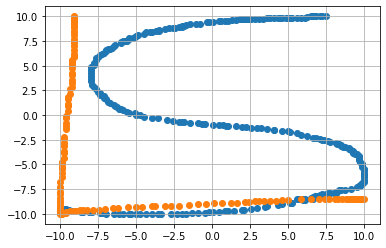

Coeff of S0 :  290.9489788122187
Coeff of l0_test :  285.9043978519215
Coeff of S1 :  1211.4299832218985
Coeff of l1_test :  1422.5570081418418
Coeff of S2 :  -898.4716263764678
Coeff of l2_test :  -2018.5060264647684


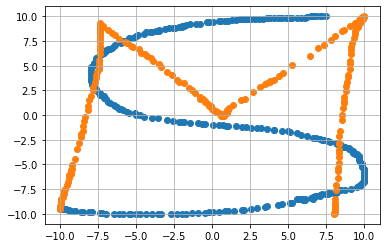

Coeff of S0 :  290.9489788122187
Coeff of M0_test :  214.10803634567756
Coeff of S1 :  1211.4299832218985
Coeff of M1_test :  1089.6741001583043
Coeff of S2 :  -898.4716263764678
Coeff of M2_test :  -629.8972346564841


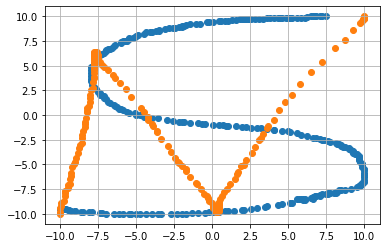

Coeff of S0 :  290.9489788122187
Coeff of N0_test :  243.10505698081576
Coeff of S1 :  1211.4299832218985
Coeff of N1_test :  1105.8386136599713
Coeff of S2 :  -898.4716263764678
Coeff of N2_test :  -1310.925127662746


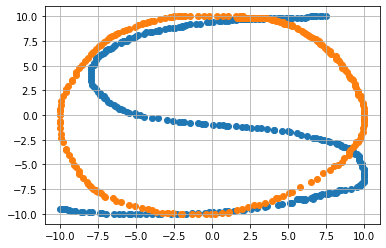

Coeff of S0 :  290.9489788122187
Coeff of O0_test :  269.7623165120487
Coeff of S1 :  1211.4299832218985
Coeff of O1_test :  1282.249724789818
Coeff of S2 :  -898.4716263764678
Coeff of O2_test :  -717.4726016993875


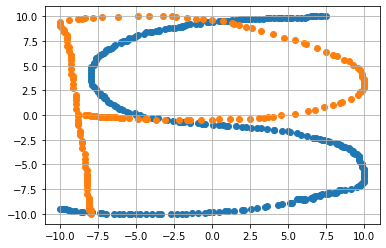

Coeff of S0 :  290.9489788122187
Coeff of P0_test :  253.9459355754082
Coeff of S1 :  1211.4299832218985
Coeff of P1_test :  1164.824965942085
Coeff of S2 :  -898.4716263764678
Coeff of P2_test :  -989.6196113536425


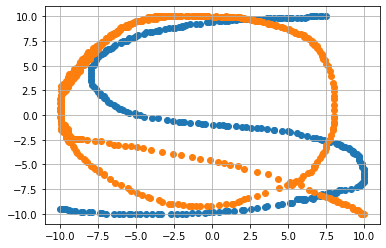

Coeff of S0 :  290.9489788122187
Coeff of Q0_test :  305.04450712852395
Coeff of S1 :  1211.4299832218985
Coeff of Q1_test :  1276.4719466447903
Coeff of S2 :  -898.4716263764678
Coeff of Q2_test :  -995.8869849547273


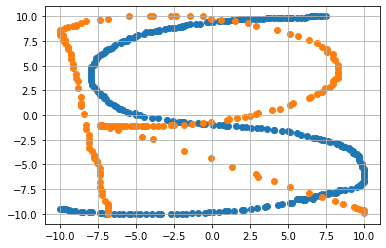

Coeff of S0 :  290.9489788122187
Coeff of R0_test :  254.8594941303752
Coeff of S1 :  1211.4299832218985
Coeff of R1_test :  1124.5862399648388
Coeff of S2 :  -898.4716263764678
Coeff of R2_test :  -992.1013853714055


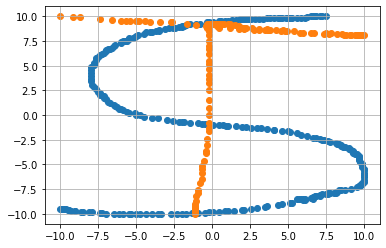

Coeff of S0 :  290.9489788122187
Coeff of T0_test :  236.43423922900277
Coeff of S1 :  1211.4299832218985
Coeff of T1_test :  1121.3978887350374
Coeff of S2 :  -898.4716263764678
Coeff of T2_test :  -220.72383321871104


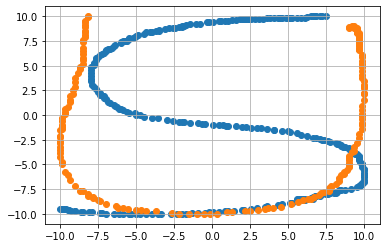

Coeff of S0 :  290.9489788122187
Coeff of U0_test :  275.3156630172093
Coeff of S1 :  1211.4299832218985
Coeff of U1_test :  1361.5579794263167
Coeff of S2 :  -898.4716263764678
Coeff of U2_test :  -1039.933347800673


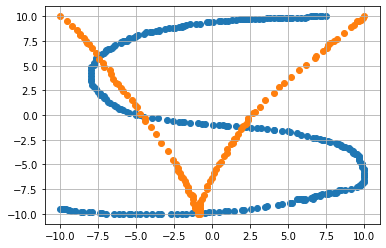

Coeff of S0 :  290.9489788122187
Coeff of V0_test :  225.07537052980817
Coeff of S1 :  1211.4299832218985
Coeff of V1_test :  993.1652737688586
Coeff of S2 :  -898.4716263764678
Coeff of V2_test :  -888.3002255901538


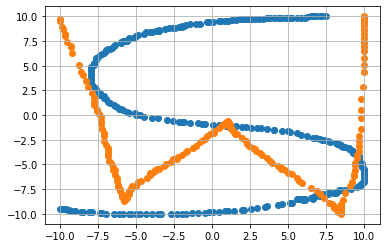

Coeff of S0 :  290.9489788122187
Coeff of W0_test :  236.11100211897917
Coeff of S1 :  1211.4299832218985
Coeff of W1_test :  1076.9716438337794
Coeff of S2 :  -898.4716263764678
Coeff of W2_test :  -1028.1655377026354


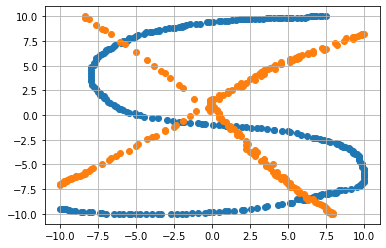

Coeff of S0 :  290.9489788122187
Coeff of X0_test :  202.9950320276672
Coeff of S1 :  1211.4299832218985
Coeff of X1_test :  921.5927592848752
Coeff of S2 :  -898.4716263764678
Coeff of X2_test :  -664.5155167433047


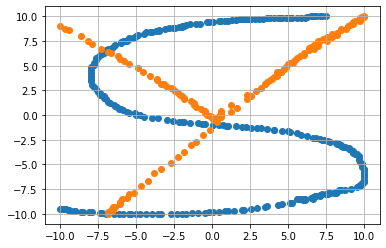

Coeff of S0 :  290.9489788122187
Coeff of Y0_test :  120.89855183715876
Coeff of S1 :  1211.4299832218985
Coeff of Y1_test :  827.7485841209242
Coeff of S2 :  -898.4716263764678
Coeff of Y2_test :  -358.7235004998596


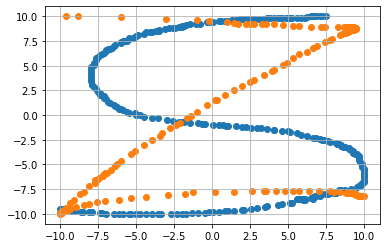

Coeff of S0 :  290.9489788122187
Coeff of Z0_test :  165.25315292561243
Coeff of S1 :  1211.4299832218985
Coeff of Z1_test :  1145.1837448016436
Coeff of S2 :  -898.4716263764678
Coeff of Z2_test :  -1023.0387527418625


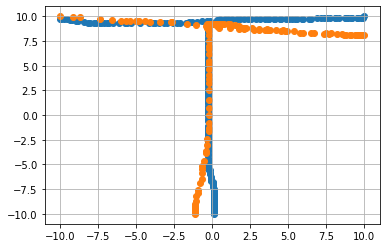

Coeff of T0 :  240.23050718942264
Coeff of T0_test :  236.43423922900277
Coeff of T1 :  1022.4006469878958
Coeff of T1_test :  1121.3978887350374
Coeff of T2 :  -397.3684619486792
Coeff of T2_test :  -220.72383321871104


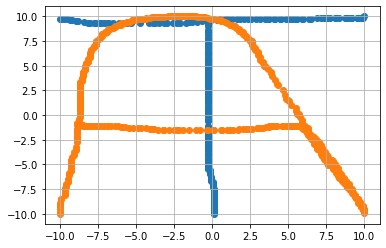

Coeff of T0 :  240.23050718942264
Coeff of A0_test :  295.75212444547986
Coeff of T1 :  1022.4006469878958
Coeff of A1_test :  1167.8748903146416
Coeff of T2 :  -397.3684619486792
Coeff of A2_test :  -833.8149325892592


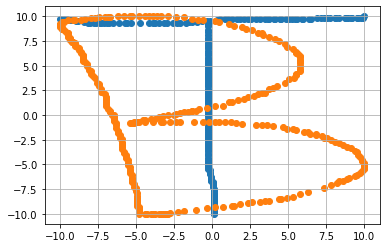

Coeff of T0 :  240.23050718942264
Coeff of B0_test :  259.0953261510756
Coeff of T1 :  1022.4006469878958
Coeff of B1_test :  1079.4803944623545
Coeff of T2 :  -397.3684619486792
Coeff of B2_test :  -967.0156291299161


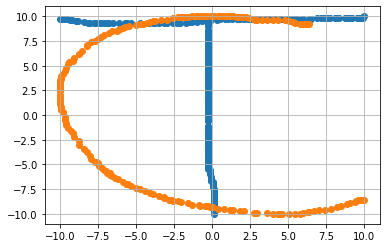

Coeff of T0 :  240.23050718942264
Coeff of C0_test :  303.33333558039624
Coeff of T1 :  1022.4006469878958
Coeff of C1_test :  1324.1760920437448
Coeff of T2 :  -397.3684619486792
Coeff of C2_test :  -1185.8005411694767


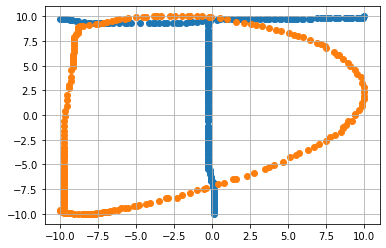

Coeff of T0 :  240.23050718942264
Coeff of D0_test :  258.43618154195667
Coeff of T1 :  1022.4006469878958
Coeff of D1_test :  1320.6773231749596
Coeff of T2 :  -397.3684619486792
Coeff of D2_test :  -1422.3196127785307


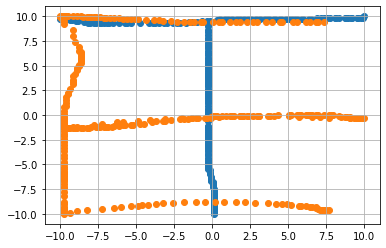

Coeff of T0 :  240.23050718942264
Coeff of E0_test :  265.84587396695025
Coeff of T1 :  1022.4006469878958
Coeff of E1_test :  1153.4052496110676
Coeff of T2 :  -397.3684619486792
Coeff of E2_test :  -1169.2190472063774


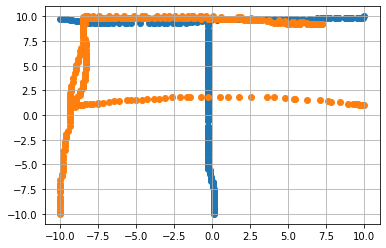

Coeff of T0 :  240.23050718942264
Coeff of F0_test :  303.2106574863934
Coeff of T1 :  1022.4006469878958
Coeff of F1_test :  1311.714510611808
Coeff of T2 :  -397.3684619486792
Coeff of F2_test :  -905.8068476262688


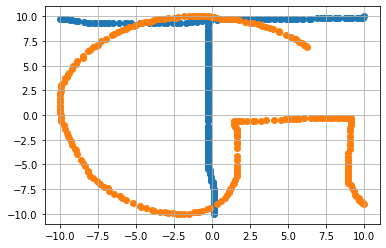

Coeff of T0 :  240.23050718942264
Coeff of G0_test :  287.81806338658964
Coeff of T1 :  1022.4006469878958
Coeff of G1_test :  1184.13016369023
Coeff of T2 :  -397.3684619486792
Coeff of G2_test :  -889.6157584280653


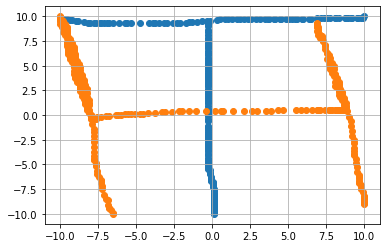

Coeff of T0 :  240.23050718942264
Coeff of H0_test :  274.7281613651508
Coeff of T1 :  1022.4006469878958
Coeff of H1_test :  1207.5890377110502
Coeff of T2 :  -397.3684619486792
Coeff of H2_test :  -835.9788200672382


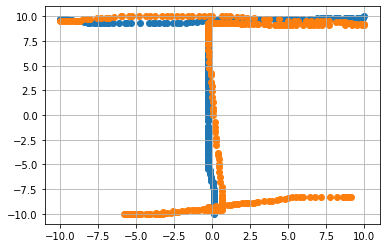

Coeff of T0 :  240.23050718942264
Coeff of I0_test :  270.69151720540685
Coeff of T1 :  1022.4006469878958
Coeff of I1_test :  1241.1484099097927
Coeff of T2 :  -397.3684619486792
Coeff of I2_test :  -812.2991068471923


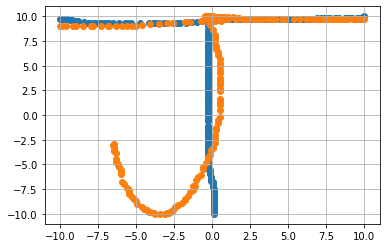

Coeff of T0 :  240.23050718942264
Coeff of J0_test :  221.45118729813638
Coeff of T1 :  1022.4006469878958
Coeff of J1_test :  1126.8306481468614
Coeff of T2 :  -397.3684619486792
Coeff of J2_test :  -566.7243542000019


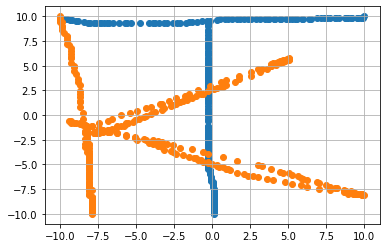

Coeff of T0 :  240.23050718942264
Coeff of K0_test :  225.27417960061194
Coeff of T1 :  1022.4006469878958
Coeff of K1_test :  1019.6317748186923
Coeff of T2 :  -397.3684619486792
Coeff of K2_test :  -1304.4310580413776


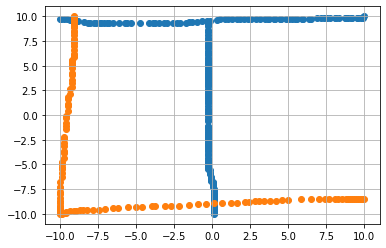

Coeff of T0 :  240.23050718942264
Coeff of l0_test :  285.9043978519215
Coeff of T1 :  1022.4006469878958
Coeff of l1_test :  1422.5570081418418
Coeff of T2 :  -397.3684619486792
Coeff of l2_test :  -2018.5060264647684


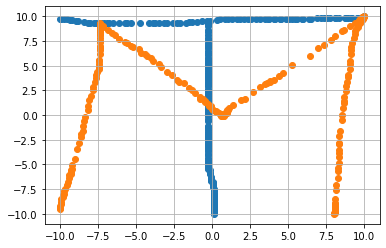

Coeff of T0 :  240.23050718942264
Coeff of M0_test :  214.10803634567756
Coeff of T1 :  1022.4006469878958
Coeff of M1_test :  1089.6741001583043
Coeff of T2 :  -397.3684619486792
Coeff of M2_test :  -629.8972346564841


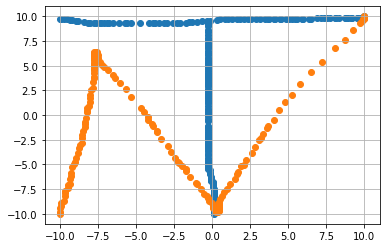

Coeff of T0 :  240.23050718942264
Coeff of N0_test :  243.10505698081576
Coeff of T1 :  1022.4006469878958
Coeff of N1_test :  1105.8386136599713
Coeff of T2 :  -397.3684619486792
Coeff of N2_test :  -1310.925127662746


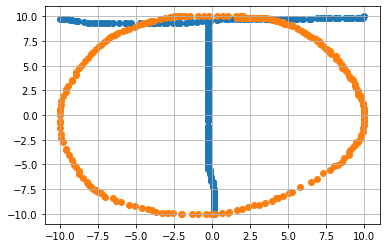

Coeff of T0 :  240.23050718942264
Coeff of O0_test :  269.7623165120487
Coeff of T1 :  1022.4006469878958
Coeff of O1_test :  1282.249724789818
Coeff of T2 :  -397.3684619486792
Coeff of O2_test :  -717.4726016993875


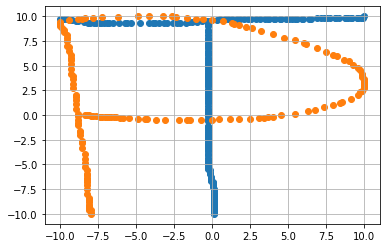

Coeff of T0 :  240.23050718942264
Coeff of P0_test :  253.9459355754082
Coeff of T1 :  1022.4006469878958
Coeff of P1_test :  1164.824965942085
Coeff of T2 :  -397.3684619486792
Coeff of P2_test :  -989.6196113536425


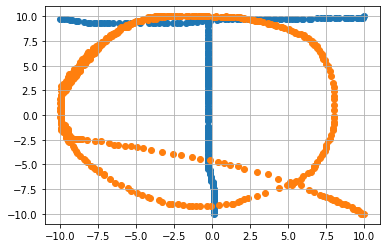

Coeff of T0 :  240.23050718942264
Coeff of Q0_test :  305.04450712852395
Coeff of T1 :  1022.4006469878958
Coeff of Q1_test :  1276.4719466447903
Coeff of T2 :  -397.3684619486792
Coeff of Q2_test :  -995.8869849547273


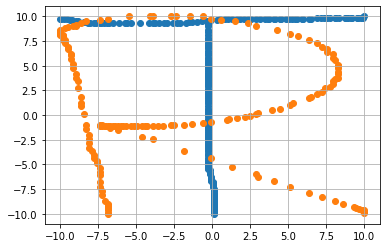

Coeff of T0 :  240.23050718942264
Coeff of R0_test :  254.8594941303752
Coeff of T1 :  1022.4006469878958
Coeff of R1_test :  1124.5862399648388
Coeff of T2 :  -397.3684619486792
Coeff of R2_test :  -992.1013853714055


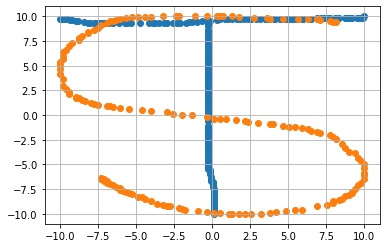

Coeff of T0 :  240.23050718942264
Coeff of S0_test :  290.8544314933228
Coeff of T1 :  1022.4006469878958
Coeff of S1_test :  1226.8256899731539
Coeff of T2 :  -397.3684619486792
Coeff of S2_test :  -1063.3894728687897


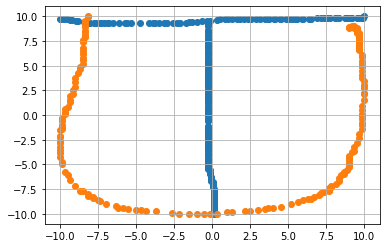

Coeff of T0 :  240.23050718942264
Coeff of U0_test :  275.3156630172093
Coeff of T1 :  1022.4006469878958
Coeff of U1_test :  1361.5579794263167
Coeff of T2 :  -397.3684619486792
Coeff of U2_test :  -1039.933347800673


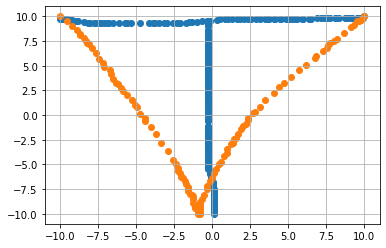

Coeff of T0 :  240.23050718942264
Coeff of V0_test :  225.07537052980817
Coeff of T1 :  1022.4006469878958
Coeff of V1_test :  993.1652737688586
Coeff of T2 :  -397.3684619486792
Coeff of V2_test :  -888.3002255901538


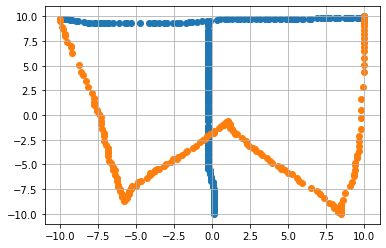

Coeff of T0 :  240.23050718942264
Coeff of W0_test :  236.11100211897917
Coeff of T1 :  1022.4006469878958
Coeff of W1_test :  1076.9716438337794
Coeff of T2 :  -397.3684619486792
Coeff of W2_test :  -1028.1655377026354


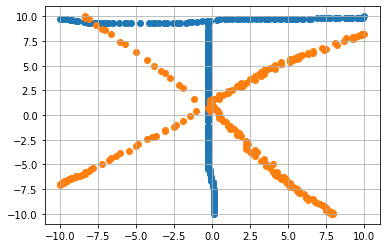

Coeff of T0 :  240.23050718942264
Coeff of X0_test :  202.9950320276672
Coeff of T1 :  1022.4006469878958
Coeff of X1_test :  921.5927592848752
Coeff of T2 :  -397.3684619486792
Coeff of X2_test :  -664.5155167433047


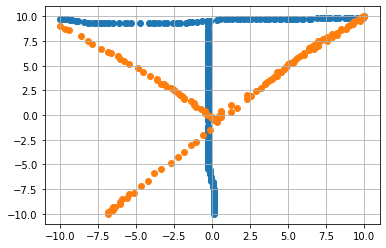

Coeff of T0 :  240.23050718942264
Coeff of Y0_test :  120.89855183715876
Coeff of T1 :  1022.4006469878958
Coeff of Y1_test :  827.7485841209242
Coeff of T2 :  -397.3684619486792
Coeff of Y2_test :  -358.7235004998596


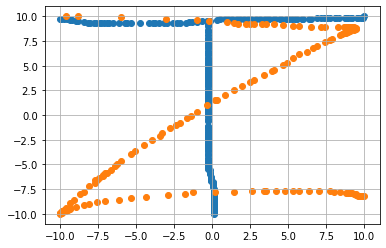

Coeff of T0 :  240.23050718942264
Coeff of Z0_test :  165.25315292561243
Coeff of T1 :  1022.4006469878958
Coeff of Z1_test :  1145.1837448016436
Coeff of T2 :  -397.3684619486792
Coeff of Z2_test :  -1023.0387527418625


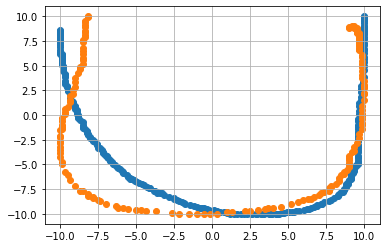

Coeff of U0 :  295.59533446463206
Coeff of U0_test :  275.3156630172093
Coeff of U1 :  1320.4975099392834
Coeff of U1_test :  1361.5579794263167
Coeff of U2 :  -1264.2491190907124
Coeff of U2_test :  -1039.933347800673


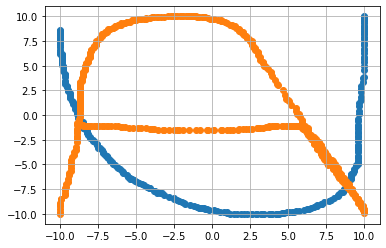

Coeff of U0 :  295.59533446463206
Coeff of A0_test :  295.75212444547986
Coeff of U1 :  1320.4975099392834
Coeff of A1_test :  1167.8748903146416
Coeff of U2 :  -1264.2491190907124
Coeff of A2_test :  -833.8149325892592


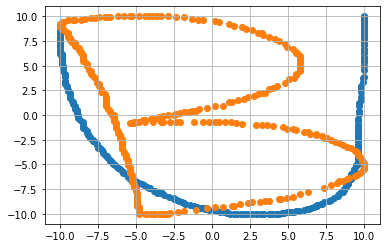

Coeff of U0 :  295.59533446463206
Coeff of B0_test :  259.0953261510756
Coeff of U1 :  1320.4975099392834
Coeff of B1_test :  1079.4803944623545
Coeff of U2 :  -1264.2491190907124
Coeff of B2_test :  -967.0156291299161


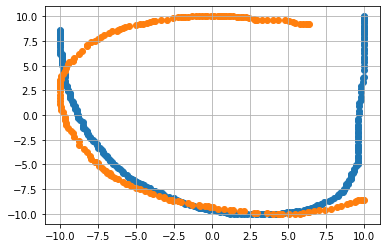

Coeff of U0 :  295.59533446463206
Coeff of C0_test :  303.33333558039624
Coeff of U1 :  1320.4975099392834
Coeff of C1_test :  1324.1760920437448
Coeff of U2 :  -1264.2491190907124
Coeff of C2_test :  -1185.8005411694767


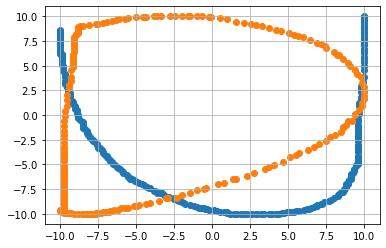

Coeff of U0 :  295.59533446463206
Coeff of D0_test :  258.43618154195667
Coeff of U1 :  1320.4975099392834
Coeff of D1_test :  1320.6773231749596
Coeff of U2 :  -1264.2491190907124
Coeff of D2_test :  -1422.3196127785307


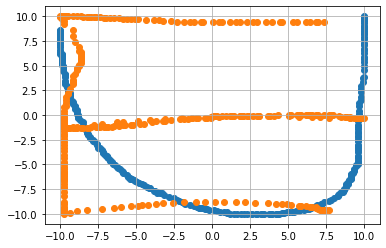

Coeff of U0 :  295.59533446463206
Coeff of E0_test :  265.84587396695025
Coeff of U1 :  1320.4975099392834
Coeff of E1_test :  1153.4052496110676
Coeff of U2 :  -1264.2491190907124
Coeff of E2_test :  -1169.2190472063774


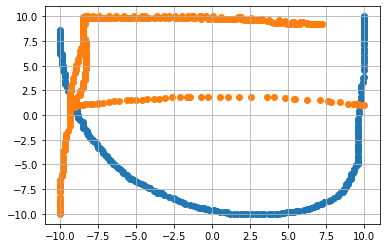

Coeff of U0 :  295.59533446463206
Coeff of F0_test :  303.2106574863934
Coeff of U1 :  1320.4975099392834
Coeff of F1_test :  1311.714510611808
Coeff of U2 :  -1264.2491190907124
Coeff of F2_test :  -905.8068476262688


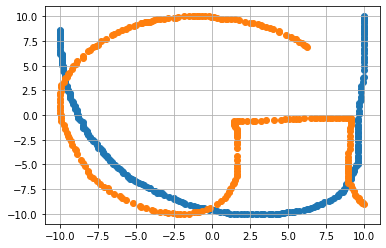

Coeff of U0 :  295.59533446463206
Coeff of G0_test :  287.81806338658964
Coeff of U1 :  1320.4975099392834
Coeff of G1_test :  1184.13016369023
Coeff of U2 :  -1264.2491190907124
Coeff of G2_test :  -889.6157584280653


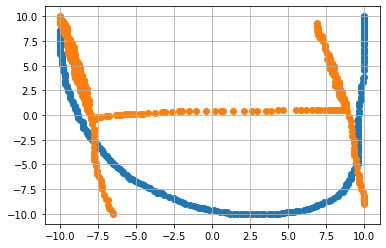

Coeff of U0 :  295.59533446463206
Coeff of H0_test :  274.7281613651508
Coeff of U1 :  1320.4975099392834
Coeff of H1_test :  1207.5890377110502
Coeff of U2 :  -1264.2491190907124
Coeff of H2_test :  -835.9788200672382


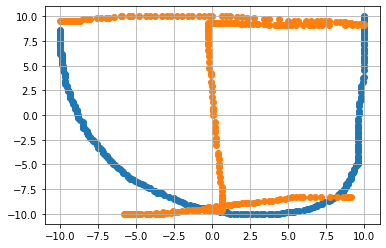

Coeff of U0 :  295.59533446463206
Coeff of I0_test :  270.69151720540685
Coeff of U1 :  1320.4975099392834
Coeff of I1_test :  1241.1484099097927
Coeff of U2 :  -1264.2491190907124
Coeff of I2_test :  -812.2991068471923


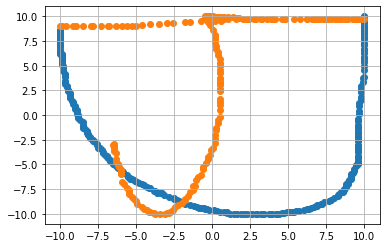

Coeff of U0 :  295.59533446463206
Coeff of J0_test :  221.45118729813638
Coeff of U1 :  1320.4975099392834
Coeff of J1_test :  1126.8306481468614
Coeff of U2 :  -1264.2491190907124
Coeff of J2_test :  -566.7243542000019


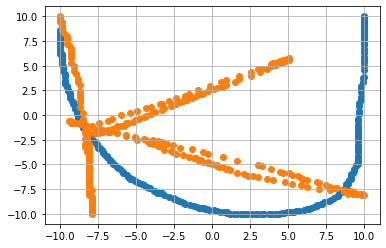

Coeff of U0 :  295.59533446463206
Coeff of K0_test :  225.27417960061194
Coeff of U1 :  1320.4975099392834
Coeff of K1_test :  1019.6317748186923
Coeff of U2 :  -1264.2491190907124
Coeff of K2_test :  -1304.4310580413776


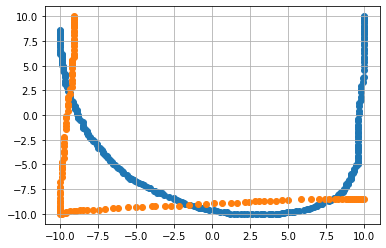

Coeff of U0 :  295.59533446463206
Coeff of l0_test :  285.9043978519215
Coeff of U1 :  1320.4975099392834
Coeff of l1_test :  1422.5570081418418
Coeff of U2 :  -1264.2491190907124
Coeff of l2_test :  -2018.5060264647684


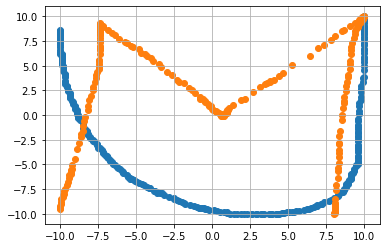

Coeff of U0 :  295.59533446463206
Coeff of M0_test :  214.10803634567756
Coeff of U1 :  1320.4975099392834
Coeff of M1_test :  1089.6741001583043
Coeff of U2 :  -1264.2491190907124
Coeff of M2_test :  -629.8972346564841


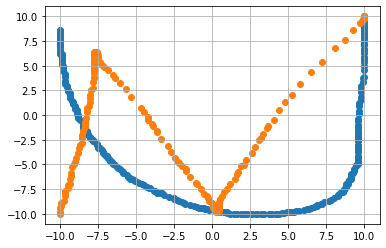

Coeff of U0 :  295.59533446463206
Coeff of N0_test :  243.10505698081576
Coeff of U1 :  1320.4975099392834
Coeff of N1_test :  1105.8386136599713
Coeff of U2 :  -1264.2491190907124
Coeff of N2_test :  -1310.925127662746


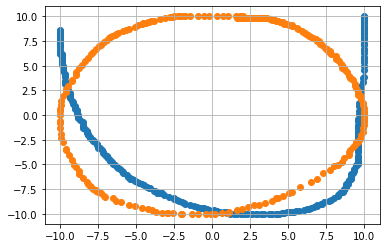

Coeff of U0 :  295.59533446463206
Coeff of O0_test :  269.7623165120487
Coeff of U1 :  1320.4975099392834
Coeff of O1_test :  1282.249724789818
Coeff of U2 :  -1264.2491190907124
Coeff of O2_test :  -717.4726016993875


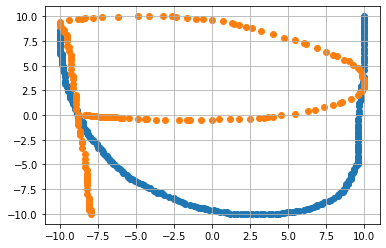

Coeff of U0 :  295.59533446463206
Coeff of P0_test :  253.9459355754082
Coeff of U1 :  1320.4975099392834
Coeff of P1_test :  1164.824965942085
Coeff of U2 :  -1264.2491190907124
Coeff of P2_test :  -989.6196113536425


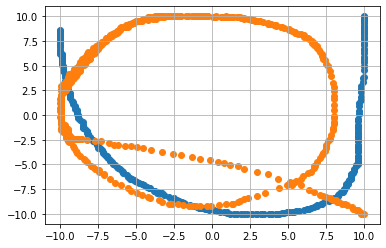

Coeff of U0 :  295.59533446463206
Coeff of Q0_test :  305.04450712852395
Coeff of U1 :  1320.4975099392834
Coeff of Q1_test :  1276.4719466447903
Coeff of U2 :  -1264.2491190907124
Coeff of Q2_test :  -995.8869849547273


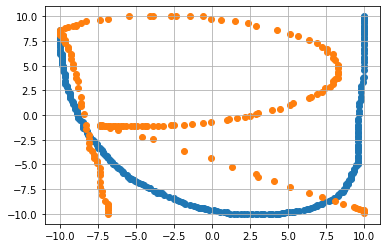

Coeff of U0 :  295.59533446463206
Coeff of R0_test :  254.8594941303752
Coeff of U1 :  1320.4975099392834
Coeff of R1_test :  1124.5862399648388
Coeff of U2 :  -1264.2491190907124
Coeff of R2_test :  -992.1013853714055


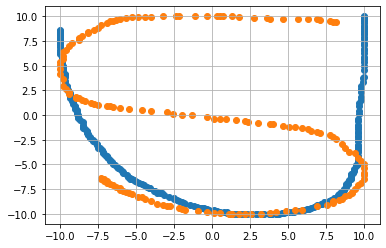

Coeff of U0 :  295.59533446463206
Coeff of S0_test :  290.8544314933228
Coeff of U1 :  1320.4975099392834
Coeff of S1_test :  1226.8256899731539
Coeff of U2 :  -1264.2491190907124
Coeff of S2_test :  -1063.3894728687897


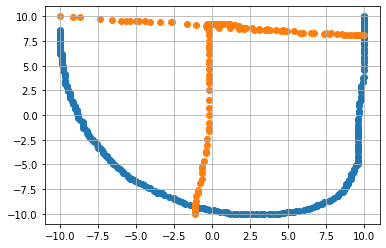

Coeff of U0 :  295.59533446463206
Coeff of T0_test :  236.43423922900277
Coeff of U1 :  1320.4975099392834
Coeff of T1_test :  1121.3978887350374
Coeff of U2 :  -1264.2491190907124
Coeff of T2_test :  -220.72383321871104


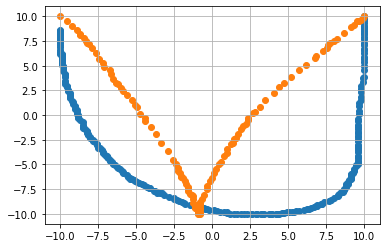

Coeff of U0 :  295.59533446463206
Coeff of V0_test :  225.07537052980817
Coeff of U1 :  1320.4975099392834
Coeff of V1_test :  993.1652737688586
Coeff of U2 :  -1264.2491190907124
Coeff of V2_test :  -888.3002255901538


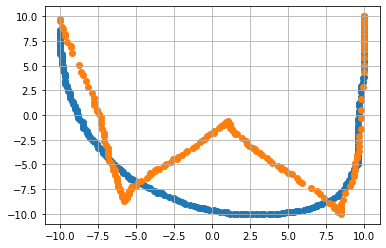

Coeff of U0 :  295.59533446463206
Coeff of W0_test :  236.11100211897917
Coeff of U1 :  1320.4975099392834
Coeff of W1_test :  1076.9716438337794
Coeff of U2 :  -1264.2491190907124
Coeff of W2_test :  -1028.1655377026354


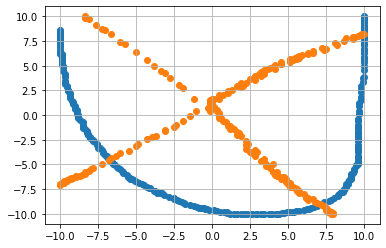

Coeff of U0 :  295.59533446463206
Coeff of X0_test :  202.9950320276672
Coeff of U1 :  1320.4975099392834
Coeff of X1_test :  921.5927592848752
Coeff of U2 :  -1264.2491190907124
Coeff of X2_test :  -664.5155167433047


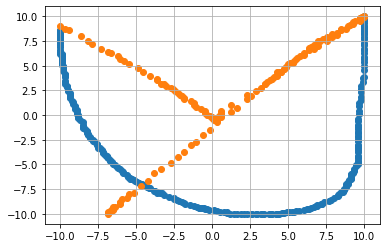

Coeff of U0 :  295.59533446463206
Coeff of Y0_test :  120.89855183715876
Coeff of U1 :  1320.4975099392834
Coeff of Y1_test :  827.7485841209242
Coeff of U2 :  -1264.2491190907124
Coeff of Y2_test :  -358.7235004998596


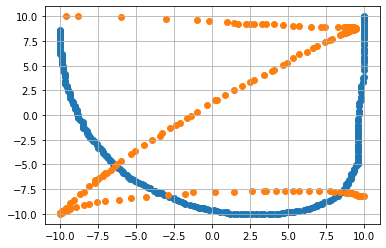

Coeff of U0 :  295.59533446463206
Coeff of Z0_test :  165.25315292561243
Coeff of U1 :  1320.4975099392834
Coeff of Z1_test :  1145.1837448016436
Coeff of U2 :  -1264.2491190907124
Coeff of Z2_test :  -1023.0387527418625


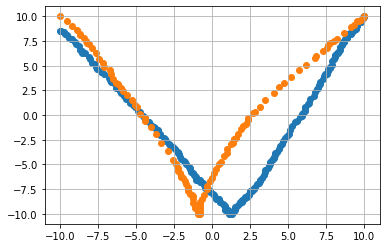

Coeff of V0 :  236.77724760892673
Coeff of V0_test :  225.07537052980817
Coeff of V1 :  1062.2628769451064
Coeff of V1_test :  993.1652737688586
Coeff of V2 :  -718.5883987446755
Coeff of V2_test :  -888.3002255901538


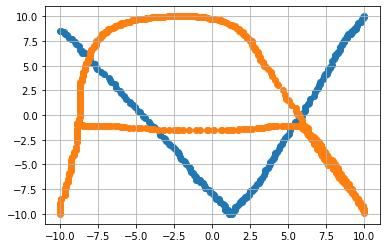

Coeff of V0 :  236.77724760892673
Coeff of A0_test :  295.75212444547986
Coeff of V1 :  1062.2628769451064
Coeff of A1_test :  1167.8748903146416
Coeff of V2 :  -718.5883987446755
Coeff of A2_test :  -833.8149325892592


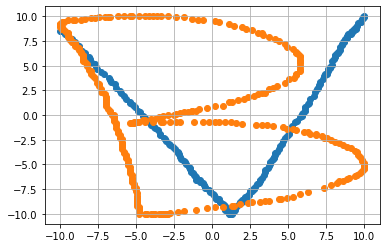

Coeff of V0 :  236.77724760892673
Coeff of B0_test :  259.0953261510756
Coeff of V1 :  1062.2628769451064
Coeff of B1_test :  1079.4803944623545
Coeff of V2 :  -718.5883987446755
Coeff of B2_test :  -967.0156291299161


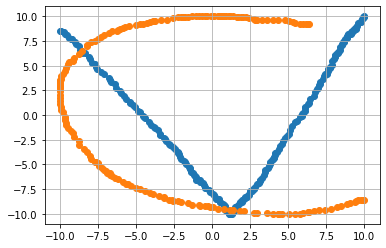

Coeff of V0 :  236.77724760892673
Coeff of C0_test :  303.33333558039624
Coeff of V1 :  1062.2628769451064
Coeff of C1_test :  1324.1760920437448
Coeff of V2 :  -718.5883987446755
Coeff of C2_test :  -1185.8005411694767


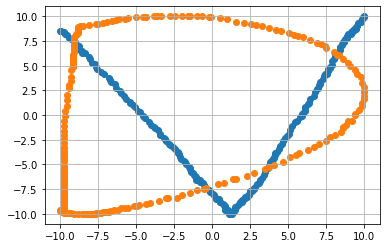

Coeff of V0 :  236.77724760892673
Coeff of D0_test :  258.43618154195667
Coeff of V1 :  1062.2628769451064
Coeff of D1_test :  1320.6773231749596
Coeff of V2 :  -718.5883987446755
Coeff of D2_test :  -1422.3196127785307


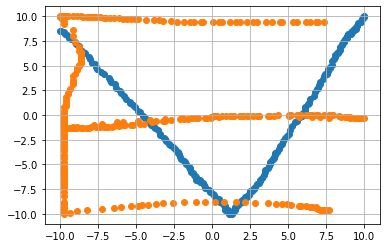

Coeff of V0 :  236.77724760892673
Coeff of E0_test :  265.84587396695025
Coeff of V1 :  1062.2628769451064
Coeff of E1_test :  1153.4052496110676
Coeff of V2 :  -718.5883987446755
Coeff of E2_test :  -1169.2190472063774


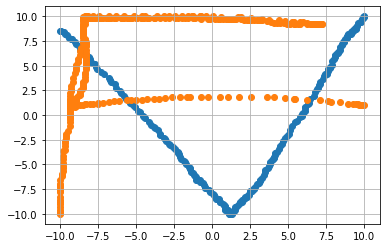

Coeff of V0 :  236.77724760892673
Coeff of F0_test :  303.2106574863934
Coeff of V1 :  1062.2628769451064
Coeff of F1_test :  1311.714510611808
Coeff of V2 :  -718.5883987446755
Coeff of F2_test :  -905.8068476262688


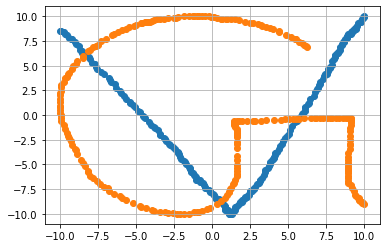

Coeff of V0 :  236.77724760892673
Coeff of G0_test :  287.81806338658964
Coeff of V1 :  1062.2628769451064
Coeff of G1_test :  1184.13016369023
Coeff of V2 :  -718.5883987446755
Coeff of G2_test :  -889.6157584280653


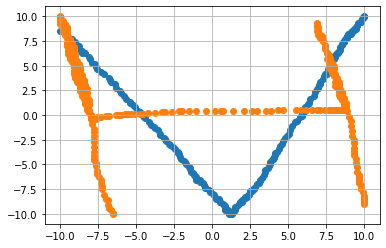

Coeff of V0 :  236.77724760892673
Coeff of H0_test :  274.7281613651508
Coeff of V1 :  1062.2628769451064
Coeff of H1_test :  1207.5890377110502
Coeff of V2 :  -718.5883987446755
Coeff of H2_test :  -835.9788200672382


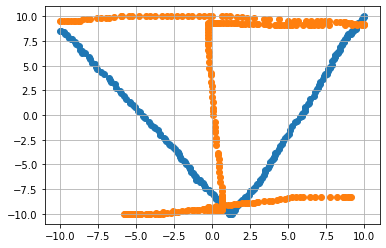

Coeff of V0 :  236.77724760892673
Coeff of I0_test :  270.69151720540685
Coeff of V1 :  1062.2628769451064
Coeff of I1_test :  1241.1484099097927
Coeff of V2 :  -718.5883987446755
Coeff of I2_test :  -812.2991068471923


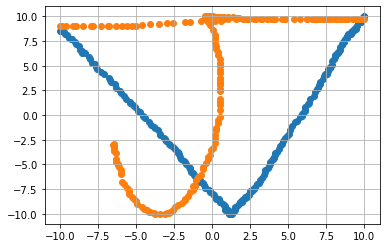

Coeff of V0 :  236.77724760892673
Coeff of J0_test :  221.45118729813638
Coeff of V1 :  1062.2628769451064
Coeff of J1_test :  1126.8306481468614
Coeff of V2 :  -718.5883987446755
Coeff of J2_test :  -566.7243542000019


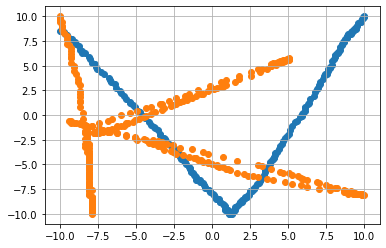

Coeff of V0 :  236.77724760892673
Coeff of K0_test :  225.27417960061194
Coeff of V1 :  1062.2628769451064
Coeff of K1_test :  1019.6317748186923
Coeff of V2 :  -718.5883987446755
Coeff of K2_test :  -1304.4310580413776


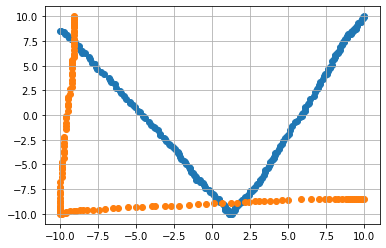

Coeff of V0 :  236.77724760892673
Coeff of l0_test :  285.9043978519215
Coeff of V1 :  1062.2628769451064
Coeff of l1_test :  1422.5570081418418
Coeff of V2 :  -718.5883987446755
Coeff of l2_test :  -2018.5060264647684


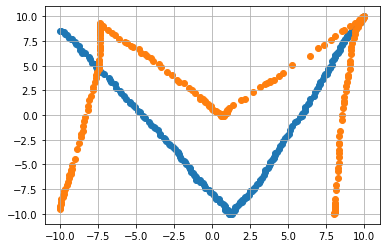

Coeff of V0 :  236.77724760892673
Coeff of M0_test :  214.10803634567756
Coeff of V1 :  1062.2628769451064
Coeff of M1_test :  1089.6741001583043
Coeff of V2 :  -718.5883987446755
Coeff of M2_test :  -629.8972346564841


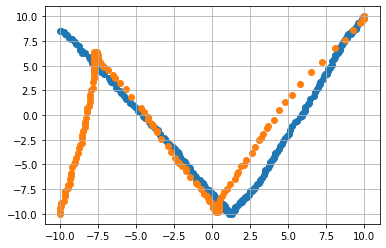

Coeff of V0 :  236.77724760892673
Coeff of N0_test :  243.10505698081576
Coeff of V1 :  1062.2628769451064
Coeff of N1_test :  1105.8386136599713
Coeff of V2 :  -718.5883987446755
Coeff of N2_test :  -1310.925127662746


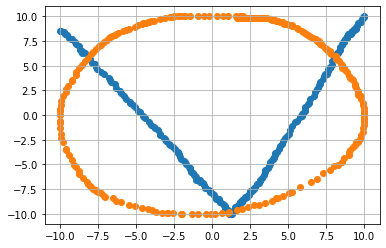

Coeff of V0 :  236.77724760892673
Coeff of O0_test :  269.7623165120487
Coeff of V1 :  1062.2628769451064
Coeff of O1_test :  1282.249724789818
Coeff of V2 :  -718.5883987446755
Coeff of O2_test :  -717.4726016993875


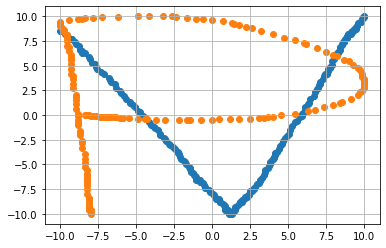

Coeff of V0 :  236.77724760892673
Coeff of P0_test :  253.9459355754082
Coeff of V1 :  1062.2628769451064
Coeff of P1_test :  1164.824965942085
Coeff of V2 :  -718.5883987446755
Coeff of P2_test :  -989.6196113536425


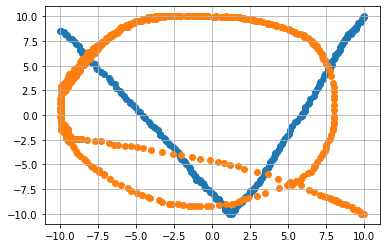

Coeff of V0 :  236.77724760892673
Coeff of Q0_test :  305.04450712852395
Coeff of V1 :  1062.2628769451064
Coeff of Q1_test :  1276.4719466447903
Coeff of V2 :  -718.5883987446755
Coeff of Q2_test :  -995.8869849547273


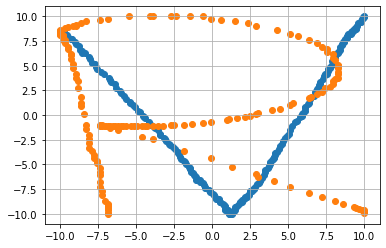

Coeff of V0 :  236.77724760892673
Coeff of R0_test :  254.8594941303752
Coeff of V1 :  1062.2628769451064
Coeff of R1_test :  1124.5862399648388
Coeff of V2 :  -718.5883987446755
Coeff of R2_test :  -992.1013853714055


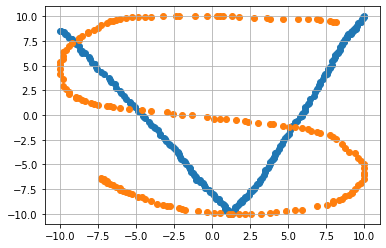

Coeff of V0 :  236.77724760892673
Coeff of S0_test :  290.8544314933228
Coeff of V1 :  1062.2628769451064
Coeff of S1_test :  1226.8256899731539
Coeff of V2 :  -718.5883987446755
Coeff of S2_test :  -1063.3894728687897


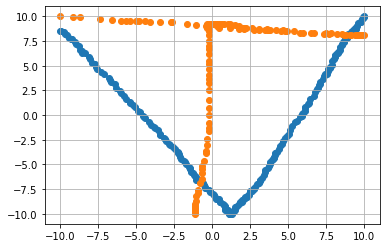

Coeff of V0 :  236.77724760892673
Coeff of T0_test :  236.43423922900277
Coeff of V1 :  1062.2628769451064
Coeff of T1_test :  1121.3978887350374
Coeff of V2 :  -718.5883987446755
Coeff of T2_test :  -220.72383321871104


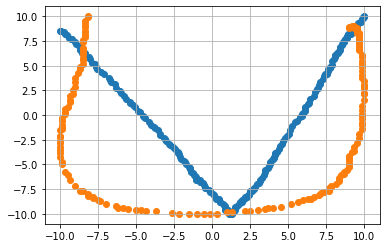

Coeff of V0 :  236.77724760892673
Coeff of U0_test :  275.3156630172093
Coeff of V1 :  1062.2628769451064
Coeff of U1_test :  1361.5579794263167
Coeff of V2 :  -718.5883987446755
Coeff of U2_test :  -1039.933347800673


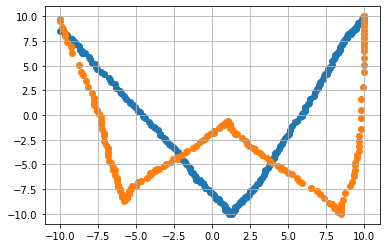

Coeff of V0 :  236.77724760892673
Coeff of W0_test :  236.11100211897917
Coeff of V1 :  1062.2628769451064
Coeff of W1_test :  1076.9716438337794
Coeff of V2 :  -718.5883987446755
Coeff of W2_test :  -1028.1655377026354


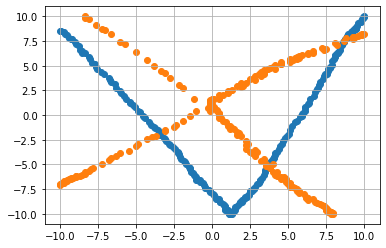

Coeff of V0 :  236.77724760892673
Coeff of X0_test :  202.9950320276672
Coeff of V1 :  1062.2628769451064
Coeff of X1_test :  921.5927592848752
Coeff of V2 :  -718.5883987446755
Coeff of X2_test :  -664.5155167433047


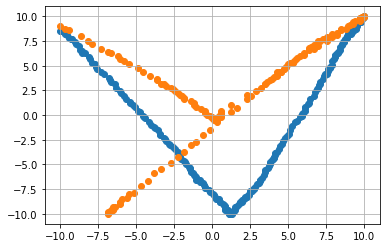

Coeff of V0 :  236.77724760892673
Coeff of Y0_test :  120.89855183715876
Coeff of V1 :  1062.2628769451064
Coeff of Y1_test :  827.7485841209242
Coeff of V2 :  -718.5883987446755
Coeff of Y2_test :  -358.7235004998596


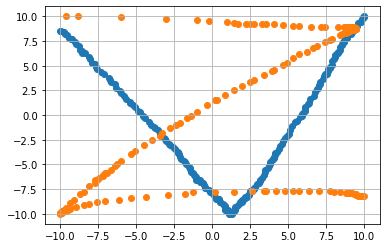

Coeff of V0 :  236.77724760892673
Coeff of Z0_test :  165.25315292561243
Coeff of V1 :  1062.2628769451064
Coeff of Z1_test :  1145.1837448016436
Coeff of V2 :  -718.5883987446755
Coeff of Z2_test :  -1023.0387527418625


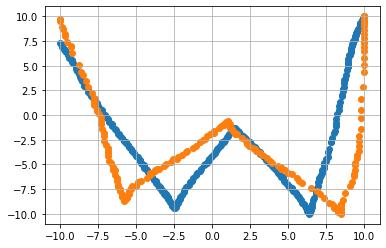

Coeff of W0 :  251.5646639781338
Coeff of W0_test :  236.11100211897917
Coeff of W1 :  1069.8718924808982
Coeff of W1_test :  1076.9716438337794
Coeff of W2 :  -929.6315734666927
Coeff of W2_test :  -1028.1655377026354


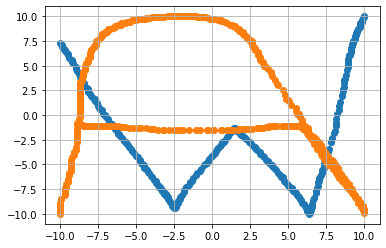

Coeff of W0 :  251.5646639781338
Coeff of A0_test :  295.75212444547986
Coeff of W1 :  1069.8718924808982
Coeff of A1_test :  1167.8748903146416
Coeff of W2 :  -929.6315734666927
Coeff of A2_test :  -833.8149325892592


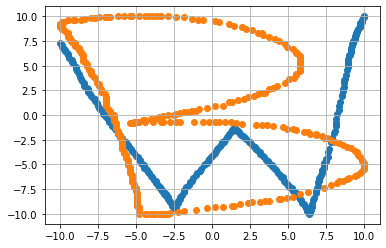

Coeff of W0 :  251.5646639781338
Coeff of B0_test :  259.0953261510756
Coeff of W1 :  1069.8718924808982
Coeff of B1_test :  1079.4803944623545
Coeff of W2 :  -929.6315734666927
Coeff of B2_test :  -967.0156291299161


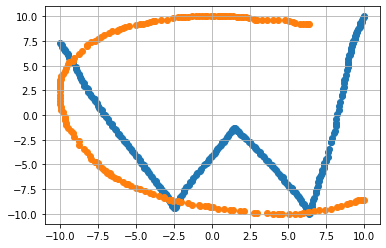

Coeff of W0 :  251.5646639781338
Coeff of C0_test :  303.33333558039624
Coeff of W1 :  1069.8718924808982
Coeff of C1_test :  1324.1760920437448
Coeff of W2 :  -929.6315734666927
Coeff of C2_test :  -1185.8005411694767


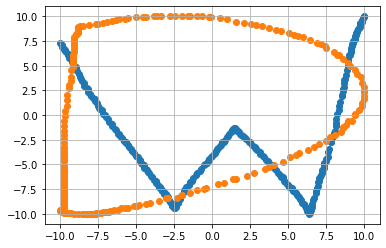

Coeff of W0 :  251.5646639781338
Coeff of D0_test :  258.43618154195667
Coeff of W1 :  1069.8718924808982
Coeff of D1_test :  1320.6773231749596
Coeff of W2 :  -929.6315734666927
Coeff of D2_test :  -1422.3196127785307


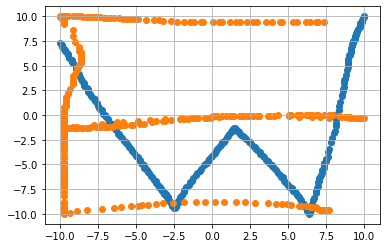

Coeff of W0 :  251.5646639781338
Coeff of E0_test :  265.84587396695025
Coeff of W1 :  1069.8718924808982
Coeff of E1_test :  1153.4052496110676
Coeff of W2 :  -929.6315734666927
Coeff of E2_test :  -1169.2190472063774


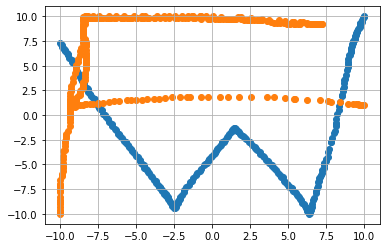

Coeff of W0 :  251.5646639781338
Coeff of F0_test :  303.2106574863934
Coeff of W1 :  1069.8718924808982
Coeff of F1_test :  1311.714510611808
Coeff of W2 :  -929.6315734666927
Coeff of F2_test :  -905.8068476262688


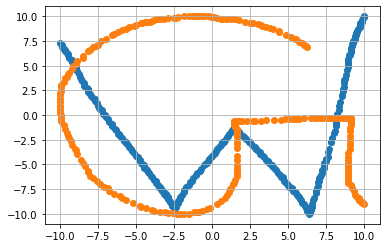

Coeff of W0 :  251.5646639781338
Coeff of G0_test :  287.81806338658964
Coeff of W1 :  1069.8718924808982
Coeff of G1_test :  1184.13016369023
Coeff of W2 :  -929.6315734666927
Coeff of G2_test :  -889.6157584280653


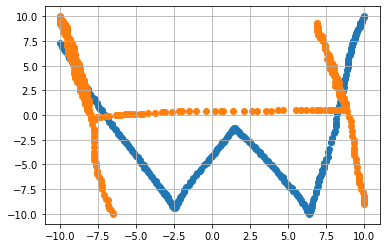

Coeff of W0 :  251.5646639781338
Coeff of H0_test :  274.7281613651508
Coeff of W1 :  1069.8718924808982
Coeff of H1_test :  1207.5890377110502
Coeff of W2 :  -929.6315734666927
Coeff of H2_test :  -835.9788200672382


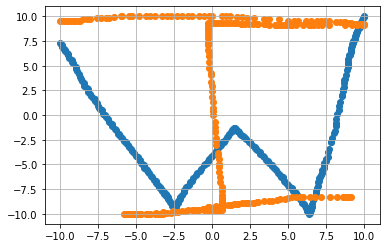

Coeff of W0 :  251.5646639781338
Coeff of I0_test :  270.69151720540685
Coeff of W1 :  1069.8718924808982
Coeff of I1_test :  1241.1484099097927
Coeff of W2 :  -929.6315734666927
Coeff of I2_test :  -812.2991068471923


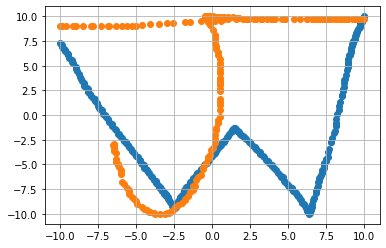

Coeff of W0 :  251.5646639781338
Coeff of J0_test :  221.45118729813638
Coeff of W1 :  1069.8718924808982
Coeff of J1_test :  1126.8306481468614
Coeff of W2 :  -929.6315734666927
Coeff of J2_test :  -566.7243542000019


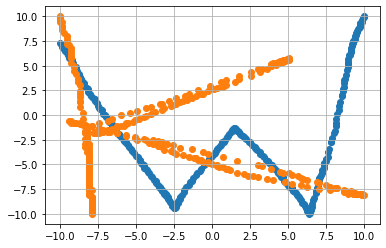

Coeff of W0 :  251.5646639781338
Coeff of K0_test :  225.27417960061194
Coeff of W1 :  1069.8718924808982
Coeff of K1_test :  1019.6317748186923
Coeff of W2 :  -929.6315734666927
Coeff of K2_test :  -1304.4310580413776


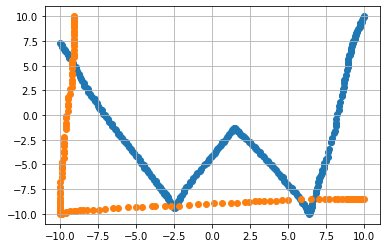

Coeff of W0 :  251.5646639781338
Coeff of l0_test :  285.9043978519215
Coeff of W1 :  1069.8718924808982
Coeff of l1_test :  1422.5570081418418
Coeff of W2 :  -929.6315734666927
Coeff of l2_test :  -2018.5060264647684


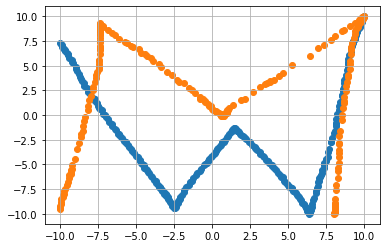

Coeff of W0 :  251.5646639781338
Coeff of M0_test :  214.10803634567756
Coeff of W1 :  1069.8718924808982
Coeff of M1_test :  1089.6741001583043
Coeff of W2 :  -929.6315734666927
Coeff of M2_test :  -629.8972346564841


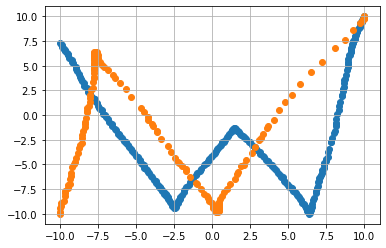

Coeff of W0 :  251.5646639781338
Coeff of N0_test :  243.10505698081576
Coeff of W1 :  1069.8718924808982
Coeff of N1_test :  1105.8386136599713
Coeff of W2 :  -929.6315734666927
Coeff of N2_test :  -1310.925127662746


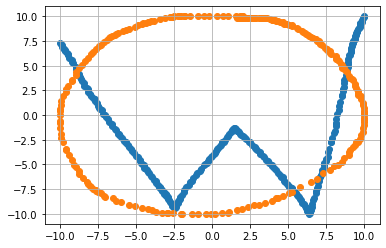

Coeff of W0 :  251.5646639781338
Coeff of O0_test :  269.7623165120487
Coeff of W1 :  1069.8718924808982
Coeff of O1_test :  1282.249724789818
Coeff of W2 :  -929.6315734666927
Coeff of O2_test :  -717.4726016993875


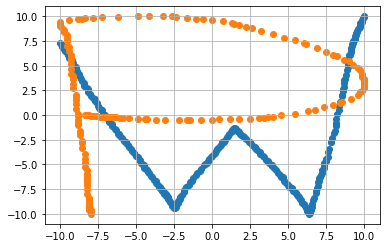

Coeff of W0 :  251.5646639781338
Coeff of P0_test :  253.9459355754082
Coeff of W1 :  1069.8718924808982
Coeff of P1_test :  1164.824965942085
Coeff of W2 :  -929.6315734666927
Coeff of P2_test :  -989.6196113536425


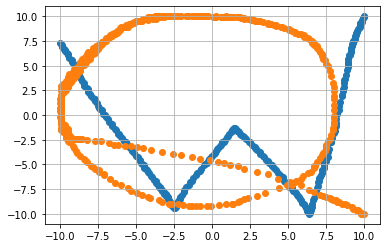

Coeff of W0 :  251.5646639781338
Coeff of Q0_test :  305.04450712852395
Coeff of W1 :  1069.8718924808982
Coeff of Q1_test :  1276.4719466447903
Coeff of W2 :  -929.6315734666927
Coeff of Q2_test :  -995.8869849547273


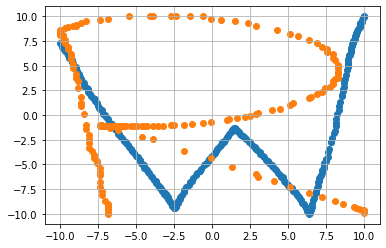

Coeff of W0 :  251.5646639781338
Coeff of R0_test :  254.8594941303752
Coeff of W1 :  1069.8718924808982
Coeff of R1_test :  1124.5862399648388
Coeff of W2 :  -929.6315734666927
Coeff of R2_test :  -992.1013853714055


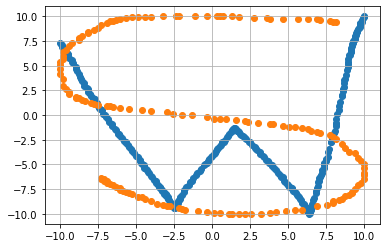

Coeff of W0 :  251.5646639781338
Coeff of S0_test :  290.8544314933228
Coeff of W1 :  1069.8718924808982
Coeff of S1_test :  1226.8256899731539
Coeff of W2 :  -929.6315734666927
Coeff of S2_test :  -1063.3894728687897


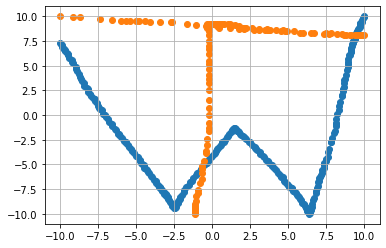

Coeff of W0 :  251.5646639781338
Coeff of T0_test :  236.43423922900277
Coeff of W1 :  1069.8718924808982
Coeff of T1_test :  1121.3978887350374
Coeff of W2 :  -929.6315734666927
Coeff of T2_test :  -220.72383321871104


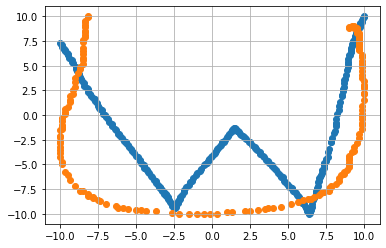

Coeff of W0 :  251.5646639781338
Coeff of U0_test :  275.3156630172093
Coeff of W1 :  1069.8718924808982
Coeff of U1_test :  1361.5579794263167
Coeff of W2 :  -929.6315734666927
Coeff of U2_test :  -1039.933347800673


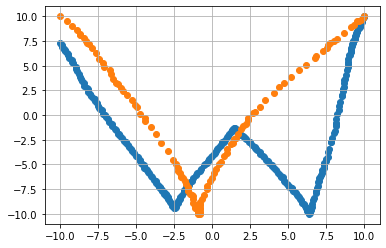

Coeff of W0 :  251.5646639781338
Coeff of V0_test :  225.07537052980817
Coeff of W1 :  1069.8718924808982
Coeff of V1_test :  993.1652737688586
Coeff of W2 :  -929.6315734666927
Coeff of V2_test :  -888.3002255901538


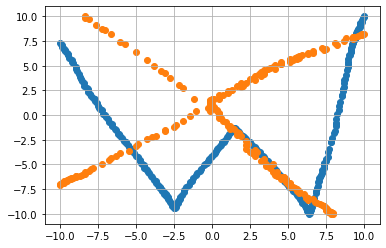

Coeff of W0 :  251.5646639781338
Coeff of X0_test :  202.9950320276672
Coeff of W1 :  1069.8718924808982
Coeff of X1_test :  921.5927592848752
Coeff of W2 :  -929.6315734666927
Coeff of X2_test :  -664.5155167433047


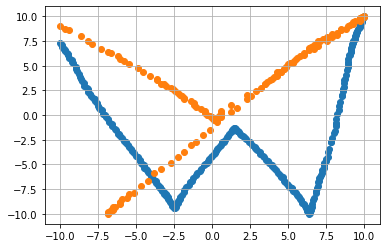

Coeff of W0 :  251.5646639781338
Coeff of Y0_test :  120.89855183715876
Coeff of W1 :  1069.8718924808982
Coeff of Y1_test :  827.7485841209242
Coeff of W2 :  -929.6315734666927
Coeff of Y2_test :  -358.7235004998596


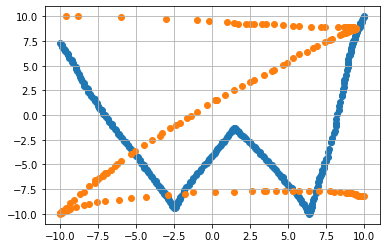

Coeff of W0 :  251.5646639781338
Coeff of Z0_test :  165.25315292561243
Coeff of W1 :  1069.8718924808982
Coeff of Z1_test :  1145.1837448016436
Coeff of W2 :  -929.6315734666927
Coeff of Z2_test :  -1023.0387527418625


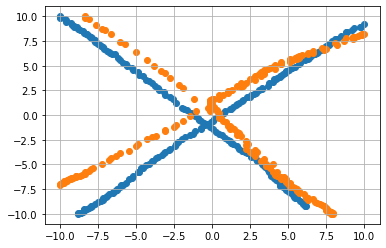

Coeff of X0 :  188.93909719245914
Coeff of X0_test :  202.9950320276672
Coeff of X1 :  923.866504039504
Coeff of X1_test :  921.5927592848752
Coeff of X2 :  -821.7154486731516
Coeff of X2_test :  -664.5155167433047


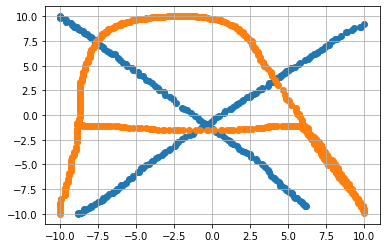

Coeff of X0 :  188.93909719245914
Coeff of A0_test :  295.75212444547986
Coeff of X1 :  923.866504039504
Coeff of A1_test :  1167.8748903146416
Coeff of X2 :  -821.7154486731516
Coeff of A2_test :  -833.8149325892592


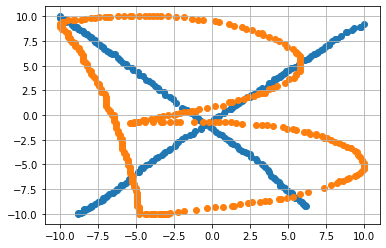

Coeff of X0 :  188.93909719245914
Coeff of B0_test :  259.0953261510756
Coeff of X1 :  923.866504039504
Coeff of B1_test :  1079.4803944623545
Coeff of X2 :  -821.7154486731516
Coeff of B2_test :  -967.0156291299161


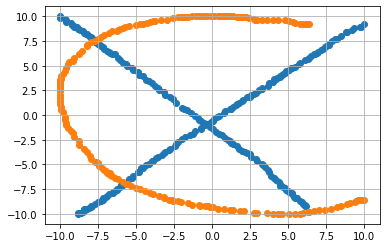

Coeff of X0 :  188.93909719245914
Coeff of C0_test :  303.33333558039624
Coeff of X1 :  923.866504039504
Coeff of C1_test :  1324.1760920437448
Coeff of X2 :  -821.7154486731516
Coeff of C2_test :  -1185.8005411694767


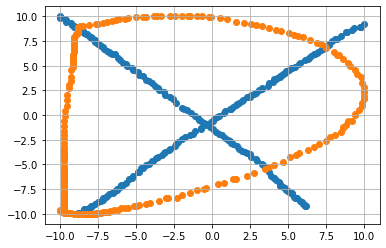

Coeff of X0 :  188.93909719245914
Coeff of D0_test :  258.43618154195667
Coeff of X1 :  923.866504039504
Coeff of D1_test :  1320.6773231749596
Coeff of X2 :  -821.7154486731516
Coeff of D2_test :  -1422.3196127785307


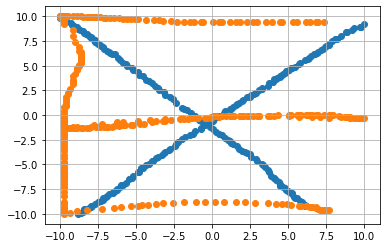

Coeff of X0 :  188.93909719245914
Coeff of E0_test :  265.84587396695025
Coeff of X1 :  923.866504039504
Coeff of E1_test :  1153.4052496110676
Coeff of X2 :  -821.7154486731516
Coeff of E2_test :  -1169.2190472063774


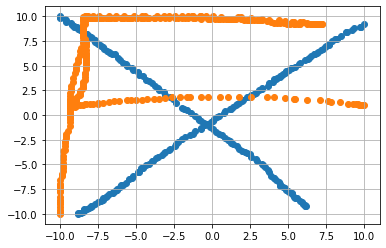

Coeff of X0 :  188.93909719245914
Coeff of F0_test :  303.2106574863934
Coeff of X1 :  923.866504039504
Coeff of F1_test :  1311.714510611808
Coeff of X2 :  -821.7154486731516
Coeff of F2_test :  -905.8068476262688


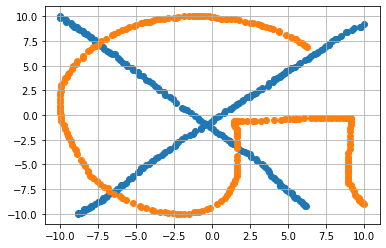

Coeff of X0 :  188.93909719245914
Coeff of G0_test :  287.81806338658964
Coeff of X1 :  923.866504039504
Coeff of G1_test :  1184.13016369023
Coeff of X2 :  -821.7154486731516
Coeff of G2_test :  -889.6157584280653


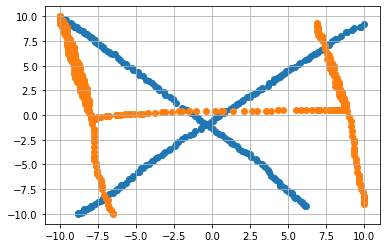

Coeff of X0 :  188.93909719245914
Coeff of H0_test :  274.7281613651508
Coeff of X1 :  923.866504039504
Coeff of H1_test :  1207.5890377110502
Coeff of X2 :  -821.7154486731516
Coeff of H2_test :  -835.9788200672382


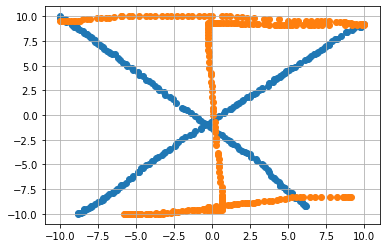

Coeff of X0 :  188.93909719245914
Coeff of I0_test :  270.69151720540685
Coeff of X1 :  923.866504039504
Coeff of I1_test :  1241.1484099097927
Coeff of X2 :  -821.7154486731516
Coeff of I2_test :  -812.2991068471923


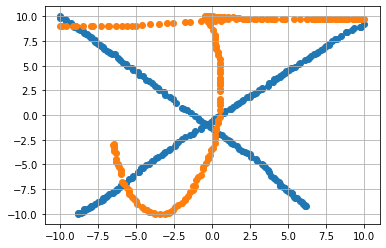

Coeff of X0 :  188.93909719245914
Coeff of J0_test :  221.45118729813638
Coeff of X1 :  923.866504039504
Coeff of J1_test :  1126.8306481468614
Coeff of X2 :  -821.7154486731516
Coeff of J2_test :  -566.7243542000019


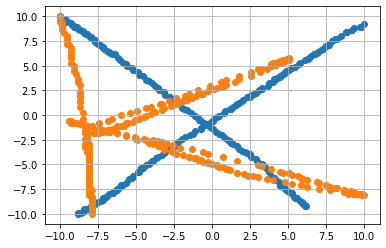

Coeff of X0 :  188.93909719245914
Coeff of K0_test :  225.27417960061194
Coeff of X1 :  923.866504039504
Coeff of K1_test :  1019.6317748186923
Coeff of X2 :  -821.7154486731516
Coeff of K2_test :  -1304.4310580413776


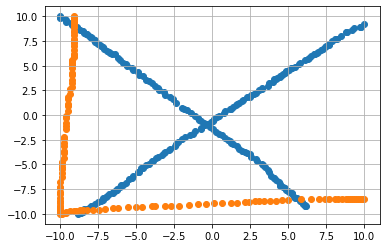

Coeff of X0 :  188.93909719245914
Coeff of l0_test :  285.9043978519215
Coeff of X1 :  923.866504039504
Coeff of l1_test :  1422.5570081418418
Coeff of X2 :  -821.7154486731516
Coeff of l2_test :  -2018.5060264647684


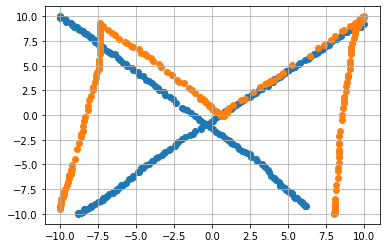

Coeff of X0 :  188.93909719245914
Coeff of M0_test :  214.10803634567756
Coeff of X1 :  923.866504039504
Coeff of M1_test :  1089.6741001583043
Coeff of X2 :  -821.7154486731516
Coeff of M2_test :  -629.8972346564841


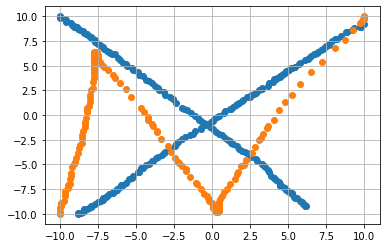

Coeff of X0 :  188.93909719245914
Coeff of N0_test :  243.10505698081576
Coeff of X1 :  923.866504039504
Coeff of N1_test :  1105.8386136599713
Coeff of X2 :  -821.7154486731516
Coeff of N2_test :  -1310.925127662746


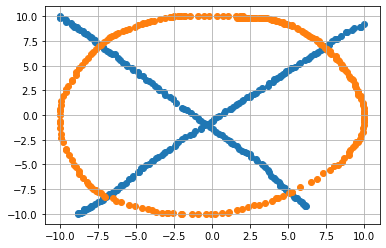

Coeff of X0 :  188.93909719245914
Coeff of O0_test :  269.7623165120487
Coeff of X1 :  923.866504039504
Coeff of O1_test :  1282.249724789818
Coeff of X2 :  -821.7154486731516
Coeff of O2_test :  -717.4726016993875


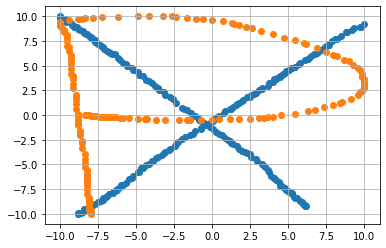

Coeff of X0 :  188.93909719245914
Coeff of P0_test :  253.9459355754082
Coeff of X1 :  923.866504039504
Coeff of P1_test :  1164.824965942085
Coeff of X2 :  -821.7154486731516
Coeff of P2_test :  -989.6196113536425


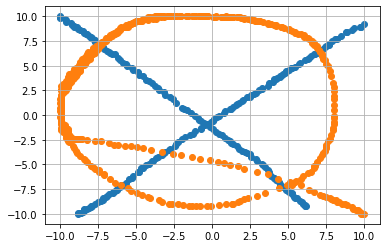

Coeff of X0 :  188.93909719245914
Coeff of Q0_test :  305.04450712852395
Coeff of X1 :  923.866504039504
Coeff of Q1_test :  1276.4719466447903
Coeff of X2 :  -821.7154486731516
Coeff of Q2_test :  -995.8869849547273


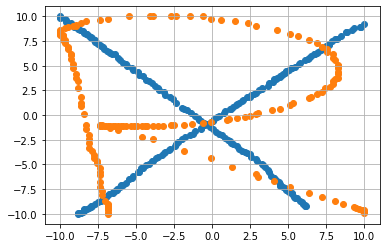

Coeff of X0 :  188.93909719245914
Coeff of R0_test :  254.8594941303752
Coeff of X1 :  923.866504039504
Coeff of R1_test :  1124.5862399648388
Coeff of X2 :  -821.7154486731516
Coeff of R2_test :  -992.1013853714055


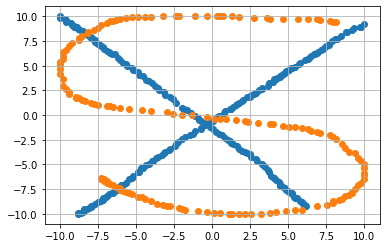

Coeff of X0 :  188.93909719245914
Coeff of S0_test :  290.8544314933228
Coeff of X1 :  923.866504039504
Coeff of S1_test :  1226.8256899731539
Coeff of X2 :  -821.7154486731516
Coeff of S2_test :  -1063.3894728687897


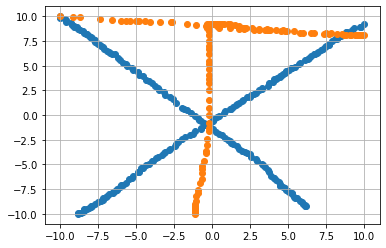

Coeff of X0 :  188.93909719245914
Coeff of T0_test :  236.43423922900277
Coeff of X1 :  923.866504039504
Coeff of T1_test :  1121.3978887350374
Coeff of X2 :  -821.7154486731516
Coeff of T2_test :  -220.72383321871104


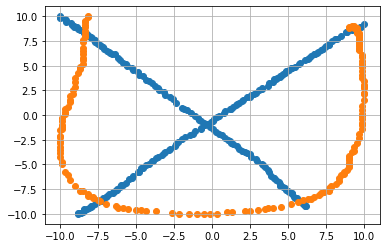

Coeff of X0 :  188.93909719245914
Coeff of U0_test :  275.3156630172093
Coeff of X1 :  923.866504039504
Coeff of U1_test :  1361.5579794263167
Coeff of X2 :  -821.7154486731516
Coeff of U2_test :  -1039.933347800673


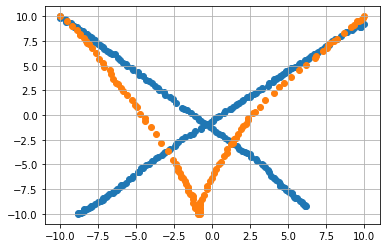

Coeff of X0 :  188.93909719245914
Coeff of V0_test :  225.07537052980817
Coeff of X1 :  923.866504039504
Coeff of V1_test :  993.1652737688586
Coeff of X2 :  -821.7154486731516
Coeff of V2_test :  -888.3002255901538


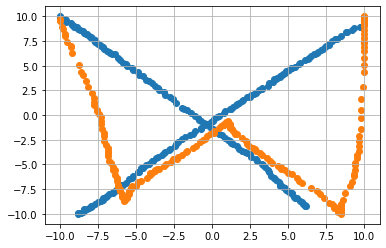

Coeff of X0 :  188.93909719245914
Coeff of W0_test :  236.11100211897917
Coeff of X1 :  923.866504039504
Coeff of W1_test :  1076.9716438337794
Coeff of X2 :  -821.7154486731516
Coeff of W2_test :  -1028.1655377026354


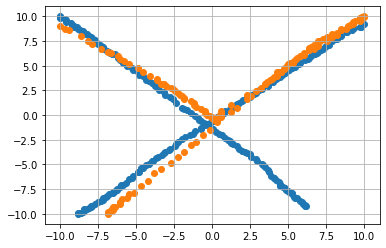

Coeff of X0 :  188.93909719245914
Coeff of Y0_test :  120.89855183715876
Coeff of X1 :  923.866504039504
Coeff of Y1_test :  827.7485841209242
Coeff of X2 :  -821.7154486731516
Coeff of Y2_test :  -358.7235004998596


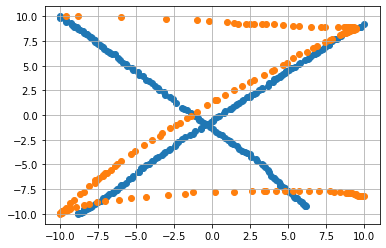

Coeff of X0 :  188.93909719245914
Coeff of Z0_test :  165.25315292561243
Coeff of X1 :  923.866504039504
Coeff of Z1_test :  1145.1837448016436
Coeff of X2 :  -821.7154486731516
Coeff of Z2_test :  -1023.0387527418625


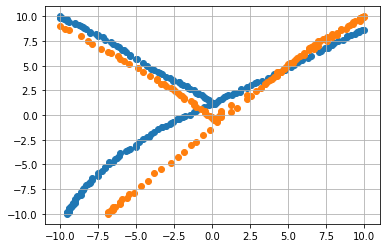

Coeff of Y0 :  170.1536579438614
Coeff of Y0_test :  120.89855183715876
Coeff of Y1 :  924.4245129685428
Coeff of Y1_test :  827.7485841209242
Coeff of Y2 :  -897.6184398308801
Coeff of Y2_test :  -358.7235004998596


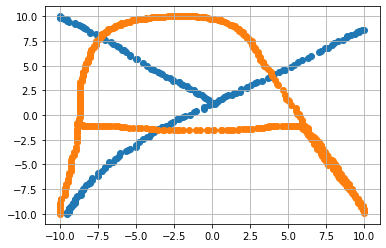

Coeff of Y0 :  170.1536579438614
Coeff of A0_test :  295.75212444547986
Coeff of Y1 :  924.4245129685428
Coeff of A1_test :  1167.8748903146416
Coeff of Y2 :  -897.6184398308801
Coeff of A2_test :  -833.8149325892592


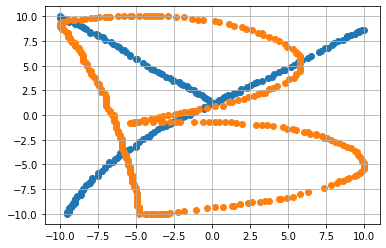

Coeff of Y0 :  170.1536579438614
Coeff of B0_test :  259.0953261510756
Coeff of Y1 :  924.4245129685428
Coeff of B1_test :  1079.4803944623545
Coeff of Y2 :  -897.6184398308801
Coeff of B2_test :  -967.0156291299161


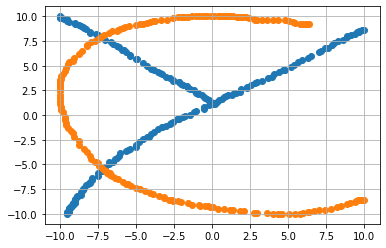

Coeff of Y0 :  170.1536579438614
Coeff of C0_test :  303.33333558039624
Coeff of Y1 :  924.4245129685428
Coeff of C1_test :  1324.1760920437448
Coeff of Y2 :  -897.6184398308801
Coeff of C2_test :  -1185.8005411694767


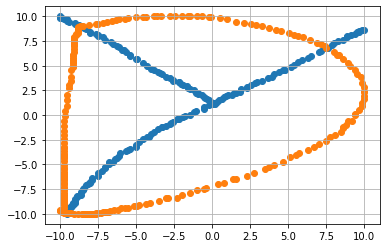

Coeff of Y0 :  170.1536579438614
Coeff of D0_test :  258.43618154195667
Coeff of Y1 :  924.4245129685428
Coeff of D1_test :  1320.6773231749596
Coeff of Y2 :  -897.6184398308801
Coeff of D2_test :  -1422.3196127785307


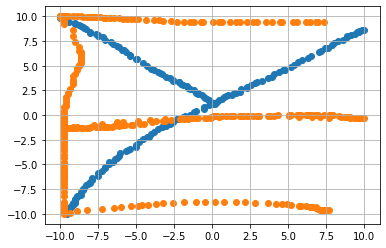

Coeff of Y0 :  170.1536579438614
Coeff of E0_test :  265.84587396695025
Coeff of Y1 :  924.4245129685428
Coeff of E1_test :  1153.4052496110676
Coeff of Y2 :  -897.6184398308801
Coeff of E2_test :  -1169.2190472063774


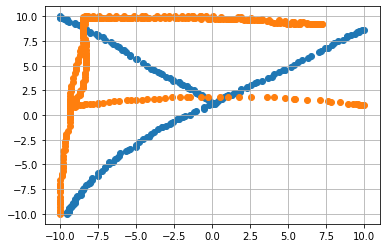

Coeff of Y0 :  170.1536579438614
Coeff of F0_test :  303.2106574863934
Coeff of Y1 :  924.4245129685428
Coeff of F1_test :  1311.714510611808
Coeff of Y2 :  -897.6184398308801
Coeff of F2_test :  -905.8068476262688


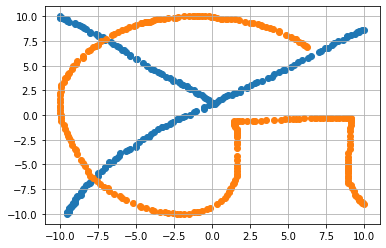

Coeff of Y0 :  170.1536579438614
Coeff of G0_test :  287.81806338658964
Coeff of Y1 :  924.4245129685428
Coeff of G1_test :  1184.13016369023
Coeff of Y2 :  -897.6184398308801
Coeff of G2_test :  -889.6157584280653


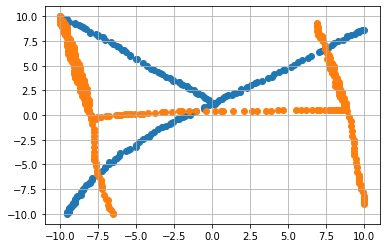

Coeff of Y0 :  170.1536579438614
Coeff of H0_test :  274.7281613651508
Coeff of Y1 :  924.4245129685428
Coeff of H1_test :  1207.5890377110502
Coeff of Y2 :  -897.6184398308801
Coeff of H2_test :  -835.9788200672382


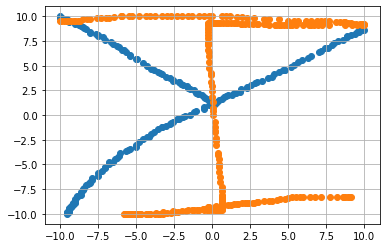

Coeff of Y0 :  170.1536579438614
Coeff of I0_test :  270.69151720540685
Coeff of Y1 :  924.4245129685428
Coeff of I1_test :  1241.1484099097927
Coeff of Y2 :  -897.6184398308801
Coeff of I2_test :  -812.2991068471923


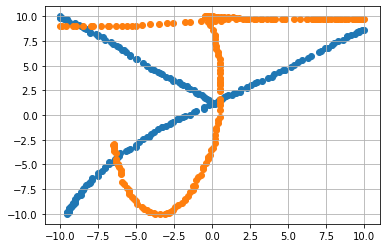

Coeff of Y0 :  170.1536579438614
Coeff of J0_test :  221.45118729813638
Coeff of Y1 :  924.4245129685428
Coeff of J1_test :  1126.8306481468614
Coeff of Y2 :  -897.6184398308801
Coeff of J2_test :  -566.7243542000019


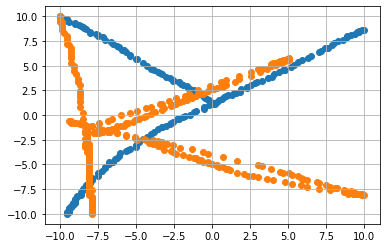

Coeff of Y0 :  170.1536579438614
Coeff of K0_test :  225.27417960061194
Coeff of Y1 :  924.4245129685428
Coeff of K1_test :  1019.6317748186923
Coeff of Y2 :  -897.6184398308801
Coeff of K2_test :  -1304.4310580413776


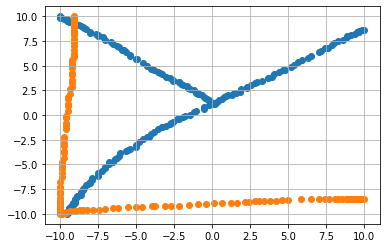

Coeff of Y0 :  170.1536579438614
Coeff of l0_test :  285.9043978519215
Coeff of Y1 :  924.4245129685428
Coeff of l1_test :  1422.5570081418418
Coeff of Y2 :  -897.6184398308801
Coeff of l2_test :  -2018.5060264647684


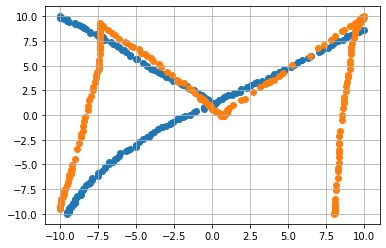

Coeff of Y0 :  170.1536579438614
Coeff of M0_test :  214.10803634567756
Coeff of Y1 :  924.4245129685428
Coeff of M1_test :  1089.6741001583043
Coeff of Y2 :  -897.6184398308801
Coeff of M2_test :  -629.8972346564841


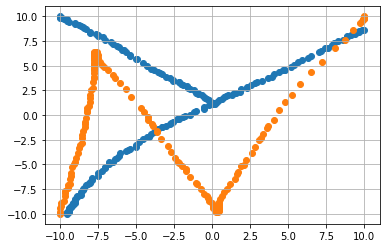

Coeff of Y0 :  170.1536579438614
Coeff of N0_test :  243.10505698081576
Coeff of Y1 :  924.4245129685428
Coeff of N1_test :  1105.8386136599713
Coeff of Y2 :  -897.6184398308801
Coeff of N2_test :  -1310.925127662746


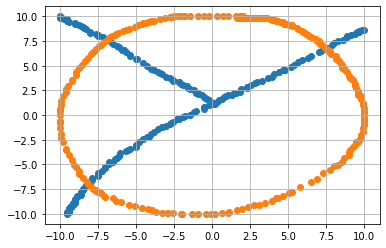

Coeff of Y0 :  170.1536579438614
Coeff of O0_test :  269.7623165120487
Coeff of Y1 :  924.4245129685428
Coeff of O1_test :  1282.249724789818
Coeff of Y2 :  -897.6184398308801
Coeff of O2_test :  -717.4726016993875


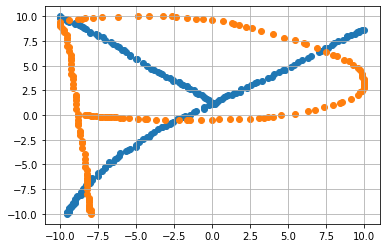

Coeff of Y0 :  170.1536579438614
Coeff of P0_test :  253.9459355754082
Coeff of Y1 :  924.4245129685428
Coeff of P1_test :  1164.824965942085
Coeff of Y2 :  -897.6184398308801
Coeff of P2_test :  -989.6196113536425


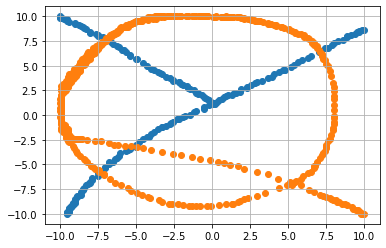

Coeff of Y0 :  170.1536579438614
Coeff of Q0_test :  305.04450712852395
Coeff of Y1 :  924.4245129685428
Coeff of Q1_test :  1276.4719466447903
Coeff of Y2 :  -897.6184398308801
Coeff of Q2_test :  -995.8869849547273


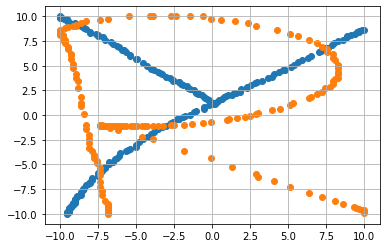

Coeff of Y0 :  170.1536579438614
Coeff of R0_test :  254.8594941303752
Coeff of Y1 :  924.4245129685428
Coeff of R1_test :  1124.5862399648388
Coeff of Y2 :  -897.6184398308801
Coeff of R2_test :  -992.1013853714055


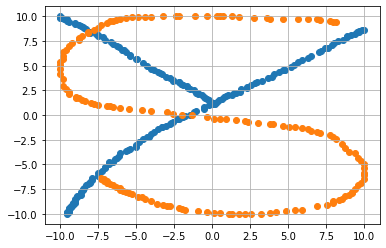

Coeff of Y0 :  170.1536579438614
Coeff of S0_test :  290.8544314933228
Coeff of Y1 :  924.4245129685428
Coeff of S1_test :  1226.8256899731539
Coeff of Y2 :  -897.6184398308801
Coeff of S2_test :  -1063.3894728687897


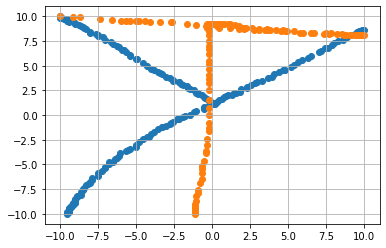

Coeff of Y0 :  170.1536579438614
Coeff of T0_test :  236.43423922900277
Coeff of Y1 :  924.4245129685428
Coeff of T1_test :  1121.3978887350374
Coeff of Y2 :  -897.6184398308801
Coeff of T2_test :  -220.72383321871104


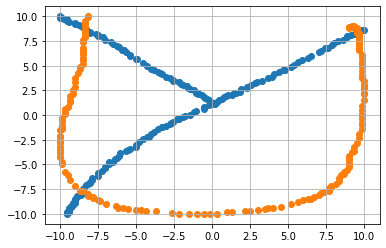

Coeff of Y0 :  170.1536579438614
Coeff of U0_test :  275.3156630172093
Coeff of Y1 :  924.4245129685428
Coeff of U1_test :  1361.5579794263167
Coeff of Y2 :  -897.6184398308801
Coeff of U2_test :  -1039.933347800673


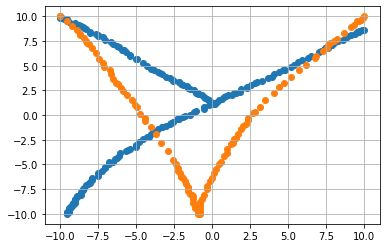

Coeff of Y0 :  170.1536579438614
Coeff of V0_test :  225.07537052980817
Coeff of Y1 :  924.4245129685428
Coeff of V1_test :  993.1652737688586
Coeff of Y2 :  -897.6184398308801
Coeff of V2_test :  -888.3002255901538


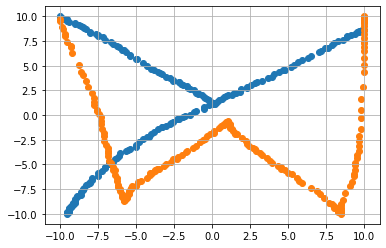

Coeff of Y0 :  170.1536579438614
Coeff of W0_test :  236.11100211897917
Coeff of Y1 :  924.4245129685428
Coeff of W1_test :  1076.9716438337794
Coeff of Y2 :  -897.6184398308801
Coeff of W2_test :  -1028.1655377026354


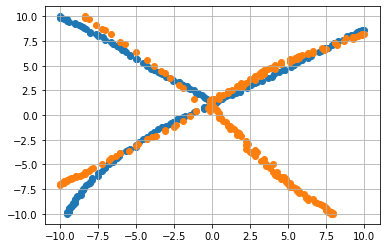

Coeff of Y0 :  170.1536579438614
Coeff of X0_test :  202.9950320276672
Coeff of Y1 :  924.4245129685428
Coeff of X1_test :  921.5927592848752
Coeff of Y2 :  -897.6184398308801
Coeff of X2_test :  -664.5155167433047


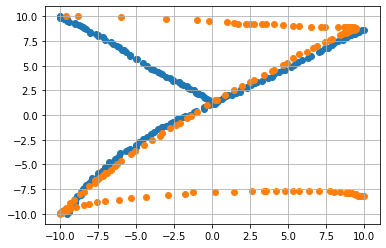

Coeff of Y0 :  170.1536579438614
Coeff of Z0_test :  165.25315292561243
Coeff of Y1 :  924.4245129685428
Coeff of Z1_test :  1145.1837448016436
Coeff of Y2 :  -897.6184398308801
Coeff of Z2_test :  -1023.0387527418625


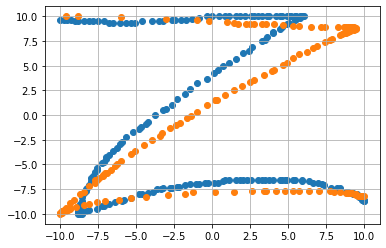

Coeff of Z0 :  254.22442112076354
Coeff of Z0_test :  165.25315292561243
Coeff of Z1 :  1206.1691145314765
Coeff of Z1_test :  1145.1837448016436
Coeff of Z2 :  -1085.4442190109214
Coeff of Z2_test :  -1023.0387527418625


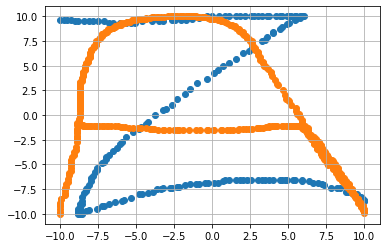

Coeff of Z0 :  254.22442112076354
Coeff of A0_test :  295.75212444547986
Coeff of Z1 :  1206.1691145314765
Coeff of A1_test :  1167.8748903146416
Coeff of Z2 :  -1085.4442190109214
Coeff of A2_test :  -833.8149325892592


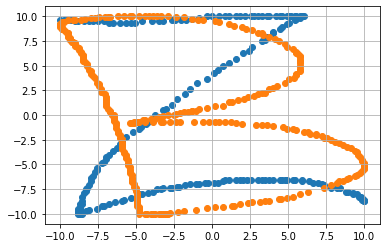

Coeff of Z0 :  254.22442112076354
Coeff of B0_test :  259.0953261510756
Coeff of Z1 :  1206.1691145314765
Coeff of B1_test :  1079.4803944623545
Coeff of Z2 :  -1085.4442190109214
Coeff of B2_test :  -967.0156291299161


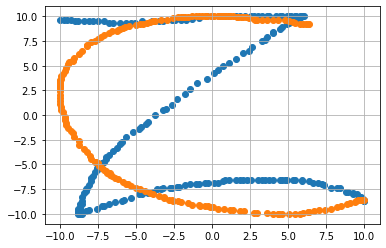

Coeff of Z0 :  254.22442112076354
Coeff of C0_test :  303.33333558039624
Coeff of Z1 :  1206.1691145314765
Coeff of C1_test :  1324.1760920437448
Coeff of Z2 :  -1085.4442190109214
Coeff of C2_test :  -1185.8005411694767


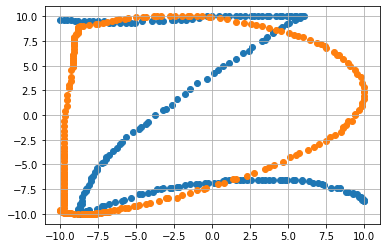

Coeff of Z0 :  254.22442112076354
Coeff of D0_test :  258.43618154195667
Coeff of Z1 :  1206.1691145314765
Coeff of D1_test :  1320.6773231749596
Coeff of Z2 :  -1085.4442190109214
Coeff of D2_test :  -1422.3196127785307


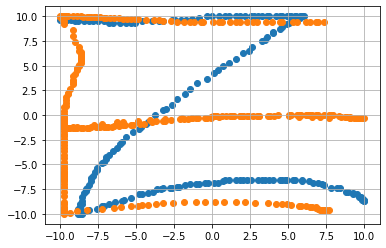

Coeff of Z0 :  254.22442112076354
Coeff of E0_test :  265.84587396695025
Coeff of Z1 :  1206.1691145314765
Coeff of E1_test :  1153.4052496110676
Coeff of Z2 :  -1085.4442190109214
Coeff of E2_test :  -1169.2190472063774


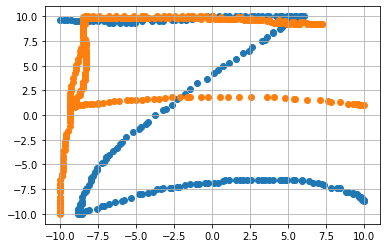

Coeff of Z0 :  254.22442112076354
Coeff of F0_test :  303.2106574863934
Coeff of Z1 :  1206.1691145314765
Coeff of F1_test :  1311.714510611808
Coeff of Z2 :  -1085.4442190109214
Coeff of F2_test :  -905.8068476262688


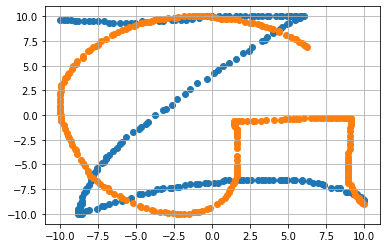

Coeff of Z0 :  254.22442112076354
Coeff of G0_test :  287.81806338658964
Coeff of Z1 :  1206.1691145314765
Coeff of G1_test :  1184.13016369023
Coeff of Z2 :  -1085.4442190109214
Coeff of G2_test :  -889.6157584280653


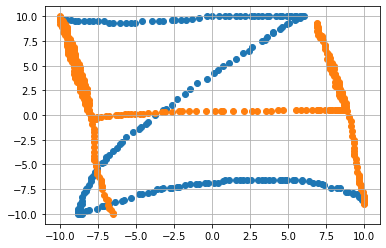

Coeff of Z0 :  254.22442112076354
Coeff of H0_test :  274.7281613651508
Coeff of Z1 :  1206.1691145314765
Coeff of H1_test :  1207.5890377110502
Coeff of Z2 :  -1085.4442190109214
Coeff of H2_test :  -835.9788200672382


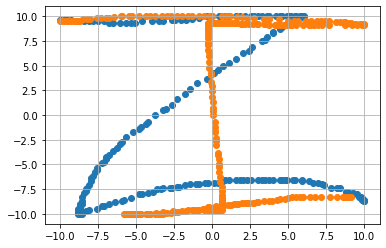

Coeff of Z0 :  254.22442112076354
Coeff of I0_test :  270.69151720540685
Coeff of Z1 :  1206.1691145314765
Coeff of I1_test :  1241.1484099097927
Coeff of Z2 :  -1085.4442190109214
Coeff of I2_test :  -812.2991068471923


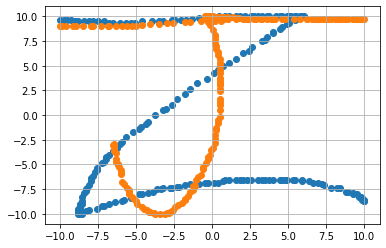

Coeff of Z0 :  254.22442112076354
Coeff of J0_test :  221.45118729813638
Coeff of Z1 :  1206.1691145314765
Coeff of J1_test :  1126.8306481468614
Coeff of Z2 :  -1085.4442190109214
Coeff of J2_test :  -566.7243542000019


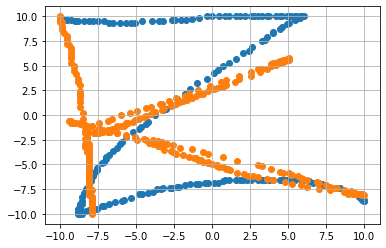

Coeff of Z0 :  254.22442112076354
Coeff of K0_test :  225.27417960061194
Coeff of Z1 :  1206.1691145314765
Coeff of K1_test :  1019.6317748186923
Coeff of Z2 :  -1085.4442190109214
Coeff of K2_test :  -1304.4310580413776


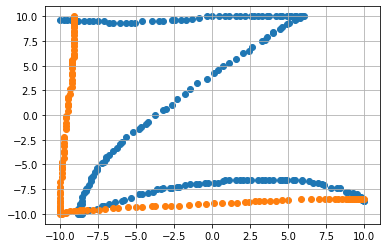

Coeff of Z0 :  254.22442112076354
Coeff of l0_test :  285.9043978519215
Coeff of Z1 :  1206.1691145314765
Coeff of l1_test :  1422.5570081418418
Coeff of Z2 :  -1085.4442190109214
Coeff of l2_test :  -2018.5060264647684


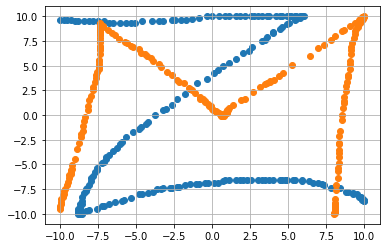

Coeff of Z0 :  254.22442112076354
Coeff of M0_test :  214.10803634567756
Coeff of Z1 :  1206.1691145314765
Coeff of M1_test :  1089.6741001583043
Coeff of Z2 :  -1085.4442190109214
Coeff of M2_test :  -629.8972346564841


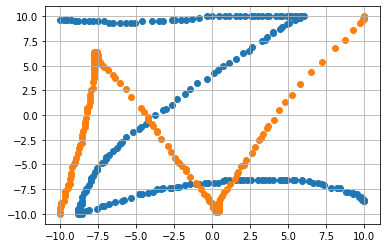

Coeff of Z0 :  254.22442112076354
Coeff of N0_test :  243.10505698081576
Coeff of Z1 :  1206.1691145314765
Coeff of N1_test :  1105.8386136599713
Coeff of Z2 :  -1085.4442190109214
Coeff of N2_test :  -1310.925127662746


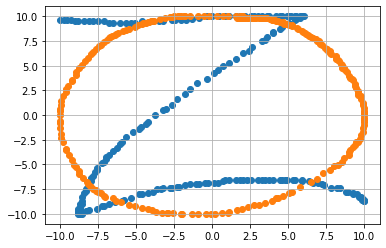

Coeff of Z0 :  254.22442112076354
Coeff of O0_test :  269.7623165120487
Coeff of Z1 :  1206.1691145314765
Coeff of O1_test :  1282.249724789818
Coeff of Z2 :  -1085.4442190109214
Coeff of O2_test :  -717.4726016993875


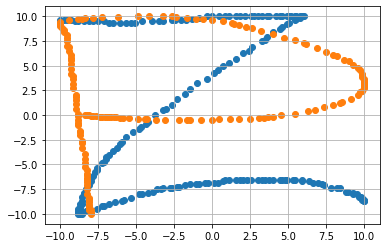

Coeff of Z0 :  254.22442112076354
Coeff of P0_test :  253.9459355754082
Coeff of Z1 :  1206.1691145314765
Coeff of P1_test :  1164.824965942085
Coeff of Z2 :  -1085.4442190109214
Coeff of P2_test :  -989.6196113536425


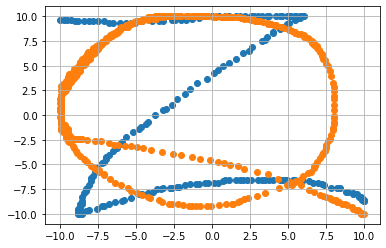

Coeff of Z0 :  254.22442112076354
Coeff of Q0_test :  305.04450712852395
Coeff of Z1 :  1206.1691145314765
Coeff of Q1_test :  1276.4719466447903
Coeff of Z2 :  -1085.4442190109214
Coeff of Q2_test :  -995.8869849547273


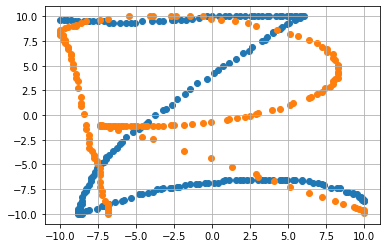

Coeff of Z0 :  254.22442112076354
Coeff of R0_test :  254.8594941303752
Coeff of Z1 :  1206.1691145314765
Coeff of R1_test :  1124.5862399648388
Coeff of Z2 :  -1085.4442190109214
Coeff of R2_test :  -992.1013853714055


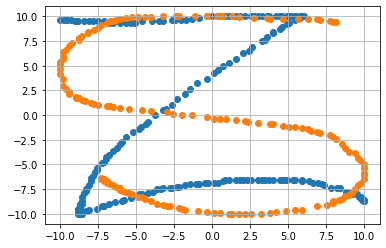

Coeff of Z0 :  254.22442112076354
Coeff of S0_test :  290.8544314933228
Coeff of Z1 :  1206.1691145314765
Coeff of S1_test :  1226.8256899731539
Coeff of Z2 :  -1085.4442190109214
Coeff of S2_test :  -1063.3894728687897


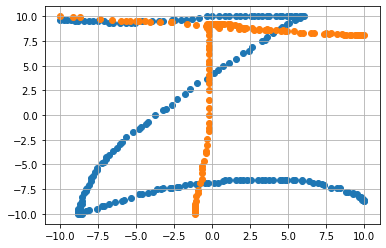

Coeff of Z0 :  254.22442112076354
Coeff of T0_test :  236.43423922900277
Coeff of Z1 :  1206.1691145314765
Coeff of T1_test :  1121.3978887350374
Coeff of Z2 :  -1085.4442190109214
Coeff of T2_test :  -220.72383321871104


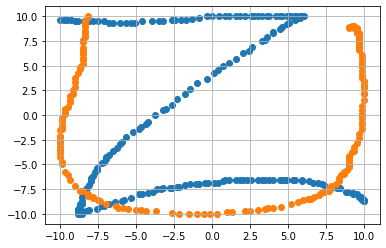

Coeff of Z0 :  254.22442112076354
Coeff of U0_test :  275.3156630172093
Coeff of Z1 :  1206.1691145314765
Coeff of U1_test :  1361.5579794263167
Coeff of Z2 :  -1085.4442190109214
Coeff of U2_test :  -1039.933347800673


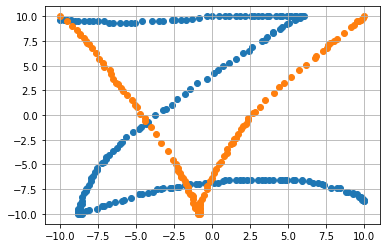

Coeff of Z0 :  254.22442112076354
Coeff of V0_test :  225.07537052980817
Coeff of Z1 :  1206.1691145314765
Coeff of V1_test :  993.1652737688586
Coeff of Z2 :  -1085.4442190109214
Coeff of V2_test :  -888.3002255901538


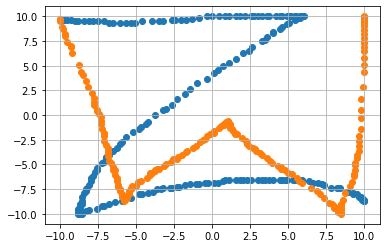

Coeff of Z0 :  254.22442112076354
Coeff of W0_test :  236.11100211897917
Coeff of Z1 :  1206.1691145314765
Coeff of W1_test :  1076.9716438337794
Coeff of Z2 :  -1085.4442190109214
Coeff of W2_test :  -1028.1655377026354


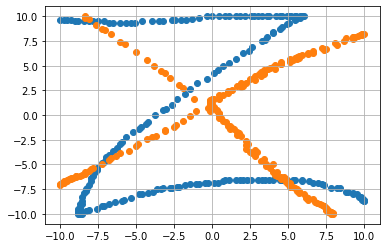

Coeff of Z0 :  254.22442112076354
Coeff of X0_test :  202.9950320276672
Coeff of Z1 :  1206.1691145314765
Coeff of X1_test :  921.5927592848752
Coeff of Z2 :  -1085.4442190109214
Coeff of X2_test :  -664.5155167433047


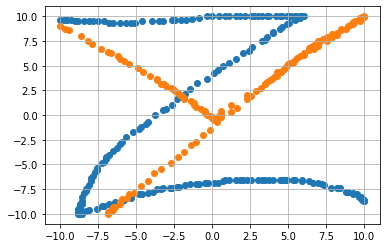

Coeff of Z0 :  254.22442112076354
Coeff of Y0_test :  120.89855183715876
Coeff of Z1 :  1206.1691145314765
Coeff of Y1_test :  827.7485841209242
Coeff of Z2 :  -1085.4442190109214
Coeff of Y2_test :  -358.7235004998596


In [15]:
for x in data_list:
    tup = data_list[x]
    value1  = tup[0][0],tup[0][1]
    value2 = tup[1][0],tup[1][1]
    plt.scatter(value1[0],value1[1])
    plt.scatter(value2[0],value2[1])
    plt.grid()
    plt.show()
    for i in range(3):
        print("Coeff of "+ x + str(i) +" : ",CoDistance(value1[0],value1[1],i))
        print("Coeff of "+ x + str(i) +"_test : ",CoDistance(value2[0],value2[1],i))
    
    for y in data_list:
        if (y != x):
            tup2 = data_list[y]
            value3  = tup2[1][0],tup2[1][1]
            plt.scatter(tup[0][0],tup[0][1])
            plt.scatter(tup2[1][0],tup2[1][1])
            plt.grid()
            plt.show()
            for i in range(3):
                print("Coeff of "+ x + str(i) +" : ",CoDistance(value1[0],value1[1],i))
                print("Coeff of "+ y + str(i) +"_test : ",CoDistance(value3[0],value3[1],i))

In [16]:
from sklearn.neighbors import KNeighborsClassifier

In [17]:
print(data_list["A"][0])

(0     -10.000000
1     -10.000000
2     -10.000000
3     -10.000000
4      -9.888888
         ...    
328     5.555555
329     5.666665
330     5.777781
331     5.888892
332     6.000002
Name: X, Length: 333, dtype: float64, 0     -8.773583
1     -8.679244
2     -8.584904
3     -8.490564
4     -8.490564
         ...   
328    0.660380
329    0.660380
330    0.660380
331    0.660380
332    0.660380
Name: Y, Length: 333, dtype: float64)


In [18]:
l = []
for i in dataf["Class"]:
    l.append(cl_var.index(i))

In [19]:
Knn = KNeighborsClassifier(n_neighbors = 50)

In [20]:
Knn.fit(dataf[["X","Y"]],l)

KNeighborsClassifier(n_neighbors=50)

In [21]:
Arr = Knn.predict(dataf_test[dataf_test["Class"] == "A"][["X","Y"]])

In [22]:
d = {}
for i in Arr:
    try:
        d[i] += 1;
    except:
        d[i] = 1
for i in sorted(d.keys()):
    print(str(i)+" : "+str(d[i]))
    

0 : 3
2 : 52
4 : 26
5 : 49
6 : 6
7 : 8
9 : 1
10 : 10
12 : 147
13 : 11
14 : 31
15 : 2
17 : 27
18 : 7
20 : 32
22 : 28
23 : 8
24 : 2
